# Info

INT: Visualization of graph learning for paper screening 

Author: Parsa VARES

LIST --- University of Luxembourg

Supervisory: Eloi DURANT, Nicolas Médoc, Jun PANG

Thanks to Mohammad Ghoniem.

# Contents
 - [Full Datasets Analysis](#section-1.-full-datasets-analysis) 
    - [Installations](##1.0.-installations) 
    - [All Datasets Merging and saving](##1.1.-All-Datasets-Merging-and-saving)
    - [Loading The Saved MetaDataset](##1.2.-Loading-The-Saved-MetaDataset)
    - [Data analysis of MetaDataset](##1.3.-Data-analysis-of-MetaDataset)
    - [Data analysis of Each DataSet in the MetaDataset](##1.4.-Data-analysis-of-Each-DataSet-in-the-MetaDataset)
    - [Filter the DataFrame for each Dataset of the MetaDataset](##1.5.-Filter-the-DataFrame-for-each-Dataset-of-the-MetaDataset)
    - [Choosing the best subDataset for the Prototype and Test](##1.6.-Choosing-the-best-subDataset-for-the-Prototype-and-Test)
    - [OpenAlex PipeLine](##1.7.-OpenAlex-PipeLine)
  - [ALGO_AI](#section-2.-algo_ai)
    - [(A) NLP (Semantic Relation)](##2.1.-(A)-NLP-(Semantic-Relation))
    - [(B) TF-IDF & Cosine Similarity (Keyword Relation)](##2.2.-(B)-TF-IDF-&-Cosine-Similarity-(Keyword-Relation))
    - [(C) Paper To concept Graph Relation [P<->T]](##-2.3.-(C)-Paper-To-concept-Graph-Relation-[P<->T])
  - [Researches](#Researches:)

# 0. Installations

In [ ]:
#Installing the required libraries
%pip install --upgrade pip

%pip install numpy pandas scikit-learn  networkx  matplotlib seaborn python-louvain dgl torch 



#import os
#import json
#import pandas as pd
#import re
#import networkx as nx
#from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.linear_model import LogisticRegression
#from sklearn.pipeline import Pipeline
#from sklearn.model_selection import train_test_split
#from sklearn.metrics import classification_report
#import numpy as np
#import matplotlib.pyplot as plt
#import seaborn as sns
#import unicodedata
#
#
#%matplotlib inline 

#Setting the working directory
#os.chdir(os.path.join(os.getcwd(), ".."))  # Move one directory up from the current working directory
#print("Current working directory:", os.getcwd())

#showing DataFrame without truncation
#pd.reset_option('all')
#print(pd.get_option('display.max_columns'))

#pd.set_option('display.max_colwidth', None)
#pd.set_option("display.max_columns", None)


# Section 1. Full Datasets Analysis

In [1]:
#Importing the required libraries
import os
import json
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Setting the working directory
os.chdir(os.path.join(os.getcwd(), ".."))  # Move one directory up from the current working directory
print("Current working directory:", os.getcwd())

#showing DataFrame without truncation
pd.reset_option('all')
#print(pd.get_option('display.max_columns'))

pd.set_option('display.max_colwidth', None)
pd.set_option("display.max_columns", None)

Current working directory: c:\Users\vares\visualization-graph-learning-paper-screening


C:\Users\vares\AppData\Local\Temp\ipykernel_9716\3307871620.py:15: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
C:\Users\vares\AppData\Local\Temp\ipykernel_9716\3307871620.py:15: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


## 1.1. All Datasets Merging and saving

In [2]:
# 1. Load data file (CSV or JSON) from a given file path.
def load_data_file(filepath: str) -> pd.DataFrame:
    """Load a dataset file from CSV or JSON format.
       For JSON, assume the file is a dictionary where keys are indices.
    """
    if filepath.endswith('.csv'):
        df = pd.read_csv(filepath)
    elif filepath.endswith('.json'):
        with open(filepath, 'r', encoding='utf-8') as f:
            data = json.load(f)
        # If the JSON is a dictionary with numeric keys, convert it into a list of items
        if isinstance(data, dict):
            sorted_items = [data[key] for key in sorted(data, key=lambda x: int(x))]
            df = pd.DataFrame(sorted_items)
        else:
            df = pd.DataFrame(data)
    else:
        raise ValueError(f"Unsupported file format: {filepath}")
    return df

# 2. Load all files in a "works_*" folder.
def load_works_folder(works_folder_path: str) -> pd.DataFrame:
    """Load and combine all dataset files (CSV or JSON) from a works folder."""
    dfs = []
    for file in os.listdir(works_folder_path):
        if file.endswith('.csv') or file.endswith('.json'):
            filepath = os.path.join(works_folder_path, file)
            print(f"Loading file: {filepath}")
            df_temp = load_data_file(filepath)
            dfs.append(df_temp)
    if not dfs:
        raise ValueError("No valid dataset files found in folder: " + works_folder_path)
    combined_df = pd.concat(dfs, ignore_index=True)
    return combined_df

# 3. Load one dataset folder (e.g., Jeyaraman_2020) that may have one or more works subfolders and an optional labels file.
def load_dataset_from_dir(dataset_dir: str) -> pd.DataFrame:
    """Load a single dataset folder, combining all its works folders and merging labels if available."""
    dfs = []
    # Loop through subdirectories starting with "works"
    for subfolder in os.listdir(dataset_dir):
        subfolder_path = os.path.join(dataset_dir, subfolder)
        if os.path.isdir(subfolder_path) and subfolder.startswith('works'):
            print(f"Loading works folder: {subfolder_path}")
            df_works = load_works_folder(subfolder_path)
            dfs.append(df_works)
    
    if not dfs:
        raise ValueError("No valid works folders found in dataset folder: " + dataset_dir)
    dataset_df = pd.concat(dfs, ignore_index=True)
    
    # Merge labels if labels.csv exists in the dataset folder
    labels_path = os.path.join(dataset_dir, "labels.csv")
    if os.path.exists(labels_path):
        print(f"Loading labels file: {labels_path}")
        df_labels = pd.read_csv(labels_path)
        dataset_df = dataset_df.merge(
            df_labels[['openalex_id', 'label_included']], 
            left_on='id', 
            right_on='openalex_id', 
            how='left'
        )
        dataset_df['label_included'] = dataset_df['label_included'].fillna(0).astype(int)
        dataset_df.drop(columns=['openalex_id'], inplace=True)
    
    return dataset_df

# 4. Load all dataset folders from a given root directory.
def load_all_datasets(root_dir: str) -> pd.DataFrame:
    """Load and combine all datasets found in the root directory."""
    all_dfs = []
    for dataset_folder in os.listdir(root_dir):
        dataset_dir = os.path.join(root_dir, dataset_folder)
        if os.path.isdir(dataset_dir):
            print(f"Loading dataset: {dataset_folder}")
            df_dataset = load_dataset_from_dir(dataset_dir)
            # Optionally add a column to record the dataset source
            df_dataset['source_dataset'] = dataset_folder
            all_dfs.append(df_dataset)
    if not all_dfs:
        raise ValueError("No dataset folders found in " + root_dir)
    combined_all = pd.concat(all_dfs, ignore_index=True)
    return combined_all

# Example usage: set your root data directory (adjust the path as needed)
data_root = os.path.join(os.getcwd(), "data", "raw")
df_combined = load_all_datasets(data_root)

print("Combined DataFrame shape:", df_combined.shape)
#display(df_combined.head(3))

# Define the processed folder path relative to the current working directory
processed_dir = os.path.join(os.getcwd(), "data", "pre_processed")
os.makedirs(processed_dir, exist_ok=True)  # Create the folder if it doesn't exist

# Define the full path for the output file with the desired name
output_file = os.path.join(processed_dir, "data_combined_all.csv")

# Save the df_combined DataFrame as a CSV file (without the index)
df_combined.to_csv(output_file, index=False)

print(f"Combined DataFrame successfully saved to: {output_file}")

Loading dataset: Appenzeller-Herzog_2019
Loading works folder: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1\works_0_25.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1\works_1000_1025.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1\works_100_125.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1\works_1025_1050.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1\works_1050_1075.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Appenzeller-Herzog_2019\works_1\works_1075_1100.json
Loading file: c:\Users\vare

## 1.2. Loading The Saved MetaDataset

In [3]:
%matplotlib inline
#showing DataFrame without truncation
pd.reset_option('all')
#print(pd.get_option('display.max_columns'))
#pd.set_option('display.max_colwidth', None)
#pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# 1. Load the dataset from the processed folder
processed_file = os.path.join(os.getcwd(), "data", "pre_processed", "data_combined_all.csv")
df = pd.read_csv(processed_file)
print("Loaded dataset shape:", df.shape)
display(df.head(5))

C:\Users\vares\AppData\Local\Temp\ipykernel_9716\1035948166.py:3: FutureWarning: data_manager option is deprecated and will be removed in a future version. Only the BlockManager will be available.
  pd.reset_option('all')
C:\Users\vares\AppData\Local\Temp\ipykernel_9716\1035948166.py:3: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.reset_option('all')


Loaded dataset shape: (169288, 32)


,id,doi,title,display_name,publication_year,publication_date,ids,primary_location,host_venue,type,open_access,authorships,cited_by_count,biblio,is_retracted,is_paratext,concepts,mesh,locations,best_oa_location,alternate_host_venues,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,is_authors_truncated,label_included,source_dataset
0,https://openalex.org/W1971651073,https://doi.org/10.1016/j.exger.2007.12.002,Zinc supplementation for the treatment or prev...,Zinc supplementation for the treatment or prev...,2008,2008-05-01,{'openalex': 'https://openalex.org/W1971651073...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S122591147', 'iss...",journal-article,"{'is_oa': False, 'oa_status': 'closed', 'oa_ur...","[{'author_position': 'first', 'author': {'id':...",159,"{'volume': '43', 'issue': '5', 'first_page': '...",False,False,"[{'id': 'https://openalex.org/C535196362', 'wi...","[{'descriptor_ui': 'D014131', 'descriptor_name...","[{'is_oa': False, 'landing_page_url': 'https:/...",NaN,"[{'id': 'https://openalex.org/S122591147', 'di...","['https://openalex.org/W49820800', 'https://op...","['https://openalex.org/W14184299', 'https://op...",https://api.openalex.org/works/W1971651073/ngrams,"{'Zinc': [0], 'is': [1], 'a': [2, 34], 'nutrit...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2023, 'cited_by_count': 2}, {'year':...",2023-03-28T17:20:10.049567,2016-06-24,NaN,0,Appenzeller-Herzog_2019
1,https://openalex.org/W2060266518,https://doi.org/10.1016/s1367-5931(03)00018-8,Copper in medicine,Copper in medicine,2003,2003-04-01,{'openalex': 'https://openalex.org/W2060266518...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S35563517', 'issn...",journal-article,"{'is_oa': False, 'oa_status': 'closed', 'oa_ur...","[{'author_position': 'first', 'author': {'id':...",110,"{'volume': '7', 'issue': '2', 'first_page': '2...",False,False,"[{'id': 'https://openalex.org/C544778455', 'wi...","[{'descriptor_ui': 'D003300', 'descriptor_name...","[{'is_oa': False, 'landing_page_url': 'https:/...",NaN,"[{'id': 'https://openalex.org/S35563517', 'dis...","['https://openalex.org/W97251553', 'https://op...","['https://openalex.org/W1531601525', 'https://...",https://api.openalex.org/works/W2060266518/ngrams,"{'Copper': [0], 'has': [1], 'been': [2, 65], '...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 2}, {'year':...",2023-03-31T10:49:48.232852,2016-06-24,NaN,0,Appenzeller-Herzog_2019
2,https://openalex.org/W1985329347,https://doi.org/10.1016/s0162-0134(01)00376-2,Roles of metallothionein in copper homeostasis...,Roles of metallothionein in copper homeostasis...,2002,2002-01-15,{'openalex': 'https://openalex.org/W1985329347...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S155362585', 'iss...",journal-article,"{'is_oa': False, 'oa_status': 'closed', 'oa_ur...","[{'author_position': 'first', 'author': {'id':...",89,"{'volume': '88', 'issue': '2', 'first_page': '...",False,False,"[{'id': 'https://openalex.org/C20719415', 'wik...","[{'descriptor_ui': 'D003300', 'descriptor_name...","[{'is_oa': False, 'landing_page_url': 'https:/...",NaN,"[{'id': 'https://openalex.org/S155362585', 'di...","['https://openalex.org/W192250034', 'https://o...","['https://openalex.org/W1590720520', 'https://...",https://api.openalex.org/works/W1985329347/ngrams,"{'Metallothionein': [0], '(MT)': [1], 'protect...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2022, 'cited_by_count': 3}, {'year':...",2023-03-24T23:23:29.088862,2016-06-24,NaN,0,Appenzeller-Herzog_2019
3,https://openalex.org/W2033425122,https://doi.org/10.1016/s0140-6736(60)90109-4,TREATMENT OF WILSON'S DISEASE WITH PENICILLAMINE,TREATMENT OF WILSON'S DISEASE WITH PENICILLAMINE,1960,1960-01-23,{'openalex': 'https://openalex.org/W2033425122...,"{'is_oa': False, 'landing_page_

## 1.3. Data analysis of MetaDataset


Summary Statistics (all columns):


,id,doi,title,display_name,publication_year,publication_date,ids,primary_location,host_venue,type,open_access,authorships,cited_by_count,biblio,is_retracted,is_paratext,concepts,mesh,locations,best_oa_location,alternate_host_venues,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,is_authors_truncated,label_included,source_dataset
count,169288,152616,168856,168856,169288.000000,169288,169288,154971,169288,169288,169288,169288,169288.000000,169288,169288,154147,169288,169288,169288,48731,169288,169288,169288,169288,164524,169288,169288,169288,169288,45,169288.000000,169288
unique,166085,149502,164881,164881,NaN,10406,166085,151848,42036,16,48037,164629,NaN,124575,2,2,166082,128776,151849,47520,59376,138768,157939,166085,161182,166085,107999,166088,283,1,NaN,26
top,https://openalex.org/W2090412295,https://doi.org/10.1097/00004583-199509000-00013,Abstracts,Abstracts,NaN,2007-01-01,{'openalex': 'https://openalex.org/W2090412295...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S113871862', 'iss...",journal-article,"{'is_oa': False, 'oa_status': 'closed', 'oa_ur...",[],NaN,"{'volume': None, 'issue': None, 'first_page': ...",False,False,"[{'id': 'https://openalex.org/C2780468923', 'w...",[],[],"{'is_oa': True, 'landing_page_url': 'https://j...","[{'id': 'https://openalex.org/S113871862', 'di...",[],[],https://api.openalex.org/works/W2090412295/ngrams,{'en': [0]},https://api.openalex.org/works?filter=cites:W2...,[],2023-03-30T19:46:22.142541,2016-06-24,True,NaN,Walker_2018
freq,4,4,55,55,NaN,1001,4,4,1473,154431,104994,968,NaN,36955,169271,154144,4,38057,14317,11,1199,27482,1601,4,52,4,22403,4,149629,45,NaN,48375
mean,NaN,NaN,NaN,NaN,2004.920561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.156266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.016741,NaN
std,NaN,NaN,NaN,NaN,10.076420,NaN,NaN,NaN,NaN,NaN,NaN,NaN,361.455447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.128299,NaN
min,NaN,NaN,NaN,NaN,1846.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
25%,NaN,NaN,NaN,NaN,2000.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
50%,NaN,NaN,NaN,NaN,2007.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
75%,NaN,NaN,NaN,NaN,2012.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN



DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169288 entries, 0 to 169287
Data columns (total 32 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   id                       169288 non-null  object
 1   doi                      152616 non-null  object
 2   title                    168856 non-null  object
 3   display_name             168856 non-null  object
 4   publication_year         169288 non-null  int64 
 5   publication_date         169288 non-null  object
 6   ids                      169288 non-null  object
 7   primary_location         154971 non-null  object
 8   host_venue               169288 non-null  object
 9   type                     169288 non-null  object
 10  open_access              169288 non-null  object
 11  authorships              169288 non-null  object
 12  cited_by_count           169288 non-null  int64 
 13  biblio                   169288 non-null  object
 14  is_

id                              0
doi                         16672
title                         432
display_name                  432
publication_year                0
publication_date                0
ids                             0
primary_location            14317
host_venue                      0
type                            0
open_access                     0
authorships                     0
cited_by_count                  0
biblio                          0
is_retracted                    0
is_paratext                 15141
concepts                        0
mesh                            0
locations                       0
best_oa_location           120557
alternate_host_venues           0
referenced_works                0
related_works                   0
ngrams_url                      0
abstract_inverted_index      4764
cited_by_api_url                0
counts_by_year                  0
updated_date                    0
created_date                    0
is_authors_tru


Data Types:


id                         object
doi                        object
title                      object
display_name               object
publication_year            int64
publication_date           object
ids                        object
primary_location           object
host_venue                 object
type                       object
open_access                object
authorships                object
cited_by_count              int64
biblio                     object
is_retracted                 bool
is_paratext                object
concepts                   object
mesh                       object
locations                  object
best_oa_location           object
alternate_host_venues      object
referenced_works           object
related_works              object
ngrams_url                 object
abstract_inverted_index    object
cited_by_api_url           object
counts_by_year             object
updated_date               object
created_date               object
is_authors_tru


Value Counts for 'id':


id
https://openalex.org/W2090412295    4
https://openalex.org/W1919394615    4
https://openalex.org/W2119720111    3
https://openalex.org/W2067693906    3
https://openalex.org/W2060544487    3
                                   ..
https://openalex.org/W1978311450    1
https://openalex.org/W2412150970    1
https://openalex.org/W2418791490    1
https://openalex.org/W2401276746    1
https://openalex.org/W2038005440    1
Name: count, Length: 166085, dtype: int64


Value Counts for 'doi':


doi
https://doi.org/10.1097/00004583-199509000-00013    4
https://doi.org/10.1002/pmh.1227                    4
https://doi.org/10.1002/jts.21707                   3
https://doi.org/10.1186/1471-2458-9-159             3
https://doi.org/10.1186/1471-244x-12-31             3
                                                   ..
https://doi.org/10.1021/jm100439p                   1
https://doi.org/10.1039/c1mt00032b                  1
https://doi.org/10.1016/s0016-5085(19)32893-8       1
https://doi.org/10.1016/j.jhep.2007.05.002          1
https://doi.org/10.1016/s0272-6386(86)80019-1       1
Name: count, Length: 149502, dtype: int64


Value Counts for 'title':


title
Abstracts                                                                                                  55
Poster Presentations                                                                                       16
Posters                                                                                                    15
Poster Session I                                                                                           13
Editorial                                                                                                  12
                                                                                                           ..
Refractory rickets due to Fanconi′s Syndrome secondary to Wilson′s disease                                  1
[Lupus erythematosus due to penicillamine associated with Wilson's disease].                                1
Coagulation Parameters in Wilson Disease                                                                    1
HEPA


Value Counts for 'display_name':


display_name
Abstracts                                                                                                  55
Poster Presentations                                                                                       16
Posters                                                                                                    15
Poster Session I                                                                                           13
Editorial                                                                                                  12
                                                                                                           ..
Refractory rickets due to Fanconi′s Syndrome secondary to Wilson′s disease                                  1
[Lupus erythematosus due to penicillamine associated with Wilson's disease].                                1
Coagulation Parameters in Wilson Disease                                                                   


Value Counts for 'publication_date':


publication_date
2007-01-01    1001
2012-01-01    1000
2011-01-01     996
2010-01-01     968
2006-01-01     938
              ... 
2004-05-08       1
2000-03-05       1
2005-10-06       1
2007-12-30       1
1991-06-13       1
Name: count, Length: 10406, dtype: int64


Value Counts for 'ids':


ids
{'openalex': 'https://openalex.org/W2090412295', 'doi': 'https://doi.org/10.1097/00004583-199509000-00013', 'mag': '2090412295', 'pmid': 'https://pubmed.ncbi.nlm.nih.gov/7559310'}                                                             4
{'openalex': 'https://openalex.org/W1919394615', 'doi': 'https://doi.org/10.1002/pmh.1227', 'mag': '1919394615', 'pmid': 'https://pubmed.ncbi.nlm.nih.gov/24343961'}                                                                            4
{'openalex': 'https://openalex.org/W2119720111', 'doi': 'https://doi.org/10.1176/ajp.156.10.1563', 'mag': '2119720111', 'pmid': 'https://pubmed.ncbi.nlm.nih.gov/10518167'}                                                                     3
{'openalex': 'https://openalex.org/W2067693906', 'doi': 'https://doi.org/10.1037/0022-006x.76.2.259', 'mag': '2067693906', 'pmid': 'https://pubmed.ncbi.nlm.nih.gov/18377122', 'pmcid': 'https://www.ncbi.nlm.nih.gov/pmc/articles/3916092'}    3
{'openalex': 'https://openal


Value Counts for 'primary_location':


primary_location
{'is_oa': False, 'landing_page_url': 'https://doi.org/10.1002/pmh.1227', 'pdf_url': None, 'source': {'id': 'https://openalex.org/S152855201', 'display_name': 'Personality and Mental Health', 'issn_l': '1932-8621', 'issn': ['1932-8621', '1932-863X'], 'host_organization': 'https://openalex.org/P4310320503', 'host_organization_name': 'Wiley-Blackwell', 'type': 'journal'}, 'license': None, 'version': None}                                                                                                        4
{'is_oa': False, 'landing_page_url': 'https://doi.org/10.1097/00004583-199509000-00013', 'pdf_url': None, 'source': {'id': 'https://openalex.org/S60711021', 'display_name': 'Journal of the American Academy of Child and Adolescent Psychiatry', 'issn_l': '0890-8567', 'issn': ['0890-8567', '1527-5418'], 'host_organization': 'https://openalex.org/P4310320990', 'host_organization_name': 'Elsevier BV', 'type': 'journal'}, 'license': None, 'version': None}                   


Value Counts for 'host_venue':


host_venue
{'id': 'https://openalex.org/S113871862', 'issn_l': '0165-0327', 'issn': ['1573-2517', '0165-0327'], 'display_name': 'Journal of Affective Disorders', 'publisher': 'Elsevier BV', 'type': 'journal', 'url': None, 'is_oa': False, 'version': None, 'license': None}                                                                                                                  1473
{'id': 'https://openalex.org/S186589312', 'issn_l': '0005-7967', 'issn': ['1873-622X', '0005-7967'], 'display_name': 'Behaviour Research and Therapy', 'publisher': 'Elsevier BV', 'type': 'journal', 'url': None, 'is_oa': False, 'version': None, 'license': None}                                                                                                                   988
{'id': None, 'issn_l': None, 'issn': None, 'display_name': None, 'publisher': None, 'type': None, 'url': None, 'is_oa': False, 'version': None, 'license': None}                                                                       


Value Counts for 'type':


type
journal-article        154431
proceedings-article     12473
book-chapter             1596
book                      324
dissertation              123
posted-content            116
reference-entry            63
dataset                    54
other                      45
monograph                  44
journal                     6
journal-issue               4
report                      4
reference-book              2
proceedings                 2
component                   1
Name: count, dtype: int64


Value Counts for 'open_access':


open_access
{'is_oa': False, 'oa_status': 'closed', 'oa_url': None}                                                                                            104994
{'is_oa': False, 'oa_status': None, 'oa_url': None}                                                                                                 14997
{'is_oa': True, 'oa_status': 'green', 'oa_url': 'http://ntur.lib.ntu.edu.tw/news/agent_contract.pdf'}                                                  25
{'is_oa': True, 'oa_status': 'hybrid', 'oa_url': 'https://journals.lww.com/neurosurgery/pages/default.aspx'}                                           11
{'is_oa': True, 'oa_status': 'bronze', 'oa_url': 'http://adni.loni.usc.edu/wp-content/uploads/how_to_apply/ADNI_Acknowledgement_List.pdf'}             11
                                                                                                                                                    ...  
{'is_oa': True, 'oa_status': 'bronze', 'oa_url': 'https://erj.er


Value Counts for 'authorships':


authorships
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          


Value Counts for 'biblio':


biblio
{'volume': None, 'issue': None, 'first_page': None, 'last_page': None}     36955
{'volume': '15', 'issue': '1', 'first_page': None, 'last_page': None}        238
{'volume': '12', 'issue': '1', 'first_page': None, 'last_page': None}        227
{'volume': '16', 'issue': '1', 'first_page': None, 'last_page': None}        200
{'volume': '13', 'issue': '1', 'first_page': None, 'last_page': None}        199
                                                                           ...  
{'volume': '29', 'issue': '10', 'first_page': '646', 'last_page': '7'}         1
{'volume': '57', 'issue': '3', 'first_page': '227', 'last_page': '35'}         1
{'volume': '122', 'issue': '2', 'first_page': '269', 'last_page': '73'}        1
{'volume': '16', 'issue': '8', 'first_page': '399', 'last_page': '399'}        1
{'volume': '85', 'issue': '11', 'first_page': '1453', 'last_page': '7'}        1
Name: count, Length: 124575, dtype: int64


Value Counts for 'is_paratext':


is_paratext
False    154144
True          3
Name: count, dtype: int64


Value Counts for 'concepts':


concepts
[{'id': 'https://openalex.org/C2780468923', 'wikidata': 'https://www.wikidata.org/wiki/Q7431050', 'display_name': 'Schedule for Affective Disorders and Schizophrenia', 'level': 3, 'score': '0.76399934'}, {'id': 'https://openalex.org/C173145845', 'wikidata': 'https://www.wikidata.org/wiki/Q131572', 'display_name': 'Refugee', 'level': 2, 'score': '0.76052785'}, {'id': 'https://openalex.org/C118552586', 'wikidata': 'https://www.wikidata.org/wiki/Q7867', 'display_name': 'Psychiatry', 'level': 1, 'score': '0.6155341'}, {'id': 'https://openalex.org/C147077947', 'wikidata': 'https://www.wikidata.org/wiki/Q1515895', 'display_name': 'Socioeconomic status', 'level': 3, 'score': '0.6047712'}, {'id': 'https://openalex.org/C15744967', 'wikidata': 'https://www.wikidata.org/wiki/Q9418', 'display_name': 'Psychology', 'level': 0, 'score': '0.5337919'}, {'id': 'https://openalex.org/C70410870', 'wikidata': 'https://www.wikidata.org/wiki/Q199906', 'display_name': 'Clinical psychology', 'level': 1


Value Counts for 'mesh':


mesh
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 


Value Counts for 'locations':


locations
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                         14317
[{'is_oa': False, 'landing_page_url': 'https://doi.org/10.1002/pmh.1227', 'pdf_url': None, 'source': {'id': 'https://openalex.org/S152855201', 'display_name': 'Personality and Mental Health', 'issn_l': '1932-8621', 'issn': ['1932-8621', '1932-863X'], 'host_organization': 'https://openalex.org/P4310320503', 'host_organization_name': 'Wiley-Blackwell', 'type': 'journal'}, 'license': None, 'version': None}]                                                        4
[{'is_oa': False, 'landing_page_url': 'https://doi.org/10.10


Value Counts for 'best_oa_location':


best_oa_location
{'is_oa': True, 'landing_page_url': 'https://journals.lww.com/neurosurgery/pages/default.aspx', 'pdf_url': None, 'source': None, 'license': 'implied-oa', 'version': 'publishedVersion'}                                                                                                                                                                                                                                                                                                                                                        11
{'is_oa': True, 'landing_page_url': None, 'pdf_url': None, 'source': {'id': 'https://openalex.org/S4306402512', 'display_name': 'HAL (Le Centre pour la Communication Scientifique Directe)', 'issn_l': None, 'issn': None, 'host_organization': 'https://openalex.org/I1294671590', 'host_organization_name': 'Le Centre pour la Communication Scientifique Directe', 'type': 'repository'}, 'license': None, 'version': 'submittedVersion'}                       


Value Counts for 'alternate_host_venues':


alternate_host_venues
[{'id': 'https://openalex.org/S113871862', 'display_name': 'Journal of Affective Disorders', 'type': 'journal', 'url': None, 'is_oa': False, 'version': None, 'license': None}]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  1199
[{'id': None, 'display_name': None, 'type': None, 'url': None, 'is_oa': False, 'version': None, 'license': None}]                                                                                                                                                                                                                           


Value Counts for 'referenced_works':


referenced_works
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     


Value Counts for 'related_works':


related_works
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  1601
['https://openalex.org/W1489783725', 'https://openalex.org/W1506200166', 'https://openalex.org/W2039318446', 'https://openalex.org/W2080531066', 'https://openalex.org/W2373994074', 'https://openalex.org/W2748952813', 'https://openalex.org/W2780146991', 'htt


Value Counts for 'ngrams_url':


ngrams_url
https://api.openalex.org/works/W2090412295/ngrams    4
https://api.openalex.org/works/W1919394615/ngrams    4
https://api.openalex.org/works/W2119720111/ngrams    3
https://api.openalex.org/works/W2067693906/ngrams    3
https://api.openalex.org/works/W2060544487/ngrams    3
                                                    ..
https://api.openalex.org/works/W1978311450/ngrams    1
https://api.openalex.org/works/W2412150970/ngrams    1
https://api.openalex.org/works/W2418791490/ngrams    1
https://api.openalex.org/works/W2401276746/ngrams    1
https://api.openalex.org/works/W2038005440/ngrams    1
Name: count, Length: 166085, dtype: int64


Value Counts for 'abstract_inverted_index':


abstract_inverted_index
{'en': [0]}                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     


Value Counts for 'cited_by_api_url':


cited_by_api_url
https://api.openalex.org/works?filter=cites:W2090412295    4
https://api.openalex.org/works?filter=cites:W1919394615    4
https://api.openalex.org/works?filter=cites:W2119720111    3
https://api.openalex.org/works?filter=cites:W2067693906    3
https://api.openalex.org/works?filter=cites:W2060544487    3
                                                          ..
https://api.openalex.org/works?filter=cites:W1978311450    1
https://api.openalex.org/works?filter=cites:W2412150970    1
https://api.openalex.org/works?filter=cites:W2418791490    1
https://api.openalex.org/works?filter=cites:W2401276746    1
https://api.openalex.org/works?filter=cites:W2038005440    1
Name: count, Length: 166085, dtype: int64


Value Counts for 'counts_by_year':


counts_by_year
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                       22403
[{'year': 2012, 'cited_by_count': 1}]                                                                                                                                                                                                                                                                                                                                                                                                                                     1528
[{'year': 2013, 'cited_by_count': 1}]                      


Value Counts for 'updated_date':


updated_date
2023-03-30T19:46:22.142541    4
2023-03-13T01:47:10.431264    4
2023-03-22T08:57:16.718991    3
2023-03-22T05:44:45.076285    3
2023-03-23T12:37:47.210060    3
                             ..
2023-03-14T00:04:31.296618    1
2023-03-15T05:41:20.017024    1
2023-03-15T08:17:13.849967    1
2023-03-15T02:45:31.409619    1
2023-03-13T22:18:14.825794    1
Name: count, Length: 166088, dtype: int64


Value Counts for 'created_date':


created_date
2016-06-24    149629
2022-05-12      2278
2016-07-22      1640
2016-08-23       672
2018-03-29       482
               ...  
2022-08-31         1
2022-08-12         1
2022-07-15         1
2023-01-18         1
2022-08-01         1
Name: count, Length: 283, dtype: int64


Value Counts for 'is_authors_truncated':


is_authors_truncated
True    45
Name: count, dtype: int64


Value Counts for 'source_dataset':


source_dataset
Walker_2018                48375
Brouwer_2019               38114
van_Dis_2020                9128
Hall_2012                   8793
Wassenaar_2017              7668
Leenaars_2020               7216
Radjenovic_2013             5935
Leenaars_2019               5812
Moran_2021                  5214
Bos_2018                    4878
van_de_Schoot_2018          4544
Wolters_2018                4280
Appenzeller-Herzog_2019     2873
Muthu_2021                  2719
Smid_2020                   2627
van_der_Waal_2022           1970
Chou_2003                   1908
Chou_2004                   1630
Jeyaraman_2020              1175
Menon_2022                   975
Oud_2018                     952
Meijboom_2021                882
van_der_Valk_2021            725
Nelson_2002                  366
Sep_2021                     271
Donners_2021                 258
Name: count, dtype: int64


Correlation Matrix:


,publication_year,cited_by_count,label_included
publication_year,1.000000,-0.035320,0.027096
cited_by_count,-0.035320,1.000000,0.015989
label_included,0.027096,0.015989,1.000000


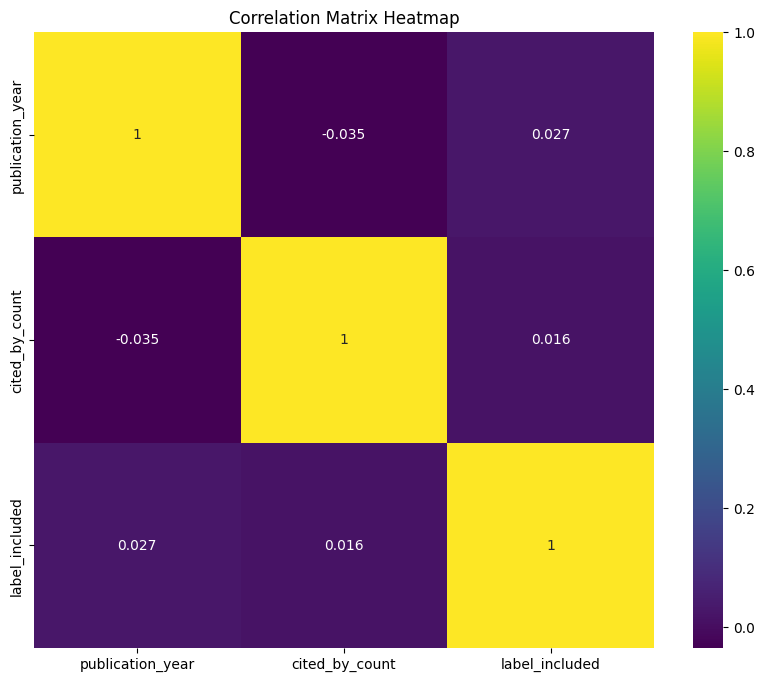

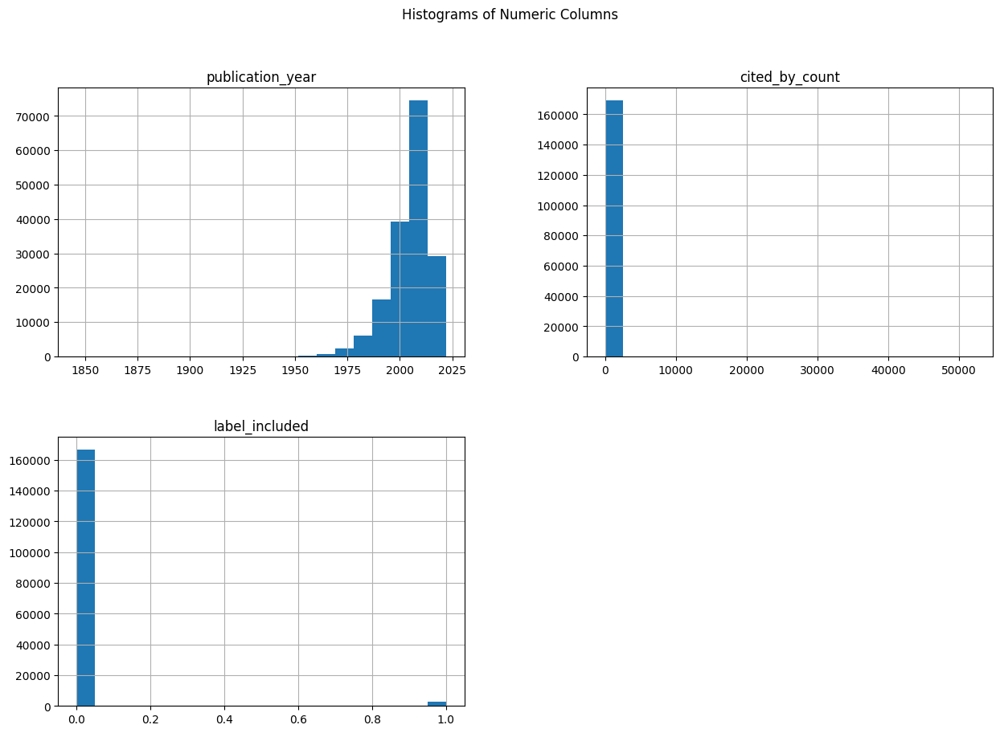

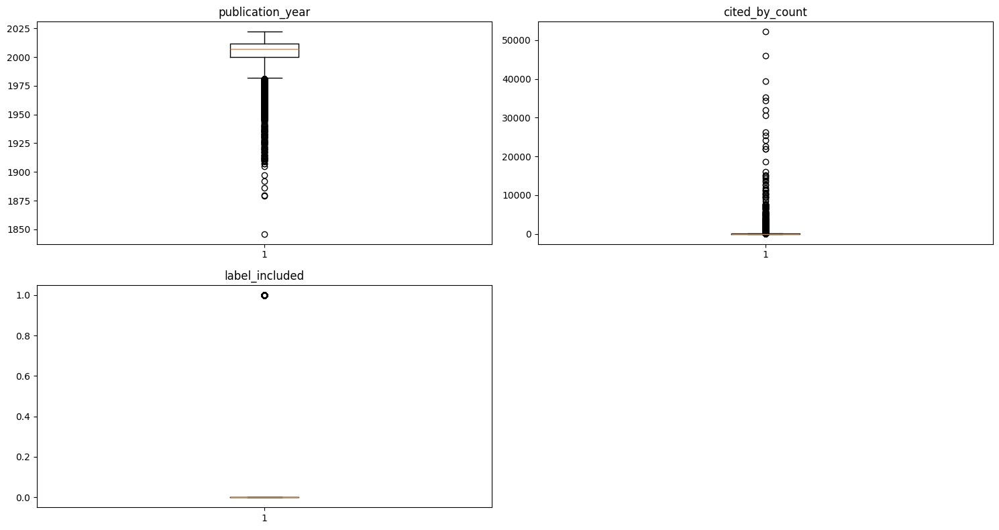


Distribution of 'label_included':


label_included
0    166454
1      2834
Name: count, dtype: int64

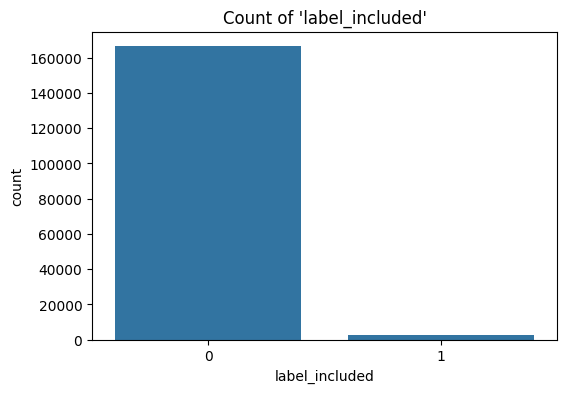

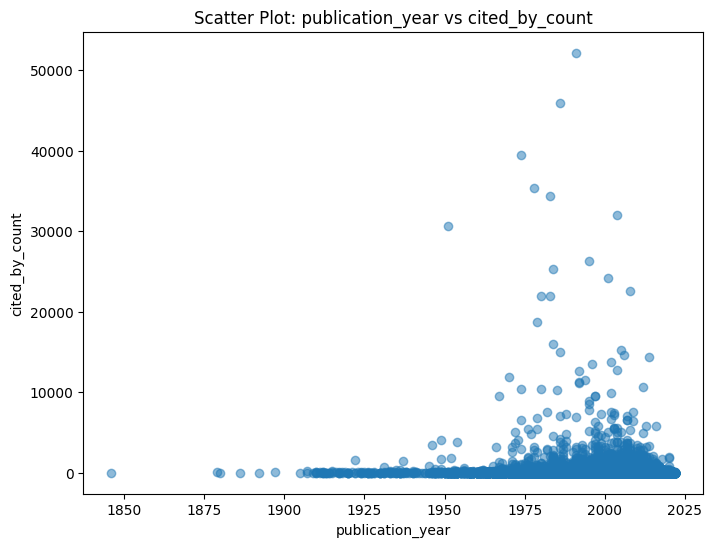


Skipping pairplot due to large dataset size or insufficient numeric columns.


In [4]:
# 2. Basic Summary Statistics (numerical & categorical)
print("\nSummary Statistics (all columns):")
display(df.describe(include='all'))

# 3. DataFrame Information and Missing Value Analysis
print("\nDataFrame Info:")
df.info()

print("\nMissing Values per Column:")
display(df.isnull().sum())

# 4. Data Types and Distribution of Categorical Columns
print("\nData Types:")
display(df.dtypes)

# For each categorical column, show value counts (if any exist)
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
if len(categorical_cols) > 0:
    for col in categorical_cols:
        print(f"\nValue Counts for '{col}':")
        display(df[col].value_counts())
else:
    print("\nNo categorical columns found.")

# 5. Correlation Analysis for Numeric Features
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
if numeric_cols:
    corr_matrix = df[numeric_cols].corr()
    print("\nCorrelation Matrix:")
    display(corr_matrix)
    
    plt.figure(figsize=(10,8))
    sns.heatmap(corr_matrix, annot=True, cmap='viridis')
    plt.title("Correlation Matrix Heatmap")
    plt.show()
else:
    print("\nNo numeric columns found for correlation analysis.")

# 6. Histograms of Numeric Columns to Examine Distributions
if numeric_cols:
    df[numeric_cols].hist(bins=20, figsize=(15, 10))
    plt.suptitle("Histograms of Numeric Columns")
    plt.show()

# 7. Boxplots for Numeric Columns to Identify Outliers
if numeric_cols:
    plt.figure(figsize=(15, 8))
    n_cols = int(np.ceil(len(numeric_cols)/2))
    for i, col in enumerate(numeric_cols):
        plt.subplot(2, n_cols, i+1)
        plt.boxplot(df[col].dropna(), vert=True)
        plt.title(col)
    plt.tight_layout()
    plt.show()

# 8. Analysis of Specific Column 'label_included' if It Exists
if 'label_included' in df.columns:
    print("\nDistribution of 'label_included':")
    display(df['label_included'].value_counts())
    
    plt.figure(figsize=(6,4))
    sns.countplot(x='label_included', data=df)
    plt.title("Count of 'label_included'")
    plt.show()

# 9. Scatter Plot of the First Two Numeric Columns (if available)
if len(numeric_cols) >= 2:
    plt.figure(figsize=(8,6))
    plt.scatter(df[numeric_cols[0]], df[numeric_cols[1]], alpha=0.5)
    plt.xlabel(numeric_cols[0])
    plt.ylabel(numeric_cols[1])
    plt.title(f"Scatter Plot: {numeric_cols[0]} vs {numeric_cols[1]}")
    plt.show()

# 10. Pairplot to Explore Relationships Among Numeric Features (for smaller datasets)
if df.shape[0] < 5000 and len(numeric_cols) > 1:
    sns.pairplot(df[numeric_cols])
    plt.suptitle("Pairplot of Numeric Columns", y=1.02)
    plt.show()
else:
    print("\nSkipping pairplot due to large dataset size or insufficient numeric columns.")


## 1.4. Data analysis of Each DataSet in the MetaDataset

In [9]:
# Group the DataFrame by the source dataset
Counter = 0
Sum = 0
Average = 0

for dataset_name, df_subset in df.groupby('source_dataset'):
    total_rows = df_subset.shape[0]
    print(f"\nDataset: {dataset_name} (Total rows: {total_rows})")
    Counter += 1
    Sum += total_rows
    
    # Calculate missing counts and percentages per column, including '[]' as empty
    missing_counts = df_subset.isnull().sum()
    for col in df_subset.columns:
        missing_counts[col] += df_subset[col].apply(lambda x: x == '[]').sum()     # The lambda function checks if the value in the column is equal to '[]' and returns True if it is, otherwise False.

    missing_percentages = (missing_counts / total_rows * 100).round(2)
    
    # Combine into a summary DataFrame
    missing_summary_df = pd.DataFrame({
        'Missing Count': missing_counts,
        'Missing Percentage': missing_percentages
    })
    
    display(missing_summary_df)

Average = Sum / Counter
print("\nAverage number of rows in each dataset:", Average)


Dataset: Appenzeller-Herzog_2019 (Total rows: 2873)


,Missing Count,Missing Percentage
id,0,0.00
doi,685,23.84
title,5,0.17
display_name,5,0.17
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,636,22.14
host_venue,0,0.00
type,0,0.00



Dataset: Bos_2018 (Total rows: 4878)


,Missing Count,Missing Percentage
id,0,0.00
doi,379,7.77
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,302,6.19
host_venue,0,0.00
type,0,0.00



Dataset: Brouwer_2019 (Total rows: 38114)


,Missing Count,Missing Percentage
id,0,0.00
doi,2229,5.85
title,38,0.10
display_name,38,0.10
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,1529,4.01
host_venue,0,0.00
type,0,0.00



Dataset: Chou_2003 (Total rows: 1908)


,Missing Count,Missing Percentage
id,0,0.00
doi,333,17.45
title,2,0.10
display_name,2,0.10
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,335,17.56
host_venue,0,0.00
type,0,0.00



Dataset: Chou_2004 (Total rows: 1630)


,Missing Count,Missing Percentage
id,0,0.00
doi,207,12.70
title,8,0.49
display_name,8,0.49
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,211,12.94
host_venue,0,0.00
type,0,0.00



Dataset: Donners_2021 (Total rows: 258)


,Missing Count,Missing Percentage
id,0,0.00
doi,2,0.78
title,1,0.39
display_name,1,0.39
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,5,1.94
host_venue,0,0.00
type,0,0.00



Dataset: Hall_2012 (Total rows: 8793)


,Missing Count,Missing Percentage
id,0,0.00
doi,112,1.27
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,5,0.06
host_venue,0,0.00
type,0,0.00



Dataset: Jeyaraman_2020 (Total rows: 1175)


,Missing Count,Missing Percentage
id,0,0.00
doi,36,3.06
title,2,0.17
display_name,2,0.17
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,33,2.81
host_venue,0,0.00
type,0,0.00



Dataset: Leenaars_2019 (Total rows: 5812)


,Missing Count,Missing Percentage
id,0,0.00
doi,274,4.71
title,45,0.77
display_name,45,0.77
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,233,4.01
host_venue,0,0.00
type,0,0.00



Dataset: Leenaars_2020 (Total rows: 7216)


,Missing Count,Missing Percentage
id,0,0.00
doi,1229,17.03
title,47,0.65
display_name,47,0.65
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,1105,15.31
host_venue,0,0.00
type,0,0.00



Dataset: Meijboom_2021 (Total rows: 882)


,Missing Count,Missing Percentage
id,0,0.00
doi,34,3.85
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,37,4.20
host_venue,0,0.00
type,0,0.00



Dataset: Menon_2022 (Total rows: 975)


,Missing Count,Missing Percentage
id,0,0.00
doi,2,0.21
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,5,0.51
host_venue,0,0.00
type,0,0.00



Dataset: Moran_2021 (Total rows: 5214)


,Missing Count,Missing Percentage
id,0,0.00
doi,143,2.74
title,15,0.29
display_name,15,0.29
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,92,1.76
host_venue,0,0.00
type,0,0.00



Dataset: Muthu_2021 (Total rows: 2719)


,Missing Count,Missing Percentage
id,0,0.00
doi,65,2.39
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,85,3.13
host_venue,0,0.00
type,0,0.00



Dataset: Nelson_2002 (Total rows: 366)


,Missing Count,Missing Percentage
id,0,0.00
doi,37,10.11
title,1,0.27
display_name,1,0.27
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,37,10.11
host_venue,0,0.00
type,0,0.00



Dataset: Oud_2018 (Total rows: 952)


,Missing Count,Missing Percentage
id,0,0.00
doi,38,3.99
title,2,0.21
display_name,2,0.21
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,28,2.94
host_venue,0,0.00
type,0,0.00



Dataset: Radjenovic_2013 (Total rows: 5935)


,Missing Count,Missing Percentage
id,0,0.00
doi,63,1.06
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,2,0.03
host_venue,0,0.00
type,0,0.00



Dataset: Sep_2021 (Total rows: 271)


,Missing Count,Missing Percentage
id,0,0.00
doi,0,0.00
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,0,0.00
host_venue,0,0.00
type,0,0.00



Dataset: Smid_2020 (Total rows: 2627)


,Missing Count,Missing Percentage
id,0,0.00
doi,84,3.20
title,5,0.19
display_name,5,0.19
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,15,0.57
host_venue,0,0.00
type,0,0.00



Dataset: Walker_2018 (Total rows: 48375)


,Missing Count,Missing Percentage
id,0,0.00
doi,8259,17.07
title,222,0.46
display_name,222,0.46
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,7490,15.48
host_venue,0,0.00
type,0,0.00



Dataset: Wassenaar_2017 (Total rows: 7668)


,Missing Count,Missing Percentage
id,0,0.00
doi,1357,17.70
title,11,0.14
display_name,11,0.14
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,1249,16.29
host_venue,0,0.00
type,0,0.00



Dataset: Wolters_2018 (Total rows: 4280)


,Missing Count,Missing Percentage
id,0,0.00
doi,300,7.01
title,8,0.19
display_name,8,0.19
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,243,5.68
host_venue,0,0.00
type,0,0.00



Dataset: van_Dis_2020 (Total rows: 9128)


,Missing Count,Missing Percentage
id,0,0.00
doi,440,4.82
title,14,0.15
display_name,14,0.15
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,395,4.33
host_venue,0,0.00
type,0,0.00



Dataset: van_de_Schoot_2018 (Total rows: 4544)


,Missing Count,Missing Percentage
id,0,0.00
doi,256,5.63
title,6,0.13
display_name,6,0.13
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,159,3.50
host_venue,0,0.00
type,0,0.00



Dataset: van_der_Valk_2021 (Total rows: 725)


,Missing Count,Missing Percentage
id,0,0.00
doi,47,6.48
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,25,3.45
host_venue,0,0.00
type,0,0.00



Dataset: van_der_Waal_2022 (Total rows: 1970)


,Missing Count,Missing Percentage
id,0,0.00
doi,61,3.10
title,0,0.00
display_name,0,0.00
publication_year,0,0.00
publication_date,0,0.00
ids,0,0.00
primary_location,61,3.10
host_venue,0,0.00
type,0,0.00



Average number of rows in each dataset: 6511.076923076923


## 1.5. Filter the DataFrame for each Dataset of the MetaDataset

In [7]:
# Filter the DataFrame for the "Jeyaraman_2020" dataset
df_temp = df[df['source_dataset'] == "Jeyaraman_2020"] # choose the dataset here! xxx 

"""
# Further filter for rows where 'doi' is missing
df_missing_doi = df_temp[df_temp['doi'].isnull()]

print("Records missing in 'doi' for dataset temp_2020:")
display(df_missing_doi)
"""

processed_folder_path = os.path.join(os.getcwd(), "data", "pre_processed")
os.makedirs(processed_folder_path, exist_ok=True)
df_temp.to_csv(os.path.join(processed_folder_path, "temp.csv"), index=False) 
print(f"DataFrame saved to {os.path.join(processed_folder_path, 'temp.csv')}") 

display(df_temp)


DataFrame saved to c:\Users\vares\visualization-graph-learning-paper-screening\data\pre_processed\temp.csv


,id,doi,title,display_name,publication_year,publication_date,ids,primary_location,host_venue,type,open_access,authorships,cited_by_count,biblio,is_retracted,is_paratext,concepts,mesh,locations,best_oa_location,alternate_host_venues,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,is_authors_truncated,label_included,source_dataset
58454,https://openalex.org/W3007172259,https://doi.org/10.1186/s12913-016-1423-5,Proceedings of the 3rd IPLeiria’s Internationa...,Proceedings of the 3rd IPLeiria’s Internationa...,2016,2016-07-06,{'openalex': 'https://openalex.org/W3007172259...,"{'is_oa': True, 'landing_page_url': 'https://d...","{'id': 'https://openalex.org/S12898181', 'issn...",journal-article,"{'is_oa': True, 'oa_status': 'gold', 'oa_url':...","[{'author_position': 'first', 'author': {'id':...",301,"{'volume': '16', 'issue': 'S3', 'first_page': ...",False,False,"[{'id': 'https://openalex.org/C518773536', 'wi...",[],"[{'is_oa': True, 'landing_page_url': 'https://...","{'is_oa': True, 'landing_page_url': 'https://d...","[{'id': 'https://openalex.org/S12898181', 'dis...",['https://openalex.org/W2591368092'],"['https://openalex.org/W2073200901', 'https://...",https://api.openalex.org/works/W3007172259/ngrams,"{'Meeting': [0], 'abstracts:': [1], 'Proceedin...",https://api.openalex.org/works?filter=cites:W3...,"[{'year': 2023, 'cited_by_count': 18}, {'year'...",2023-03-22T01:28:51.871407,2020-03-06,True,0,Jeyaraman_2020
58455,https://openalex.org/W2088256967,https://doi.org/10.1016/j.arthro.2013.09.074,Injectable Cultured Bone Marrow–Derived Mesenc...,Injectable Cultured Bone Marrow–Derived Mesenc...,2013,2013-12-01,{'openalex': 'https://openalex.org/W2088256967...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S107905979', 'iss...",journal-article,"{'is_oa': False, 'oa_status': 'closed', 'oa_ur...","[{'author_position': 'first', 'author': {'id':...",282,"{'volume': '29', 'issue': '12', 'first_page': ...",False,False,"[{'id': 'https://openalex.org/C71924100', 'wik...","[{'descriptor_ui': 'D002358', 'descriptor_name...","[{'is_oa': False, 'landing_page_url': 'https:/...",NaN,"[{'id': 'https://openalex.org/S107905979', 'di...","['https://openalex.org/W1555330200', 'https://...","['https://openalex.org/W2041921507', 'https://...",https://api.openalex.org/works/W2088256967/ngrams,"{'To': [0], 'analyze': [1], 'the': [2, 5, 44, ...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 5}, {'year':...",2023-03-30T04:50:55.984061,2016-06-24,NaN,1,Jeyaraman_2020
58456,https://openalex.org/W1830000322,https://doi.org/10.1007/s10529-015-1975-1,Three-dimensional bioprinting in tissue engine...,Three-dimensional bioprinting in tissue engine...,2016,2016-02-01,{'openalex': 'https://openalex.org/W1830000322...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S113993733', 'iss...",journal-article,"{'is_oa': False, 'oa_status': 'closed', 'oa_ur...","[{'author_position': 'first', 'author': {'id':...",165,"{'volume': '38', 'issue': '2', 'first_page': '...",False,False,"[{'id': 'https://openalex.org/C2780609957', 'w...","[{'descriptor_ui': 'D062028', 'descriptor_name...","[{'is_oa': False, 'landing_page_url': 'https:/...",NaN,"[{'id': 'https://openalex.org/S113993733', 'di...","['https://openalex.org/W414944152', 'https://o...","['https://openalex.org/W1830000322', 'https://...",https://api.openalex.org/works/W1830000322/ngrams,"{'With': [0, 128], 'the': [1, 25, 35, 49, 79, ...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2023, 'cited_by_count': 6}, {'year':...",2023-03-25T05:49:50.650101,2016-06-24,NaN,0,Jeyaraman_2020
58457,https://openalex.org/W2504228461,https://doi.org/10.1002/stem.2475,Allogeneic Mesenchymal Stem Cells Stimulate Ca...,Allogeneic Mesenchymal Stem Cells Stimulate Ca...,2017,2017-01-01,{'openalex': 'https://openalex.org/W2504228461...,"{'is_oa': T

Between Mesh and Concept -> concept is better because Mesh has a lot of EmptyData as: []

## 1.6. Choosing the best subDataset for the Prototype and Test

### Recommended Dataset: **Jeyaraman_2020** (Systematic Review on Knee Osteoarthritis)  
Among the ASReview SYNERGY collection, **Jeyaraman_2020** emerges as the best choice for the initial prototype. This dataset hits the sweet spot on all the above criteria:

- **Manageable Size:** The Jeyaraman_2020 set contains **1,175 records**, which is small enough for quick testing and debugging ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=6%20Donners_2021%20Medicine%20258%2015,1)). In contrast, some SYNERGY datasets are much larger (e.g. *Brouwer_2019* with 38,114 papers ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=1%20Appenzeller,8))), which would slow down development. Starting with ~1k papers ensures the prototype can be run and iterated rapidly.  
- **Realistic Class Imbalance:** Only **96 out of 1,175 papers are included** as relevant in Jeyaraman_2020 (approximately **8.2%** positive class) ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=6%20Donners_2021%20Medicine%20258%2015,1)). This reflects a substantial class imbalance typical of screening tasks, albeit not as extreme as some other reviews (SYNERGY’s overall inclusion rate is ~1.67% ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=SYNERGY%20is%20a%20free%20and,contains%2082%2C668%2C134%20trainable%20data%20points)), and some topics have as low as 0.2% included ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=1%20Appenzeller,8))). An ~8% inclusion rate means the model will experience the skewed class distribution and rarity of relevant studies, simulating real screening challenges. At the same time, it provides nearly a hundred positive examples, which is helpful for training and evaluating the prototype (extremely imbalanced cases with only a handful of inclusions might be too difficult for an initial model).  
- **Citation Network Availability:** Each record in Jeyaraman_2020 comes with its list of **referenced works** (citations) as part of the metadata ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=type%20String%20The%20type%20or,or%20topics)). These citation relationships allow us to build a graph of how papers cite one another. This is ideal for future graph learning integration – the prototype can later incorporate network-based features or Graph Neural Networks using this citation graph. Working with Jeyaraman_2020 ensures we don’t have to add citation data manually; it’s already included and can be readily used to connect nodes (papers) in a graph structure.  
- **Relevant Domain:** The dataset is drawn from a **biomedical systematic review** (on mesenchymal stem cell sources for knee osteoarthritis treatment). Its topic falls under medicine ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=6%20Donners_2021%20Medicine%20258%2015,1)), a domain where systematic literature screening is a critical task (e.g. in evidence-based medicine and clinical guideline development). Using a medical review dataset means the prototype deals with content and challenges representative of real-world literature screening. The terminology and study designs (e.g. clinical trials) are typical for screening applications, and the results will be relevant to common use-cases. (By contrast, some other SYNERGY datasets with high inclusion rates, like *Nelson_2002* with ~22% included ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=12%20Menon_2022%20Medicine%20975%2074,8)), or those in niche domains, might not generalize as well to typical screening scenarios.)

**Why Jeyaraman_2020 is the Best Choice:** This dataset offers an excellent balance of size and complexity. It is large enough to be realistic but not so large as to hinder rapid prototyping. The class imbalance (~92% of papers are irrelevant) will force the model to prioritize efficient learning – mirroring the challenge of real systematic reviews – without being so extreme that the model has virtually no positive samples to learn from. Crucially, the inclusion of **citation links** meets the graph integration requirement: one can easily map out which papers cite others, laying the groundwork for graph-based learning algorithms. Finally, its medical domain and systematic review context ensure that insights from the prototype will be applicable to real literature screening tasks (e.g. prioritizing clinical studies for inclusion). In summary, **Jeyaraman_2020** is the most suitable dataset for a first modular prototype because it is **small and fast to work with, realistically imbalanced, rich in citation data, and rooted in a meaningful domain** – all factors that will help the development and testing of a graph-assisted screening model succeed ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=6%20Donners_2021%20Medicine%20258%2015,1)) ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=type%20String%20The%20type%20or,or%20topics)).

**Sources:**

- van de Schoot, R. *et al.* (2023). *SYNERGY: An open dataset for machine learning in systematic reviews.* **GitHub Repository** – *ASReview Synergy Dataset description and contents* ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=SYNERGY%20is%20a%20free%20and,contains%2082%2C668%2C134%20trainable%20data%20points)) ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=Nr%20Dataset%20Topic,2)) ([GitHub - asreview/synergy-dataset: SYNERGY - Open machine learning dataset on study selection in systematic reviews](https://github.com/asreview/synergy-dataset#:~:text=type%20String%20The%20type%20or,or%20topics)).

## 1.7. OpenAlex PipeLine

In [ ]:
import requests
import pandas as pd

# Define paper ID from OpenAlex
#paper_id = "W3007172259"
paper_id = "W3007172259" # Medicine
url = f"https://api.openalex.org/works/{paper_id}"

# Get JSON response from OpenAlex API
response = requests.get(url).json()

# List of available attributes in the response:
# response['id']
# response['doi']
# response['title']
# response['display_name']
# response['publication_year']
# response['publication_date']
# response['type']
# response['cited_by_count']
# response['is_retracted']
# response['is_paratext']
# response['authorships'] (list of authors)
# response['host_venue'] (journal or venue details)
# response['abstract_inverted_index']
# response['referenced_works'] #referenced_works directly represents the list of paper IDs that the current paper explicitly cites
# response['related_works'] #Related_works is provided by OpenAlex to indicate papers related by concept or semantic similarity, not necessarily by direct citation
# response['concepts'] (research areas/topics)
# response['alternate_host_venues']
# response['open_access']
# response['apc_list']
# response['apc_paid']
# response['mesh'] (medical subject headings, if applicable)

# Full Concepts Attributes:
concepts_full = [
    {
        'id': concept.get('id'),
        'wikidata': concept.get('wikidata'),
        'display_name': concept.get('display_name'),
        'level': concept.get('level'),
        'score': concept.get('score')
    } 
    for concept in response.get('concepts', [])
]
# Filtering by Score (e.g., only score > 0.5):
high_confidence_concepts = [
    concept['display_name'] 
    for concept in response.get('concepts', []) 
    if concept.get('score', 0) > 0.5
]
# Filtered Concepts Attributes:
filtered_concepts_full = [
    {
        'id': concept.get('id'),
        'wikidata': concept.get('wikidata'),
        'display_name': concept.get('display_name'),
        'level': concept.get('level'),
        'score': concept.get('score')
    } 
    for concept in response.get('concepts', [])
    if concept.get('score', 0) > 0.5
]

# Select specific attributes you want:
selected_data = {
    "id": response.get('id'),
    "title": response.get('title'),
    "doi": response.get('doi'),
    "publication_year": response.get('publication_year'),
    "type": response.get('type'),
    "cited_by_count": response.get('cited_by_count'),
    "authors": [author['author']['display_name'] for author in response.get('authorships', [])],
    "abstract": response.get('abstract_inverted_index'),
    "concepts": concepts_full, # change here to filtered_concepts_full to get only high confidence concepts or concepts_full to get all concepts with their scores and levels
    "venue": response.get('host_venue', {}).get('display_name'),
    "is_open_access": response.get('open_access', {}).get('is_oa'),
    "cited_by_api_url" : response.get('cited_by_api_url'),
    "referenced_works": response.get('referenced_works'),
    "related_works": response.get('related_works')  # optional but useful
}

# Pretty-print selected data
#from pprint import pprint
#pprint(selected_data)

# Convert the dictionary into a DataFrame (table)
df = pd.DataFrame([selected_data])

# Save the DataFrame to CSV
#df.to_csv("paper_data.csv", index=False)

print("Data successfully saved to paper_data.csv")


Data successfully saved to paper_data.csv


In [17]:
#pd.set_option('display.max_colwidth', None)
#print(df['cited_by_api_url'].to_string(index=False))
#print (df['concepts'].to_string(index=False))
df['concepts']

0    [{'id': 'https://openalex.org/C2778805511', 'w...
Name: concepts, dtype: object

# Section 2. ALGO_AI


### Description

To achive this we need to have a good resoning, we need to define the Problem and its Domain first to find the Best Architucture and Answer.

There Would be 3 Valid Algo to solve the problem Proposed:

A.  NLP (Semantic Relation) [P<->P]

B.  TF-IDF & Cosine Similarity (Keyword Relation) [P<->P]

C.  Paper To concept Graph Relation [P<->C]

D. Citation Network [P->P]

P.S. Please Reset the Kernel between each section

## 2.0. DATA PREPROCESSING and Saving Workflow for Jeyaraman_2020

In [1]:
#Importing the required libraries
import os
import json
import pandas as pd
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import unicodedata
os.getcwd()
os.chdir("../")
print("Current working directory:", os.getcwd())

Current working directory: c:\Users\vares\visualization-graph-learning-paper-screening


In [2]:
###############################################################################
# STEP 1: DATA LOADING & COMBINATION
#   - To build a robust graph-based system, we must first reliably load and 
#     combine all raw data files from the dataset.
#   - The dataset files may be stored in CSV or JSON format. We convert them 
#     into a unified pandas DataFrame for subsequent analysis.
#   - MERGE LABELS INTO THE DATAFRAME
#   - To perform supervised or semi-supervised analysis, it is essential to
#     integrate the sparse inclusion labels with the raw records.
#   - Here we merge the labels based on unique identifiers and ensure missing
#     labels are set to a default (0, representing exclusion).
###############################################################################

# 1. Load data file (CSV or JSON) from a given file path.
def load_data_file(filepath: str) -> pd.DataFrame:
    """Load a dataset file from CSV or JSON format.
       For JSON, assume the file is a dictionary where keys are indices.
    """
    if filepath.endswith('.csv'):
        df = pd.read_csv(filepath)
    elif filepath.endswith('.json'):
        with open(filepath, 'r', encoding='utf-8') as f:
            data = json.load(f)
        # If the JSON is a dictionary with numeric keys, convert it into a list of items
        if isinstance(data, dict):
            sorted_items = [data[key] for key in sorted(data, key=lambda x: int(x))]
            df = pd.DataFrame(sorted_items)
        else:
            df = pd.DataFrame(data)
    else:
        raise ValueError(f"Unsupported file format: {filepath}")
    return df

# 2. Load all files in a "works_*" folder.
def load_works_folder(works_folder_path: str) -> pd.DataFrame:
    """Load and combine all dataset files (CSV or JSON) from a works folder."""
    dfs = []
    for file in os.listdir(works_folder_path):
        if file.endswith('.csv') or file.endswith('.json'):
            filepath = os.path.join(works_folder_path, file)
            print(f"Loading file: {filepath}")
            df_temp = load_data_file(filepath)
            dfs.append(df_temp)
    if not dfs:
        raise ValueError("No valid dataset files found in folder: " + works_folder_path)
    combined_df = pd.concat(dfs, ignore_index=True)
    return combined_df

# 3. Load one dataset folder (e.g., Jeyaraman_2020) that may have one or more works subfolders and an optional labels file.
def load_dataset_from_dir(dataset_dir: str) -> pd.DataFrame:
    """Load a single dataset folder, combining all its works folders and merging labels if available."""
    dfs = []
    # Loop through subdirectories starting with "works"
    for subfolder in os.listdir(dataset_dir):
        subfolder_path = os.path.join(dataset_dir, subfolder)
        if os.path.isdir(subfolder_path) and subfolder.startswith('works'):
            print(f"Loading works folder: {subfolder_path}")
            df_works = load_works_folder(subfolder_path)
            dfs.append(df_works)
    
    if not dfs:
        raise ValueError("No valid works folders found in dataset folder: " + dataset_dir)
    dataset_df = pd.concat(dfs, ignore_index=True)
    
    # Merge labels if labels.csv exists in the dataset folder
    labels_path = os.path.join(dataset_dir, "labels.csv")
    if os.path.exists(labels_path):
        print(f"Loading labels file: {labels_path}")
        df_labels = pd.read_csv(labels_path)
        dataset_df = dataset_df.merge(
            df_labels[['openalex_id', 'label_included']], 
            left_on='id', 
            right_on='openalex_id', 
            how='left'
        )
        dataset_df['label_included'] = dataset_df['label_included'].fillna(0).astype(int)
        dataset_df.drop(columns=['openalex_id'], inplace=True)
    
    return dataset_df


# Set folder path and load data
xxx = "Jeyaraman_2020" #xxx you can change the sebdataset here
folder_path = os.path.join(os.getcwd(), "data", "raw", xxx)
df_merged = load_dataset_from_dir(folder_path)
print("Combined DataFrame shape:", df_merged.shape)
display(df_merged.head(5),df_merged.shape)

'''
###############################################################################
# STEP 2: MERGE LABELS INTO THE DATAFRAME
#   - To perform supervised or semi-supervised analysis, it is essential to
#     integrate the sparse inclusion labels with the raw records.
#   - Here we merge the labels based on unique identifiers and ensure missing
#     labels are set to a default (0, representing exclusion).
###############################################################################

# Path to the labels file
labels_path = os.path.join(os.getcwd(), "data", "raw", "Jeyaraman_2020", "labels.csv")
df_labels = pd.read_csv(labels_path)
display(df_labels.head())

# Merge labels: left join on 'id' from df_combined and 'openalex_id' from df_labels
df_merged = df_combined.merge(
    df_labels[['openalex_id', 'label_included']],
    left_on='id', 
    right_on='openalex_id', 
    how='left'
).drop(columns='openalex_id')
# Check for missing values
print("Missed values",df_merged.isnull().sum())
print("Shape of df_merged:", df_merged.shape)
df_merged.head()
# Set missing labels to 0 (excluded) and drop the extra column
#df_merged['label_included'] = df_merged['label_included'].fillna(0).astype(int)
#df_merged.drop(columns=['openalex_id'], inplace=True)
#display(df_merged.head())
#print("Number of rows in merged DataFrame:", df_merged.shape[0])
#print("Number of labeled rows (included):", df_merged['label_included'].sum())
#print(df_merged)
#print(df_merged.head(5).to_string())
'''

###############################################################################
# STEP 3: TEXT PROCESSING
#   - To analyze textual data (titles and abstracts), we must convert any
#     specialized formats into plain text and clean it.
#   - This includes reconstructing abstracts from inverted indexes and standard
#     text cleaning operations (e.g., lowercasing, whitespace normalization).
###############################################################################

def inverted_index_to_text(inverted_index):
    """
    Convert an 'abstract_inverted_index' dict into a plain text string.
    Reconstruct by sorting tokens according to their positions.
    """
    if not isinstance(inverted_index, dict):  # Check if the input is a dictionary
        return ""  # Return an empty string if not a dictionary
    
    tokens_and_positions = []  # Initialize an empty list to store tokens and their positions
    for token, positions in inverted_index.items():  # Iterate over the dictionary items
        for pos in positions:  # Iterate over the positions for each token
            tokens_and_positions.append((pos, token))  # Append the position and token as a tuple to the list
    tokens_and_positions.sort(key=lambda x: x[0])  # Sort the list of tuples by the position (first element of the tuple)
    text = " ".join(token for _, token in tokens_and_positions)  # Join the tokens to form the reconstructed text
    return text  # Return the reconstructed text

# Reconstruct abstract text from inverted index
df_merged['abstract_clean'] = df_merged['abstract_inverted_index'].apply(inverted_index_to_text)

def normalize_text(text):
    """Normalize unicode text to NFC form."""
    return unicodedata.normalize('NFC', text)

'''
def remove_diacritics(text):
    """Remove diacritical marks from a string."""
    normalized = unicodedata.normalize('NFKD', text)
    return ''.join(c for c in normalized if not unicodedata.combining(c))
'''

def clean_text(text):
    """Basic text cleaning: normalize unicode, lowercasing, and extra whitespace removal."""
    if not isinstance(text, str):
        return ""
    text = normalize_text(text)  # or remove_diacritics(text) if that's preferred
    text = text.lower()
    text = re.sub(r"\s+", " ", text).strip()
    return text


# Apply text cleaning to titles and abstracts
df_merged['title_clean'] = df_merged['title'].apply(clean_text)
df_merged['abstract_clean'] = df_merged['abstract_clean'].apply(clean_text)

# Apply text:
#df_merged['text'] = df_merged['title_clean'] + ' ' + df_merged['abstract_clean']

# Compute word count for abstracts (could be used for filtering or analysis)
#df_merged['text_word_count'] = df_merged['text'].apply(lambda x: len(x.split()))

###############################################################################
# STEP Test: pre-processed DataFrame
display('After Data Processing',df_merged.head(5),df_merged.shape)
#print(df_merged.head(1).to_string())
#print(df_merged.shape)
#print(df_merged.columns)
#df_merged.info()
#df_merged.describe()
# print(df_merged['text'])
# print(df_merged['label_included'])
# print(df_merged['abstract_word_count'])
# print(df_merged['abstract_clean'])
# print(df_merged['title_clean'])
# print(df_merged['abstract'])
# print(df_merged['title'])
# print(df_merged['abstract_inverted_index'])
# print(df_merged['id'])
# print(df_merged['source'])
# print(df_merged['year'])
# print(df_merged['authors'])
# print(df_merged['doi'])
# print(df_merged['url'])
# print(df_merged['journal'])
# print(df_merged['keywords'])
# print(df_merged['label_included'])    
###############################################################################


###############################################################################
# STEP 4: Save the processed DataFrame
#   - Save the processed DataFrame to a CSV file for subsequent analysis.
#   - The saved file will be stored in the 'processed' folder of the dataset.
###############################################################################
processed_folder_path = os.path.join(os.getcwd(), "data", "pre_processed")
os.makedirs(processed_folder_path, exist_ok=True)
df_merged.to_csv(os.path.join(processed_folder_path, "temp.csv"), index=False) 
print(f"DataFrame saved to {os.path.join(processed_folder_path, 'temp.csv')}") 

Loading works folder: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_0_25.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_1000_1025.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_100_125.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_1025_1050.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_1050_1075.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_1075_1100.json
Loading file: c:\Users\vares\visualization-graph-learning-paper-screening\data\raw\Jeyaraman_2020\works_1\works_1100_1125.json
Load

,id,doi,title,display_name,publication_year,publication_date,ids,primary_location,host_venue,type,...,alternate_host_venues,referenced_works,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,label_included
0,https://openalex.org/W3007172259,https://doi.org/10.1186/s12913-016-1423-5,Proceedings of the 3rd IPLeiria’s Internationa...,Proceedings of the 3rd IPLeiria’s Internationa...,2016,2016-07-06,{'openalex': 'https://openalex.org/W3007172259...,"{'is_oa': True, 'landing_page_url': 'https://d...","{'id': 'https://openalex.org/S12898181', 'issn...",journal-article,...,"[{'id': 'https://openalex.org/S12898181', 'dis...",[https://openalex.org/W2591368092],"[https://openalex.org/W2073200901, https://ope...",https://api.openalex.org/works/W3007172259/ngrams,"{'Meeting': [0], 'abstracts:': [1], 'Proceedin...",https://api.openalex.org/works?filter=cites:W3...,"[{'year': 2023, 'cited_by_count': 18}, {'year'...",2023-03-22T01:28:51.871407,2020-03-06,0
1,https://openalex.org/W2088256967,https://doi.org/10.1016/j.arthro.2013.09.074,Injectable Cultured Bone Marrow–Derived Mesenc...,Injectable Cultured Bone Marrow–Derived Mesenc...,2013,2013-12-01,{'openalex': 'https://openalex.org/W2088256967...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S107905979', 'iss...",journal-article,...,"[{'id': 'https://openalex.org/S107905979', 'di...","[https://openalex.org/W1555330200, https://ope...","[https://openalex.org/W2041921507, https://ope...",https://api.openalex.org/works/W2088256967/ngrams,"{'To': [0], 'analyze': [1], 'the': [2, 5, 44, ...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 5}, {'year':...",2023-03-30T04:50:55.984061,2016-06-24,1
2,https://openalex.org/W1830000322,https://doi.org/10.1007/s10529-015-1975-1,Three-dimensional bioprinting in tissue engine...,Three-dimensional bioprinting in tissue engine...,2016,2016-02-01,{'openalex': 'https://openalex.org/W1830000322...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S113993733', 'iss...",journal-article,...,"[{'id': 'https://openalex.org/S113993733', 'di...","[https://openalex.org/W414944152, https://open...","[https://openalex.org/W1830000322, https://ope...",https://api.openalex.org/works/W1830000322/ngrams,"{'With': [0, 128], 'the': [1, 25, 35, 49, 79, ...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2023, 'cited_by_count': 6}, {'year':...",2023-03-25T05:49:50.650101,2016-06-24,0
3,https://openalex.org/W2504228461,https://doi.org/10.1002/stem.2475,Allogeneic Mesenchymal Stem Cells Stimulate Ca...,Allogeneic Mesenchymal Stem Cells Stimulate Ca...,2017,2017-01-01,{'openalex': 'https://openalex.org/W2504228461...,"{'is_oa': True, 'landing_page_url': 'https://d...","{'id': 'https://openalex.org/S65139510', 'issn...",journal-article,...,"[{'id': 'https://openalex.org/S65139510', 'dis...","[https://openalex.org/W1790809173, https://ope...","[https://openalex.org/W65142845, https://opena...",https://api.openalex.org/works/W2504228461/ngrams,"{'Abstract': [0], 'Traditionally,': [1], 'mese...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 3}, {'year':...",2023-03-27T18:05:49.765526,2016-08-23,0
4,https://openalex.org/W2057344590,https://doi.org/10.1016/j.msec.2005.07.024,Preparation of a biphasic scaffold for osteoch...,Preparation of a biphasic scaffold for osteoch...,2006,2006-01-01,{'openalex': 'https://openalex.org/W2057344590...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S43139658', 'issn...",journal-article,...,"[{'id': 'https://openalex.org/S43139658', 'dis...","[https://openalex.org/W152654618, https://open...","[https://openalex.org/W2014762318, https://ope...",https://api.openalex.org/works/W2057344590/ngrams,"{'Abstract': [0], 'Tissue': [3], 'engineering'...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2022

(1175, 31)

'After Data Processing'

,id,doi,title,display_name,publication_year,publication_date,ids,primary_location,host_venue,type,...,related_works,ngrams_url,abstract_inverted_index,cited_by_api_url,counts_by_year,updated_date,created_date,label_included,abstract_clean,title_clean
0,https://openalex.org/W3007172259,https://doi.org/10.1186/s12913-016-1423-5,Proceedings of the 3rd IPLeiria’s Internationa...,Proceedings of the 3rd IPLeiria’s Internationa...,2016,2016-07-06,{'openalex': 'https://openalex.org/W3007172259...,"{'is_oa': True, 'landing_page_url': 'https://d...","{'id': 'https://openalex.org/S12898181', 'issn...",journal-article,...,"[https://openalex.org/W2073200901, https://ope...",https://api.openalex.org/works/W3007172259/ngrams,"{'Meeting': [0], 'abstracts:': [1], 'Proceedin...",https://api.openalex.org/works?filter=cites:W3...,"[{'year': 2023, 'cited_by_count': 18}, {'year'...",2023-03-22T01:28:51.871407,2020-03-06,0,meeting abstracts: proceedings of the 3rd iple...,proceedings of the 3rd ipleiria’s internationa...
1,https://openalex.org/W2088256967,https://doi.org/10.1016/j.arthro.2013.09.074,Injectable Cultured Bone Marrow–Derived Mesenc...,Injectable Cultured Bone Marrow–Derived Mesenc...,2013,2013-12-01,{'openalex': 'https://openalex.org/W2088256967...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S107905979', 'iss...",journal-article,...,"[https://openalex.org/W2041921507, https://ope...",https://api.openalex.org/works/W2088256967/ngrams,"{'To': [0], 'analyze': [1], 'the': [2, 5, 44, ...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 5}, {'year':...",2023-03-30T04:50:55.984061,2016-06-24,1,to analyze the results of the use of intra-art...,injectable cultured bone marrow–derived mesenc...
2,https://openalex.org/W1830000322,https://doi.org/10.1007/s10529-015-1975-1,Three-dimensional bioprinting in tissue engine...,Three-dimensional bioprinting in tissue engine...,2016,2016-02-01,{'openalex': 'https://openalex.org/W1830000322...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S113993733', 'iss...",journal-article,...,"[https://openalex.org/W1830000322, https://ope...",https://api.openalex.org/works/W1830000322/ngrams,"{'With': [0, 128], 'the': [1, 25, 35, 49, 79, ...",https://api.openalex.org/works?filter=cites:W1...,"[{'year': 2023, 'cited_by_count': 6}, {'year':...",2023-03-25T05:49:50.650101,2016-06-24,0,"with the advances of stem cell research, devel...",three-dimensional bioprinting in tissue engine...
3,https://openalex.org/W2504228461,https://doi.org/10.1002/stem.2475,Allogeneic Mesenchymal Stem Cells Stimulate Ca...,Allogeneic Mesenchymal Stem Cells Stimulate Ca...,2017,2017-01-01,{'openalex': 'https://openalex.org/W2504228461...,"{'is_oa': True, 'landing_page_url': 'https://d...","{'id': 'https://openalex.org/S65139510', 'issn...",journal-article,...,"[https://openalex.org/W65142845, https://opena...",https://api.openalex.org/works/W2504228461/ngrams,"{'Abstract': [0], 'Traditionally,': [1], 'mese...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2023, 'cited_by_count': 3}, {'year':...",2023-03-27T18:05:49.765526,2016-08-23,0,"abstract traditionally, mesenchymal stem cells...",allogeneic mesenchymal stem cells stimulate ca...
4,https://openalex.org/W2057344590,https://doi.org/10.1016/j.msec.2005.07.024,Preparation of a biphasic scaffold for osteoch...,Preparation of a biphasic scaffold for osteoch...,2006,2006-01-01,{'openalex': 'https://openalex.org/W2057344590...,"{'is_oa': False, 'landing_page_url': 'https://...","{'id': 'https://openalex.org/S43139658', 'issn...",journal-article,...,"[https://openalex.org/W2014762318, https://ope...",https://api.openalex.org/works/W2057344590/ngrams,"{'Abstract': [0], 'Tissue': [3], 'engineering'...",https://api.openalex.org/works?filter=cites:W2...,"[{'year': 2022, 'cited_by_count': 1}, {'year':...",2023-03-26T09:39:38.754319,2016-06-24,0,abstract tissue engineering has be

(1175, 33)

DataFrame saved to c:\Users\vares\visualization-graph-learning-paper-screening\data\pre_processed\temp.csv


### Pipeline to get the topics

Based on the OpenAlex documentation, making 2000 individual API calls is well within the daily limit (typically 100,000 requests per day). With a 0.5‑second delay between requests. 
https://github.com/ourresearch/openalex-topic-classification

https://zenodo.org/records/10560276

https://openalex.org/works?page=1&filter=title_and_abstract.search%3Aopenalex%20topic&zoom=w4393879892

In [7]:
import pandas as pd
import requests
import time

# Create the processed folder path using the current working directory
processed_folder_path = os.path.join(os.getcwd(), "data", "pre_processed")
os.makedirs(processed_folder_path, exist_ok=True)

# Define the CSV file path
csv_file = os.path.join(processed_folder_path, "temp.csv")

def get_topics_retry(work_id_url, max_retries=3, initial_delay=1):
    """
    Given a work URL from OpenAlex (e.g., "https://openalex.org/W3007172259"),
    convert it to the API endpoint and attempt to fetch the work's topics.
    Retries up to max_retries times with exponential backoff.
    Returns a list of topic dictionaries (with keys: id, display_name, score, subfield, field, domain).
    """
    # Convert the work URL to the API endpoint
    if work_id_url.startswith("https://openalex.org/"):
        work_id = work_id_url.rstrip("/").split("/")[-1]
        api_url = f"https://api.openalex.org/works/{work_id}"
    else:
        api_url = work_id_url

    retries = 0
    delay = initial_delay
    while retries < max_retries:
        try:
            response = requests.get(api_url)
            if response.status_code == 200:
                data = response.json()
                # Return the entire topics list (each topic is a dictionary with full attributes)
                topics = data.get("topics", [])
                return topics
            else:
                print(f"Error fetching {api_url}: HTTP {response.status_code}")
        except Exception as e:
            print(f"Exception fetching {api_url}: {e}")
        retries += 1
        print(f"Retry {retries}/{max_retries} after {delay} seconds...")
        time.sleep(delay)
        delay *= 2  # Exponential backoff
    # If still unsuccessful, return an empty list
    return []

def topics_missing(topics):
    """Return True if the topics field is missing or empty."""
    if pd.isna(topics):
        return True
    if isinstance(topics, str) and topics.strip() in ["", "[]"]:
        return True
    return False

# Load the CSV file into a DataFrame
df = pd.read_csv(csv_file)

# List to collect updated topics for each row
updated_topics = []

# Iterate over each row and update topics for those missing them
for idx, row in df.iterrows():
    current_topics = row.get("openalex_topics")
    if topics_missing(current_topics):
        work_url = row["id"]  # Assumes 'id' column contains the OpenAlex work URL
        print(f"Retry fetching topics for work: {work_url}")
        new_topics = get_topics_retry(work_url)
        updated_topics.append(new_topics)
    else:
        # If topics are stored as a string, try to evaluate them into a Python object
        if isinstance(current_topics, str):
            try:
                parsed_topics = eval(current_topics)
                updated_topics.append(parsed_topics)
            except Exception:
                updated_topics.append(current_topics)
        else:
            updated_topics.append(current_topics)

# Update the DataFrame with the new topics
df["openalex_topics"] = updated_topics

# Save back to the same CSV file
df.to_csv(csv_file, index=False)
print(f"Updated CSV saved to: {csv_file}")

# Print the full topics attribute for a sample paper (first row) for verification
sample_paper = df.iloc[0]
print("Sample paper topics:")
print(sample_paper["openalex_topics"])


Updated CSV saved to: c:\Users\vares\visualization-graph-learning-paper-screening\data\pre_processed\temp.csv
Sample paper topics:
[{'id': 'https://openalex.org/T11519', 'display_name': 'Digital Mental Health Interventions', 'score': 0.9252, 'subfield': {'id': 'https://openalex.org/subfields/3202', 'display_name': 'Applied Psychology'}, 'field': {'id': 'https://openalex.org/fields/32', 'display_name': 'Psychology'}, 'domain': {'id': 'https://openalex.org/domains/2', 'display_name': 'Social Sciences'}}, {'id': 'https://openalex.org/T13883', 'display_name': 'Child and Adolescent Health', 'score': 0.9003, 'subfield': {'id': 'https://openalex.org/subfields/3600', 'display_name': 'General Health Professions'}, 'field': {'id': 'https://openalex.org/fields/36', 'display_name': 'Health Professions'}, 'domain': {'id': 'https://openalex.org/domains/4', 'display_name': 'Health Sciences'}}]


Pipeline to load the Topic model on System:

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("text-classification", model="OpenAlex/bert-base-multilingual-cased-finetuned-openalex-topic-classification-title-abstract")

## 2.1. (A) NLP (Semantic Relation) [P<->P]

### 2.1.0. Installations

In [ ]:
%pip install datasets transformers transformers[torch]
%pip install --upgrade accelerate

### 2.1.1 ScieBert TEST

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer,
    DataCollatorWithPadding
)

# Define paths and load the CSV
processed_folder_path = os.path.join(os.getcwd(), "data", "pre_processed")
csv_path = os.path.join(processed_folder_path, "temp.csv")
df = pd.read_csv(csv_path)
print("DataBase loaded from:", csv_path)

# Primary text for Model: abstract + title (cleaned) as there were 2 missing Nan Value were located in title and abstract of this dataset
df['abstract_clean'] = df['abstract_clean'].fillna('') #fillna replaces any missing (NaN) values in a DataFrame column with an empty string (""). This is especially useful in text processing.
df['title_clean'] = df['title_clean'].fillna('')
df['text'] = df['abstract_clean'] + " " + df['title_clean']

# Select the needed columns and rename 'label_included' to 'labels'
df = df[['text', 'label_included']].rename(columns={"label_included": "labels"})
df['labels'] = df['labels'].astype(int)

# Split data into train and validation sets (using stratification due to imbalance)
train_df, val_df = train_test_split(
    df, test_size=0.2, stratify=df['labels'], random_state=42
)

# Convert pandas DataFrames into Hugging Face Datasets
train_dataset = Dataset.from_pandas(train_df)
val_dataset = Dataset.from_pandas(val_df)

# Load SciBERT tokenizer and model
model_name = "allenai/scibert_scivocab_uncased"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2)

# Define tokenization function
def tokenize_function(examples):
    return tokenizer(examples["text"], truncation=True, padding="max_length", max_length=512)

# Tokenize datasets (batched)
train_dataset = train_dataset.map(tokenize_function, batched=True)
val_dataset = val_dataset.map(tokenize_function, batched=True)

# Set the format for PyTorch tensors (ensure "labels" is included)
columns = ["input_ids", "attention_mask", "labels"]
train_dataset.set_format(type="torch", columns=columns)
val_dataset.set_format(type="torch", columns=columns)

# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=3,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=50,
)

# Define a compute_metrics function for evaluation
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(-1)
    accuracy = (predictions == labels).mean()
    return {"accuracy": accuracy}

# Initialize the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    data_collator=DataCollatorWithPadding(tokenizer=tokenizer),
)

# Begin training
trainer.train()

# Evaluate the model on the validation set
eval_results = trainer.evaluate()
print("Evaluation results:", eval_results)


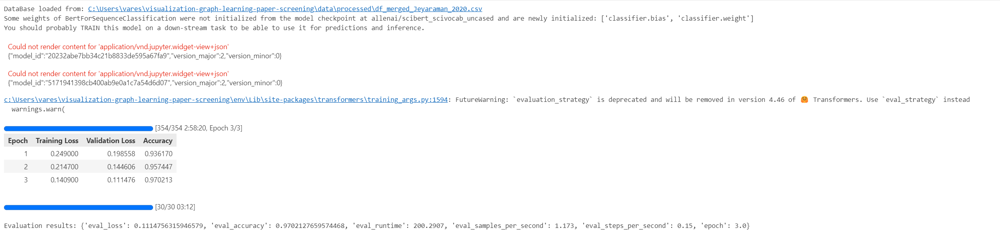

### 2.1.2 Scibert Fully Evaluation based on labeled 1 vs 0

In [ ]:
import os
import pandas as pd
from datasets import Dataset
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TrainingArguments, Trainer, DataCollatorWithPadding
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# Load the CSV and prepare the validation dataset
processed_folder_path = os.path.join(os.getcwd(), "../", "data", "pre_processed")
csv_path = os.path.join(processed_folder_path, "temp.csv")
df = pd.read_csv(csv_path)
print("Database loaded from:", csv_path)

# Select needed columns and rename for Hugging Face conventions
df = df[['text', 'label_included']].rename(columns={"label_included": "labels"})
df['labels'] = df['labels'].astype(int)

# Split data (you already did stratified splitting)
_, val_df = train_test_split(df, test_size=0.2, stratify=df['labels'], random_state=42)
val_dataset = Dataset.from_pandas(val_df)

# Load the tokenizer from the original SciBERT model
tokenizer = AutoTokenizer.from_pretrained("allenai/scibert_scivocab_uncased")

# Load the fine-tuned model from your checkpoint folder
model_checkpoint = os.path.join(os.getcwd(), "../", "results", "checkpoint-354")
model = AutoModelForSequenceClassification.from_pretrained(model_checkpoint, num_labels=2)

# Tokenize the validation dataset
def tokenize_function(examples):
    return tokenizer(examples["text"], truncation=True, padding="max_length", max_length=512)

val_dataset = val_dataset.map(tokenize_function, batched=True)
val_dataset.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

# Define training arguments (only needed for evaluation here)
training_args = TrainingArguments(
    output_dir="./results_evaluation",
    per_device_eval_batch_size=8,
)

# Define compute_metrics to compute overall and per-class metrics
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(-1)
    
    # Overall accuracy
    overall_acc = accuracy_score(labels, predictions)
    
    # Compute precision, recall, and f1 for each class (order: label 0, label 1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, labels=[0, 1])
    
    # Compute class-wise accuracy manually
    correct_class_0 = (predictions[labels == 0] == 0).sum().item()
    total_class_0 = (labels == 0).sum().item()
    acc_class_0 = correct_class_0 / total_class_0 if total_class_0 > 0 else 0

    correct_class_1 = (predictions[labels == 1] == 1).sum().item()
    total_class_1 = (labels == 1).sum().item()
    acc_class_1 = correct_class_1 / total_class_1 if total_class_1 > 0 else 0

    return {
        "overall_accuracy": overall_acc,
        "accuracy_class_0": acc_class_0,
        "accuracy_class_1": acc_class_1,
        "precision_0": precision[0],
        "recall_0": recall[0],
        "f1_0": f1[0],
        "precision_1": precision[1],
        "recall_1": recall[1],
        "f1_1": f1[1],
    }

data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

# Initialize the Trainer for evaluation
trainer = Trainer(
    model=model,
    args=training_args,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    data_collator=data_collator,
)

# Evaluate the model on the validation set
eval_results = trainer.evaluate()
print("Evaluation results:", eval_results)


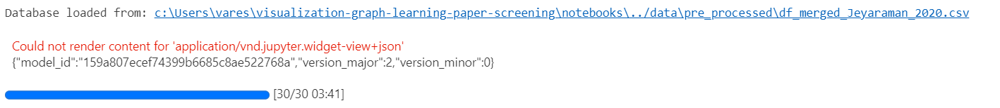

Evaluation results: {'eval_loss': 0.1114756315946579, 'eval_model_preparation_time': 0.0024, 'eval_overall_accuracy': 0.9702127659574468, 'eval_accuracy_class_0': 0.9814814814814815, 'eval_accuracy_class_1': 0.8421052631578947, 'eval_precision_0': 0.986046511627907, 'eval_recall_0': 0.9814814814814815, 'eval_f1_0': 0.9837587006960556, 'eval_precision_1': 0.8, 'eval_recall_1': 0.8421052631578947, 'eval_f1_1': 0.8205128205128205, 'eval_runtime': 228.2472, 'eval_samples_per_second': 1.03, 'eval_steps_per_second': 0.131}

Too Time Consuming and Resources Needed for adopting the model! Not efficient for the Human in The Loop App.

## 2.2. (B) TF-IDF & Cosine Similarity (Keyword Relation) [P<->P]

In [ ]:
###############################################################################
# 1. Imports & Setup
###############################################################################
import os
import pandas as pd
import torch
from torch_geometric.data import HeteroData
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

###############################################################################
# 2. Load Processed CSV
###############################################################################
# Customize your paths as needed.
processed_folder_path = os.path.join(os.getcwd(), "..", "data", "pre_processed")
csv_path = os.path.join(processed_folder_path, "temp.csv")

df = pd.read_csv(csv_path)
print("Database loaded from:", csv_path)
print("Number of papers:", len(df))

###############################################################################
# 3. Identify Relevant Paper Attributes
#   - We'll choose from your columns which attributes to keep as node features.
#   - For example: 'id', 'title_clean', 'abstract_clean', 'label_included'
#     along with the vector representation from TF-IDF.
###############################################################################

# Primary text for TF-IDF: abstract + title (cleaned) as there were 2 missing Nan Value were located in title and abstract of this dataset
df['abstract_clean'] = df['abstract_clean'].fillna('')
df['title_clean'] = df['title_clean'].fillna('')
df['text'] = df['abstract_clean'] + " " + df['title_clean']

# Optional: We'll keep 'label_included' as a label or target
# We'll also keep 'id' for reference (OpenAlex or custom)

###############################################################################
# 4. TF-IDF Feature Extraction
#   - Using ngram_range=(1,2), sublinear_tf, etc., as you like.
###############################################################################
vectorizer = TfidfVectorizer(
    stop_words='english',  # remove common English function words
    max_df=0.9,
    min_df=1,
    ngram_range=(1, 3),
    sublinear_tf=True
)

X_tfidf = vectorizer.fit_transform(df['text'])
num_papers = X_tfidf.shape[0]
print("TF-IDF matrix shape:", X_tfidf.shape)

# Convert to PyTorch float tensor
paper_features = torch.tensor(X_tfidf.toarray(), dtype=torch.float)

###############################################################################
# 5. Similarity Computation & Edge Building
#   - We'll use a cosine similarity to connect paper nodes that pass a threshold.
#   - This forms an undirected graph on the 'paper' node type.
###############################################################################
similarity_matrix = cosine_similarity(X_tfidf, X_tfidf)

# Choose threshold:
threshold = 0.2  # You can tune this threshold to control graph density

# Coordinates where similarity > threshold
row_idx, col_idx = np.where(similarity_matrix > threshold)

# Filter out duplicates (i < j) to avoid double edges in undirected graph
mask = row_idx < col_idx
row_idx = row_idx[mask]
col_idx = col_idx[mask]

# Convert to PyTorch Tensors (edge_index shape=[2, num_edges])
edge_index = torch.tensor([row_idx, col_idx], dtype=torch.long)

# Edge weights as well (optional)
edge_weights = torch.tensor(similarity_matrix[row_idx, col_idx], dtype=torch.float)

###############################################################################
# 6. Construct PyG HeteroData for Paper Layer
###############################################################################
data = HeteroData()

# Paper node features (X)
data['paper'].x = paper_features

# Paper IDs (useful for reference/debugging)
data['paper'].paper_id = df['id'].tolist()

# Paper labels (if any, e.g. included/excluded)
# Make sure you convert to a torch tensor of the correct dtype
if 'label_included' in df.columns:
    data['paper'].y = torch.tensor(df['label_included'].fillna(0).values, dtype=torch.long)

# Add edges under a relation type, e.g. "similar"
data['paper','similar','paper'].edge_index = edge_index
data['paper','similar','paper'].edge_weight = edge_weights  # optional

###############################################################################
# 7. (Optional) Make Edges Undirected
#   - If you want each edge to appear in both directions, you can do so:
###############################################################################
# from torch_geometric.utils import to_undirected
# data['paper','similar','paper'].edge_index = to_undirected(edge_index)
# # If you keep edge_weights, you'll need to handle duplication or mean them.

###############################################################################
# 8. Inspect the Result
###############################################################################
print(data)
print("Num Paper Nodes:", data['paper'].num_nodes)
print("Num Paper-Paper Edges:", data['paper','similar','paper'].edge_index.shape[1])
print("Paper Node Features Shape:", data['paper'].x.shape)

###############################################################################
# 9. Visualize the Graph (Optional)
###############################################################################
import networkx as nx
from torch_geometric.utils import to_networkx
import matplotlib.pyplot as plt

# Convert to homogeneous graph for Nx (only if single node type)
G_nx = to_networkx(data.to_homogeneous(), to_undirected=True, node_attrs=['x'], edge_attrs=['edge_weight'])

plt.figure(figsize=(16,16))
nx.draw(G_nx, with_labels=False, node_size=11)
plt.title("Paper Similarity Graph (PyG -> NetworkX)")
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Flatten similarity matrix (excluding diagonal)
sims = similarity_matrix[np.triu_indices_from(similarity_matrix, k=1)]
plt.hist(sims, bins=50)
plt.title("Cosine Similarity Distribution")
plt.xlabel("Similarity")
plt.ylabel("Frequency")
plt.show()

# Reuse your original vectorizer
# (Assuming you called it "vectorizer" and used df['text'].)
X_full = vectorizer.transform(df['text'])
feature_names = vectorizer.get_feature_names_out()

# Now filter rows (papers) to get only positives
pos_indices = df.index[df['label_included'] == 1].tolist()
X_pos = X_full[pos_indices, :]

import numpy as np

# Sum TF-IDF scores across all positive docs
# shape: (1, vocab_size)
sums = X_pos.sum(axis=0)  # returns a sparse matrix or numpy array

# Convert to a flat array
sums_array = np.asarray(sums).flatten()

# Sort indices by descending weight
sorted_indices = np.argsort(-sums_array)

# How many top terms to view?
top_n = 50
for i in range(top_n):
    term_index = sorted_indices[i]
    term = feature_names[term_index]
    score = sums_array[term_index]
    print(f"{i+1:02d}. {term}: {score:.4f}")


So TFID is not good we need to shift on Bert or BM25 

But bert fine tuning for human in the loop is not efficient at all! too time consuming!

Concept edge was better in capturing meaning

## 2.3. (C) Paper To concept Graph Relation [P<->C]

concept model code: https://github.com/ourresearch/openalex-concept-tagging/tree/main/V3

Concepts
Concepts are abstract ideas that works are about. OpenAlex indexes about 65k concepts. The
CEID for OpenAlex concepts is the Wikidata ID, and all concepts have one, because all
OpenAlex concepts are also Wikidata concepts. Concepts are hierarchical; there are 19
root-level concepts, and 5 layers of descendents branch out from them. The concept tree,
which is a modified version of the one used in MAG, contains about 65 thousand concepts in
total. Works are assigned concepts based on their titles and abstracts, using an automated
classifier that was trained on MAG’s corpus. The code and models behind this classifier are
open-source. Around 85% of works have at least one concept assigned. https://arxiv.org/pdf/2205.01833

In [1]:
import os
import pandas as pd
import networkx as nx
import community.community_louvain as community  # Install via: pip install python-louvain
import numpy as np
import networkx as nx
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# ----------------------------
# 0. Load the Dataset
# ----------------------------
processed_folder_path = os.path.join(os.getcwd(),"..", "data", "pre_processed")
csv_path = os.path.join(processed_folder_path, "temp.csv")
df = pd.read_csv(csv_path)
print("Database loaded from:", csv_path)
print(df.head())

# ----------------------------------------------------
# 1. Build the NetworkX Graph with Publication and concept Nodes
# ----------------------------------------------------
G = nx.Graph()

publication_nodes = set()
concept_nodes = set()

for idx, row in df.iterrows():
    # --- Add Publication Node ---
    pub_id = row["id"]
    G.add_node(
        pub_id,
        type="publication",
        label_included=row.get("label_included"),
        title=row.get("title_clean"),
        abstract=row.get("abstract_clean"),
        year=row.get("publication_year")
    )
    publication_nodes.add(pub_id)
    
    # --- Parse Concepts Safely ---
    raw_concepts = row.get("concepts", "[]")
    if isinstance(raw_concepts, str):
        try:
            concepts = eval(raw_concepts)  # caution if data is untrusted
        except Exception as e:
            print(f"Error evaluating concepts for publication {pub_id}: {e}")
            concepts = []
    elif isinstance(raw_concepts, list):
        concepts = raw_concepts
    else:
        concepts = []
    
    # --- Add concept Nodes and Edges ---
    for concept in concepts:
        concept_id = concept["id"].split('/')[-1]  # e.g. "C71924100"
        concept_name = concept.get("display_name", "unknown")
        concept_level = concept.get("level", None)
        concept_score = concept.get("score", 1.0)
        
        if concept_id not in concept_nodes:
            G.add_node(
                concept_id,
                type="concept",
                name=concept_name,
                level=concept_level,
                score=concept_score
            )
            concept_nodes.add(concept_id)
        
        # Edge from publication -> concept with weight
        G.add_edge(pub_id, concept_id, weight=float(concept_score)*float(concept_level), relationship="has_concept")

print(f"Graph built with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")
print(f"Publication nodes: {len(publication_nodes)}, concept nodes: {len(concept_nodes)}")

Database loaded from: c:\Users\parsa\Desktop\New folder\Book\..\data\pre_processed\temp.csv
                                 id  \
0  https://openalex.org/W3007172259   
1  https://openalex.org/W2088256967   
2  https://openalex.org/W1830000322   
3  https://openalex.org/W2504228461   
4  https://openalex.org/W2057344590   

                                            doi  \
0     https://doi.org/10.1186/s12913-016-1423-5   
1  https://doi.org/10.1016/j.arthro.2013.09.074   
2     https://doi.org/10.1007/s10529-015-1975-1   
3             https://doi.org/10.1002/stem.2475   
4    https://doi.org/10.1016/j.msec.2005.07.024   

                                               title  \
0  Proceedings of the 3rd IPLeiria’s Internationa...   
1  Injectable Cultured Bone Marrow–Derived Mesenc...   
2  Three-dimensional bioprinting in tissue engine...   
3  Allogeneic Mesenchymal Stem Cells Stimulate Ca...   
4  Preparation of a biphasic scaffold for osteoch...   

                             

In [2]:
# ----------------------------
# 3. Graph Summary and Saving
# ----------------------------
print(f"Total nodes: {G.number_of_nodes()}")
print(f"Total edges: {G.number_of_edges()}")
print(f"Publication nodes: {len(publication_nodes)}")
print(f"concept nodes: {len(concept_nodes)}")

# Save the graph as a GEXF file for later visualization (e.g., in Gephi)
os.makedirs(processed_folder_path, exist_ok=True)
nx.write_gexf(G, os.path.join(processed_folder_path, "Concept_Paper_Graph.gexf"))

# Convert the graph’s edge list to a DataFrame
df = nx.to_pandas_edgelist(G)
# Save as CSV (comma-separated)
df.to_csv("graph_edges.csv", index=False)

print("Graph saved as GEXF file.")
# ----------------------------
# 4. Graph Metrics and Evaluation
# ----------------------------
# Compute degree centrality for all nodes
degree_centrality = nx.degree_centrality(G)
avg_degree = sum(degree_centrality.values()) / len(degree_centrality)
print(f"Average Degree Centrality: {avg_degree:.4f}")

# Top concepts by Degree Centrality (only among concept nodes)
concept_centrality = {n: centrality for n, centrality in degree_centrality.items() if G.nodes[n]['type'] == 'concept'}
top_concepts = sorted(concept_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top concepts by Degree Centrality:", top_concepts)

# Top Publications by number of concept connections (degree for publication nodes)
publication_degrees = [(n, d) for n, d in G.degree() if G.nodes[n]['type'] == 'publication']
top_papers = sorted(publication_degrees, key=lambda x: x[1], reverse=True)[:10]
print("Top Papers by concept Connections:", top_papers)

# Community Detection using Louvain method
partition = community.best_partition(G)
num_communities = len(set(partition.values()))
print(f"Detected {num_communities} research communities")

# ----------------------------
# 5. Evaluation Based on label_included
# ----------------------------
# Identify potential weakly classified publications (low-degree publications)
low_degree_publication_nodes = [n for n, d in G.degree() if d < 2 and G.nodes[n]['type'] == 'publication']
print(f"Potential weakly classified publications: {len(low_degree_publication_nodes)}")

# Identify potential weakly classified concepts (low-degree concepts)
low_degree_concept_nodes = [n for n, d in G.degree() if d < 2 and G.nodes[n]['type'] == 'concept']
print(f"Potential weakly classified concepts: {len(low_degree_concept_nodes)}")

# Select "relevant" publications (those with label_included == 1)
relevant_papers = [n for n, d in G.nodes(data=True) if d["type"] == "publication" and d.get("label_included") == 1]
print(f"Total relevant papers: {len(relevant_papers)}")

# Calculate concept distribution among relevant papers
concept_counts = {}
for pub in relevant_papers:
    for neighbor in G.neighbors(pub):
        if G.nodes[neighbor]["type"] == "concept":
            concept_counts[neighbor] = concept_counts.get(neighbor, 0) + 1

sorted_concepts = sorted(concept_counts.items(), key=lambda x: x[1], reverse=True)
print("Top Concepts in Relevant Papers:", sorted_concepts[:10])


Total nodes: 1979
Total edges: 17550
Publication nodes: 1175
concept nodes: 804
Graph saved as GEXF file.
Average Degree Centrality: 0.0090
Top concepts by Degree Centrality: [('C71924100', 0.5879676440849343), ('C105702510', 0.4903943377148635), ('C2780550940', 0.4782608695652174), ('C142724271', 0.4737108190091001), ('C141071460', 0.448938321536906), ('C204787440', 0.4191102123356926), ('C2776164576', 0.41708796764408496), ('C3020332539', 0.34277047522750254), ('C86803240', 0.18149646107178968), ('C136229726', 0.18048533872598585)]
Top Papers by concept Connections: [('https://openalex.org/W2770487048', 29), ('https://openalex.org/W2008788274', 29), ('https://openalex.org/W2884782383', 29), ('https://openalex.org/W2598734993', 28), ('https://openalex.org/W2900692716', 28), ('https://openalex.org/W1737159960', 27), ('https://openalex.org/W3046448393', 27), ('https://openalex.org/W2777582550', 27), ('https://openalex.org/W1965436937', 27), ('https://openalex.org/W2960696202', 27)]
Dete

Relevant Publications (label_included==1):
  Count: 96
  Average concept Connections: 13.70 (Std: 2.92)
Non-Relevant Publications (label_included!=1):
  Count: 1079
  Average concept Connections: 15.05 (Std: 4.68)


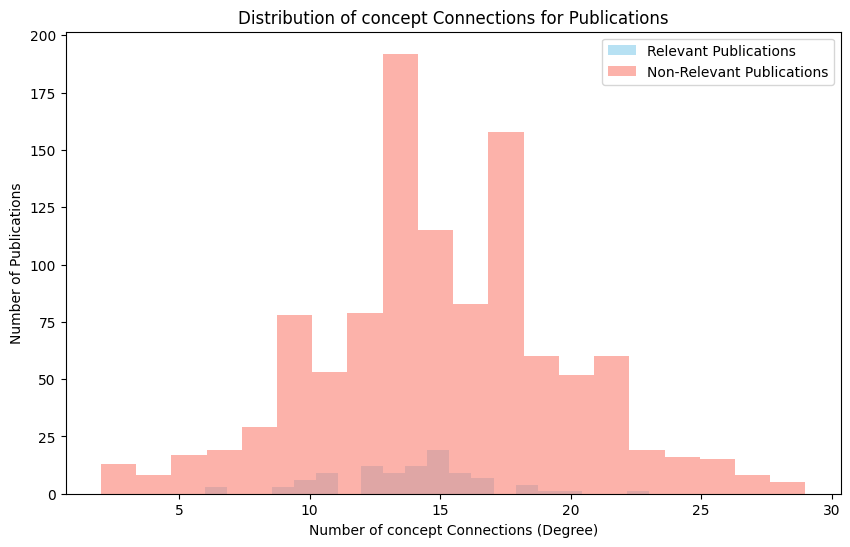

T-test comparing concept connections:
  t-statistic = -4.0689, p-value = 7.7931e-05


In [3]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import ttest_ind

# ----------------------------
# Step 2: Refine Evaluation of label_included Accuracy
# ----------------------------
# We compare the "concept connection degree" (i.e. the number of concept edges per publication)
# for relevant (label_included == 1) and non-relevant publications.

# Collect degrees (i.e. number of concept connections) for each publication node.
relevant_degrees = []
non_relevant_degrees = []

for n, attr in G.nodes(data=True):
    if attr.get("type") == "publication":
        degree = G.degree(n)
        if attr.get("label_included") == 1:
            relevant_degrees.append(degree)
        else:
            non_relevant_degrees.append(degree)

# Print summary statistics
print("Relevant Publications (label_included==1):")
print(f"  Count: {len(relevant_degrees)}")
print(f"  Average concept Connections: {np.mean(relevant_degrees):.2f} (Std: {np.std(relevant_degrees):.2f})")

print("Non-Relevant Publications (label_included!=1):")
print(f"  Count: {len(non_relevant_degrees)}")
print(f"  Average concept Connections: {np.mean(non_relevant_degrees):.2f} (Std: {np.std(non_relevant_degrees):.2f})")

# Plot histograms for a visual comparison
plt.figure(figsize=(10, 6))
plt.hist(relevant_degrees, bins=20, alpha=0.6, label='Relevant Publications', color='skyblue')
plt.hist(non_relevant_degrees, bins=20, alpha=0.6, label='Non-Relevant Publications', color='salmon')
plt.xlabel("Number of concept Connections (Degree)")
plt.ylabel("Number of Publications")
plt.title("Distribution of concept Connections for Publications")
plt.legend()
plt.show()

# Conduct a t-test to compare the means of the two groups
t_stat, p_val = ttest_ind(relevant_degrees, non_relevant_degrees, equal_var=False)
print("T-test comparing concept connections:")
print(f"  t-statistic = {t_stat:.4f}, p-value = {p_val:.4e}")

# Interpretation:
# A significant p-value (typically p < 0.01) would indicate that the difference in the average
# concept connections between relevant and non-relevant papers is statistically significant.


**Summary Statistics**

| Group               | $n$   | Mean $\bar{x}$ | Std. Dev. $s$ |
|---------------------|--------:|--------------------:|------------------:|
| **Relevant**        |     96  | 13.70              | 2.92              |
| **Non-Relevant**    |   1079  | 15.05              | 4.68              |

--- 

**T-Test (Unequal Variances)**

1. **Difference in Means**:  
   $ \Delta = \bar{x}_1 - \bar{x}_2 = 13.70 - 15.05 = -1.35 $  
   $\quad\Rightarrow\quad$

2. **Calculate Standard Error (SE)**:  
   $ SE = \sqrt{\frac{s_1^2}{n_1} + \frac{s_2^2}{n_2}} $, where  
   $ s_1^2 = 2.92^2 \approx 8.53 $ and $ s_2^2 = 4.68^2 \approx 21.90 $.  
   Then,  
   $ \frac{8.53}{96} \approx 0.0889 $, $ \frac{21.90}{1079} \approx 0.0203 $, so  
   $ SE = \sqrt{0.0889 + 0.0203} = \sqrt{0.1092} \approx 0.3305 $  
   $\quad\Rightarrow\quad$

3. **Compute the t-Statistic**:  
   $ t = \frac{\Delta}{SE} = \frac{-1.35}{0.3305} \textcolor{green}{\approx -4.08} $  
   $\quad\Rightarrow\quad$

4. **Degrees of Freedom (Welch-Satterthwaite Approximation)**:  
   $ df \approx \frac{\left(\frac{s_1^2}{n_1} + \frac{s_2^2}{n_2}\right)^2}{\frac{(\frac{s_1^2}{n_1})^2}{n_1-1} + \frac{(\frac{s_2^2}{n_2})^2}{n_2-1}} $.  
   Plugging in the numbers:  
   $ df \approx \frac{(0.0889 + 0.0203)^2}{\frac{0.0889^2}{95} + \frac{0.0203^2}{1078}} \approx 142.5 $  
   $\quad\Rightarrow\quad$

5. **Calculate the p-value**:  
   Using a t-distribution with $ df \approx 142.5 $, the one-tailed probability for $ t \approx -4.08 $ is extremely small. For a two-tailed test,  
   $ p \approx 2 \times P(t \leq -4.08) \textcolor{green}{\approx 0.000078} $  
   $\quad\Rightarrow\quad$

6. **Decision at $ \alpha = 0.01 $**:   
   Since $ 0.000078 < 0.01 $, the difference between the means is statistically significant.

Where:
- $(\bar{x}_1, \bar{x}_2$) are sample means,
- $(s_1^2, s_2^2$) are sample variances,
- $(n_1, n_2$) are sample sizes.

---

**Significance $(\alpha$)**

Let $(\alpha = 0.01$).

- **Null Hypothesis $((H_0)$)**: $(\bar{x}_1 = \bar{x}_2$) (no difference in means).
- **Alternative Hypothesis $((H_1)$)**: $(\bar{x}_1 \neq \bar{x}_2$).

Since $(p \ll 0.01$), **reject $(H_0$)** and conclude that **relevant publications have a significantly lower mean degree** ($(13.70$)) than non-relevant ones ($(15.05$)); Practically, this suggests that the number of concept connections could serve as a meaningful indicator or feature for distinguishing relevant vs. non-relevant publications within the graph-based analysis.

---

In [ ]:
# ----------------------------------------------------
# 2. Build an NxN adjacency/weight matrix (W) from G
#    We'll interpret W as "feature vectors" for scikit-learn
# ----------------------------------------------------
all_nodes = sorted(G.nodes())
node_idx_map = {n: i for i, n in enumerate(all_nodes)}
N = len(all_nodes)
print("Total nodes:", N)

# Initialize NxN matrix 
W = np.zeros((N, N), dtype=float)

for u, v, data in G.edges(data=True):
    i = node_idx_map[u]
    j = node_idx_map[v]
    w = data.get("weight", 1.0)
    # Undirected
    W[i, j] = w
    W[j, i] = w


print("Adjacency/Weight matrix shape:", W.shape)
display(W)
# ----------------------------------------------------
# 3. Build the label vector: 
#    Publications get label_included (0 or 1), concepts get -1
# ----------------------------------------------------
labels = np.full(N, -1, dtype=int)  # -1 = unlabeled

for n, attr in G.nodes(data=True):
    if attr["type"] == "publication":
        idx = node_idx_map[n]
        # If missing, default to 0
        lab = attr.get("label_included", 0)
        labels[idx] = int(lab)

num_labeled = np.sum(labels != -1)
num_unlabeled = np.sum(labels == -1)
print(f"Labeled nodes: {num_labeled}, Unlabeled nodes: {num_unlabeled}")

# ----------------------------------------------------
# 4. LabelSpreading with 'knn' kernel
# ----------------------------------------------------
label_spread = LabelSpreading(
    kernel='knn',
    n_neighbors=30,   # tweak as needed
    alpha=0.5,        # how strongly old labels are kept
    max_iter=300
)

label_spread.fit(W, labels)

transduced_labels = label_spread.transduction_

# ----------------------------------------------------
# 5. Evaluate on publication nodes that were originally labeled
# ----------------------------------------------------
true_labels = []
pred_labels = []

for n, attr in G.nodes(data=True):
    if attr["type"] == "publication":
        idx = node_idx_map[n]
        # Evaluate only if we had an original label (0 or 1)
        if labels[idx] in [0, 1]:
            true_labels.append(labels[idx])
            pred_labels.append(transduced_labels[idx])

cm = confusion_matrix(true_labels, pred_labels)
print("\nConfusion Matrix (LabelSpreading on labeled publications):")
print(cm)

print("\nClassification Report (labeled publications):")
print(classification_report(true_labels, pred_labels, digits=4))

# ----------------------------------------------------
# 6. (Optional) Check how many concepts ended up labeled '1'
# ----------------------------------------------------
concept_ones = 0
concept_count = 0
for n, attr in G.nodes(data=True):
    if attr["type"] == "concept":
        idx = node_idx_map[n]
        concept_count += 1
        if transduced_labels[idx] == 1:
            concept_ones += 1

print(f"Out of {concept_count} concepts, {concept_ones} were predicted as 'relevant (1)'.")


Total nodes: 1979
Adjacency/Weight matrix shape: (1979, 1979)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(1979, 1979))

Labeled nodes: 1175, Unlabeled nodes: 804

Confusion Matrix (LabelSpreading on labeled publications):
[[1079    0]
 [  13   83]]

Classification Report (labeled publications):
              precision    recall  f1-score   support

           0     0.9881    1.0000    0.9940      1079
           1     1.0000    0.8646    0.9274        96

    accuracy                         0.9889      1175
   macro avg     0.9940    0.9323    0.9607      1175
weighted avg     0.9891    0.9889    0.9886      1175

Out of 804 concepts, 0 were predicted as 'relevant (1)'.


Detected 91 communities


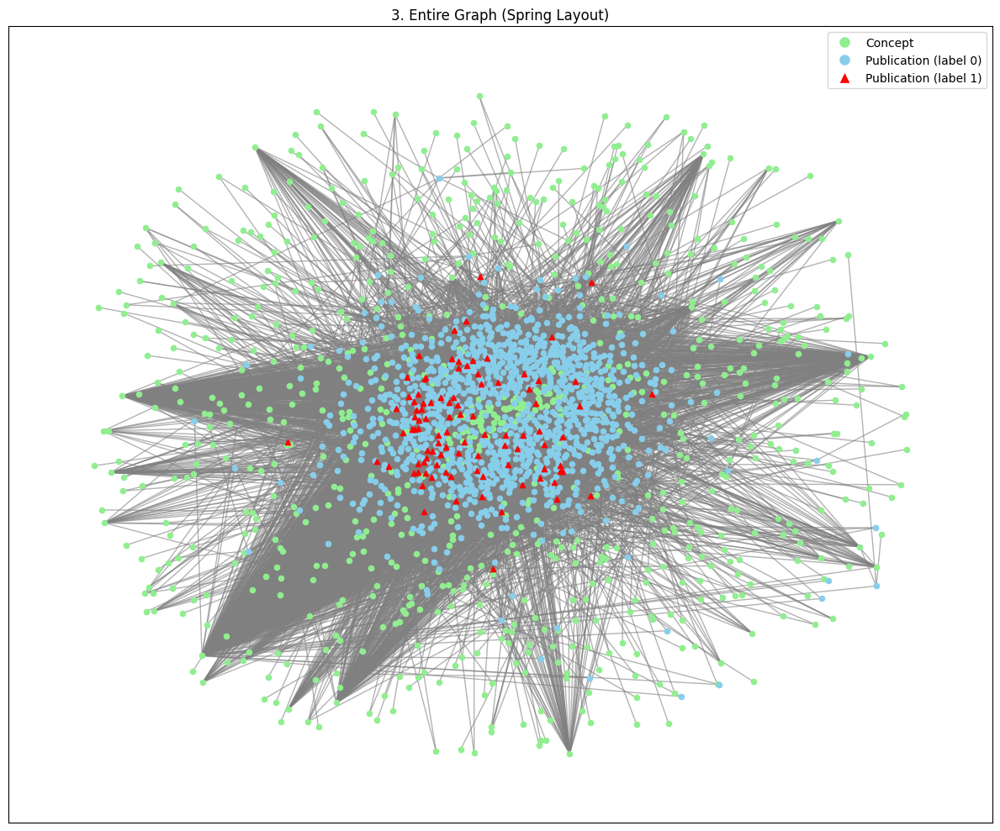

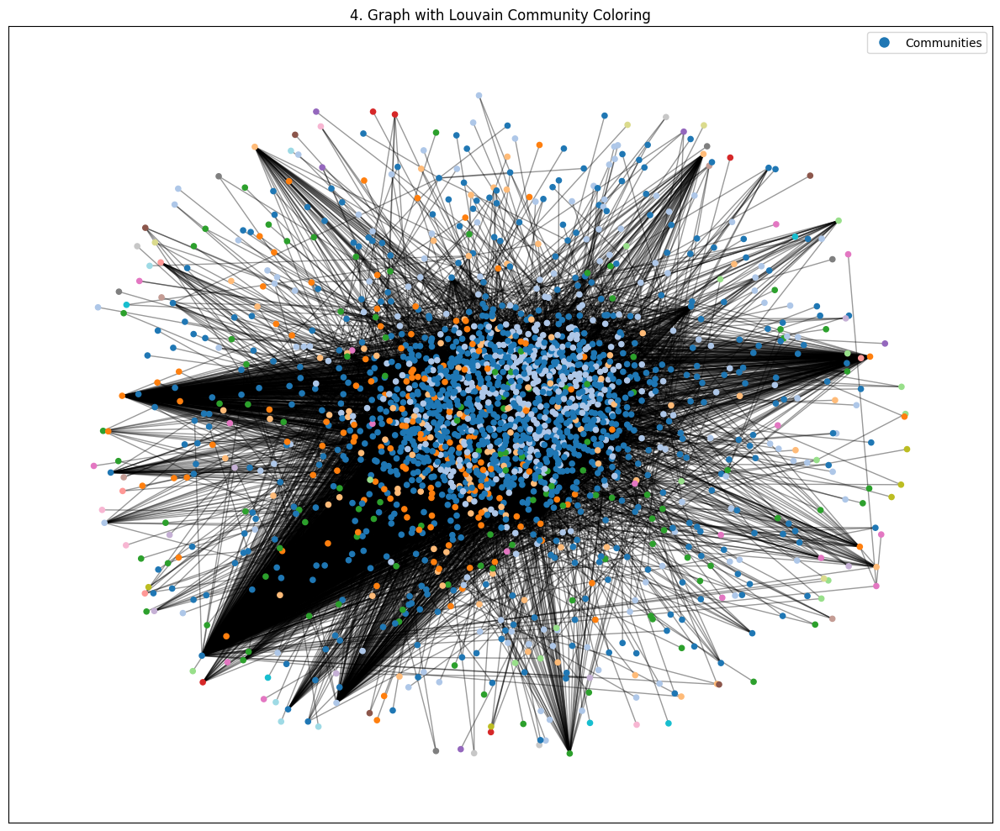

In [8]:
# Compute basic metrics for
degree_centrality = nx.degree_centrality(G)
# Compute Louvain partition for community detection
partition = community.best_partition(G)
num_communities = len(set(partition.values()))
print(f"Detected {num_communities} communities")

# Visualization: Spring Layout Visualization of Entire Graph
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, k=0.15, seed=42)

# Separate nodes by type
pub_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "publication"]
concept_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "concept"]

# Separate publication nodes by label
pub_nodes_0 = [n for n in pub_nodes if G.nodes[n].get("label_included", 0) == 0]
pub_nodes_1 = [n for n in pub_nodes if G.nodes[n].get("label_included", 0) == 1]

# Draw concept nodes in green
nx.draw_networkx_nodes(G, pos, nodelist=concept_nodes, node_color="lightgreen", node_size=20, label="Concept")

# Draw publication nodes with label 0 (irrelevant) in blue circles
nx.draw_networkx_nodes(G, pos, nodelist=pub_nodes_0, node_color="skyblue", node_size=20, label="Publication (label 0)")

# Draw publication nodes with label 1 (relevant) in red triangles
nx.draw_networkx_nodes(G, pos, nodelist=pub_nodes_1, node_color="red", node_size=20, node_shape="^", label="Publication (label 1)")

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color="gray", alpha=0.6)

plt.title("Entire Graph (Spring Layout)")
# Add legend
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', label='Concept', markersize=10, markerfacecolor='lightgreen'),
    plt.Line2D([0], [0], marker='o', color='w', label='Publication (label 0)', markersize=10, markerfacecolor='skyblue'),
    plt.Line2D([0], [0], marker='^', color='w', label='Publication (label 1)', markersize=10, markerfacecolor='red')
], loc='upper right')
plt.tight_layout()

# Visualization: Community Detection Visualization (Colored by Louvain Partition)
plt.figure(figsize=(12, 10))
# Use the same spring layout from before
community_colors = [partition.get(n) for n in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=community_colors, cmap=plt.cm.tab20, node_size=20)
nx.draw_networkx_edges(G, pos, alpha=0.4)
plt.title("Graph with Louvain Community Coloring")
# Add legend for communities
plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', label='Communities', markersize=10, markerfacecolor='tab:blue')
], loc='upper right')
plt.tight_layout()


In [16]:
# Filter concept nodes with level equal to 5
level_5_concepts = [n for n in concept_nodes if G.nodes[n].get('level') == 5]

# Display the filtered concept nodes
print("concept nodes with level equal to 5:")
for concept in level_5_concepts:
    print(f"Node ID: {concept}, Name: {G.nodes[concept]['name']}, Level: {G.nodes[concept]['level']}")
    


concept nodes with level equal to 5:
Node ID: C2777870964, Name: Autologous chondrocyte implantation, Level: 5
Node ID: C3018143345, Name: Knee cartilage, Level: 5
Node ID: C2779869580, Name: Demineralized bone matrix, Level: 5
Node ID: C143441281, Name: Clinical uses of mesenchymal stem cells, Level: 5
Node ID: C13685319, Name: Stem cell transplantation for articular cartilage repair, Level: 5
Node ID: C2909830753, Name: Viscosupplementation, Level: 5
Node ID: C2778265714, Name: KLF4, Level: 5
Node ID: C3018615303, Name: Subchondral bone, Level: 5
Node ID: C2781032047, Name: Articular cartilage damage, Level: 5
Node ID: C2776157581, Name: Aggrecanase, Level: 5
Node ID: C2780024818, Name: Hyaline cartilage, Level: 5
Node ID: C2781218938, Name: Fibrocartilage, Level: 5
Node ID: C2775961978, Name: Methacrylamide, Level: 5
Node ID: C2909674901, Name: Cartilage damage, Level: 5
Node ID: C2779760629, Name: Resistin, Level: 5
Node ID: C2779985480, Name: Chondropathy, Level: 5
Node ID: C19753

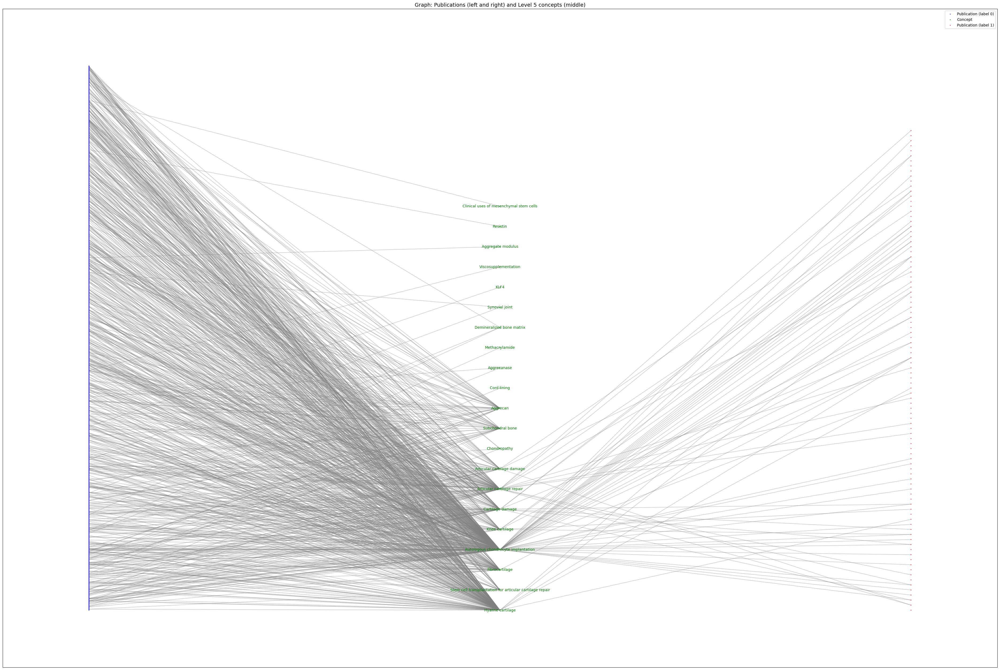

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Separate nodes by type
pub_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "publication"]
concept_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "concept" and d["level"] == 5] #xxx Change for the lvl

# Separate publication nodes by label
pub_nodes_0 = [n for n in pub_nodes if G.nodes[n].get("label_included", 0) == 0]
pub_nodes_1 = [n for n in pub_nodes if G.nodes[n].get("label_included", 0) == 1]

# Color publication nodes based on their label_included:
# red for relevant (1), blue for irrelevant (0)
pub_colors_0 = ["blue"] * len(pub_nodes_0)
pub_colors_1 = ["red"] * len(pub_nodes_1)

# Color concept nodes in green
concept_colors = ["green"] * len(concept_nodes)

# Create a custom layout
pos = {}
# Position publication nodes with label 0 on the left (default spacing)
for i, node in enumerate(pub_nodes_0):
    pos[node] = (-1, i)

# Increase vertical spacing for the middle layer (concept nodes)
spacing_factor_middle = 40  # Adjust this factor for more or less space
for i, node in enumerate(concept_nodes):
    pos[node] = (0, i * spacing_factor_middle)

# Increase vertical spacing for the right layer (publication nodes with label 1)
spacing_factor_right = 10  # Adjust this factor for more or less space
for i, node in enumerate(pub_nodes_1):
    pos[node] = (1, i * spacing_factor_right)

# Filter edges that connect publications to level 5 concepts
filtered_edges = [
    (u, v) 
    for u, v in G.edges() 
    if (u in pub_nodes and v in concept_nodes) or (v in pub_nodes and u in concept_nodes)
]

# Plotting the custom graph with only the filtered edges
plt.figure(figsize=(48, 32))

# Draw publication nodes with label 0 (left layer)
nx.draw_networkx_nodes(G, pos, nodelist=pub_nodes_0, node_color=pub_colors_0, 
                       node_size=1, label="Publication (label 0)")

# Draw concept nodes (middle layer)
nx.draw_networkx_nodes(G, pos, nodelist=concept_nodes, node_color=concept_colors, 
                       node_size=1, label="Concept")

# Draw publication nodes with label 1 (right layer)
nx.draw_networkx_nodes(G, pos, nodelist=pub_nodes_1, node_color=pub_colors_1, 
                       node_size=1, label="Publication (label 1)")

# Draw only the edges connecting publications and level 5 concepts
nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, alpha=0.5, edge_color="gray")

# Draw labels for concept nodes only
concept_labels = {n: G.nodes[n]['name'] for n in concept_nodes}
nx.draw_networkx_labels(G, pos, labels=concept_labels, font_size=10, font_color="green")
plt.title(f"Graph: Publications (left and right) and Level {G.nodes[concept_nodes[0]]['level']} concepts (middle)", fontsize=14)

plt.axis("on")
plt.legend(scatterpoints=1)
plt.show()




https://cosmograph.app/run/
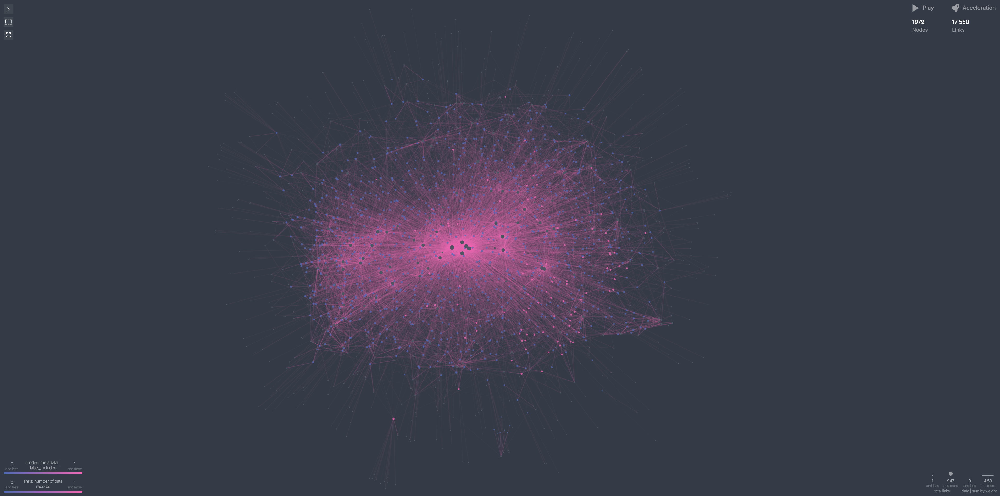

## Active Search algo

In [34]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report
from typing import List, Tuple, Literal

KernelType = Literal['rbf', 'knn']
QueryStrategy = Literal['topk', 'thompson']

def build_adjacency_matrix(G) -> Tuple[np.ndarray, dict]:
    all_nodes = sorted(G.nodes())
    node_idx_map = {n: i for i, n in enumerate(all_nodes)}
    N = len(all_nodes)
    W = np.zeros((N, N), dtype=float)
    for u, v, data in G.edges(data=True):
        i = node_idx_map[u]
        j = node_idx_map[v]
        w = data.get("weight", 1.0)
        W[i, j] = w
        W[j, i] = w
    return W, node_idx_map

def build_label_vectors(G, node_idx_map: dict) -> Tuple[np.ndarray, np.ndarray, List[int]]:
    N = len(node_idx_map)
    labels = np.full(N, -1, dtype=int)
    for n, attr in G.nodes(data=True):
        if attr["type"] == "publication":
            idx = node_idx_map[n]
            labels[idx] = int(attr.get("label_included", 0))
    labels_original = labels.copy()
    publication_indices = [node_idx_map[n] for n, d in G.nodes(data=True)
                           if d['type'] == 'publication' and labels_original[node_idx_map[n]] in [0, 1]]
    return labels, labels_original, publication_indices

def initialize_seed(labels_original, publication_indices: List[int], seed_positives, seed_negatives, seed=6) -> np.ndarray:
    np.random.seed(seed)
    labels_active = np.full_like(labels_original, fill_value=-1)
    ones = [i for i in publication_indices if labels_original[i] == 1]
    zeros = [i for i in publication_indices if labels_original[i] == 0]
    np.random.shuffle(ones)
    np.random.shuffle(zeros)
    seed_indices = ones[:seed_positives] + zeros[:seed_negatives]
    for idx in seed_indices:
        labels_active[idx] = labels_original[idx]
    return labels_active

def active_learning_loop(
    G,
    kernel: KernelType,
    query_strategy: QueryStrategy,
    gamma: float = 0.1,
    alpha_val: float = 0.2,
    max_iter: int = 300,
    n_iterations: int = 100,
    query_batch_size: int = 1,
    seed: int = 6
):
    np.random.seed(seed)
    W, node_idx_map = build_adjacency_matrix(G)
    labels, labels_original, publication_indices = build_label_vectors(G, node_idx_map)
    labels = initialize_seed(labels_original, publication_indices, seed_positives=1, seed_negatives=1, seed=seed)
    
    model = LabelSpreading(kernel=kernel, gamma=gamma, alpha=alpha_val, max_iter=max_iter)
    total_positives = sum(labels_original[i] == 1 for i in publication_indices)
    idx_node_map = {v: k for k, v in node_idx_map.items()}

    alpha_exploit, beta_exploit = 1.0, 1.0
    alpha_explore, beta_explore = 1.0, 1.0

    for iteration in range(1, n_iterations + 1):
        model.fit(W, labels)
        label_distributions = model.label_distributions_
        
        unlabeled = [i for i in publication_indices if labels[i] == -1]
        if not unlabeled:
            break

        selected = []
        for _ in range(query_batch_size):
            if not unlabeled:
                break

            if query_strategy == 'thompson':
                sample_exploit = np.random.beta(alpha_exploit, beta_exploit)
                sample_explore = np.random.beta(alpha_explore, beta_explore)

                if sample_exploit >= sample_explore:
                    sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                    chosen = sorted_idx[0]
                    arm = 'exploit'
                else:
                    sorted_idx = sorted(unlabeled, key=lambda i: abs(label_distributions[i,1] - label_distributions[i,0]))
                    chosen = sorted_idx[0]
                    arm = 'explore'
            else:
                sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                chosen = sorted_idx[0]
                arm = 'topk'

            unlabeled.remove(chosen)
            true_label = labels_original[chosen]
            reward = 1 if true_label == 1 else 0

            if arm == 'exploit':
                alpha_exploit += reward
                beta_exploit += 1 - reward
            elif arm == 'explore':
                alpha_explore += reward
                beta_explore += 1 - reward

            labels[chosen] = true_label
            selected.append((chosen, label_distributions[chosen, 1], true_label, arm))

        print(f"\n=== Iteration {iteration} ===")
        for rank, (idx, prob, label, arm) in enumerate(selected, start=1):
            print(f"  Rank {rank}: Node {idx_node_map[idx]} via {arm} => p= {prob:.4f}, Label = {label}")

        discovered = sum(labels[i] == 1 for i in publication_indices)
        percent = 100.0 * discovered / total_positives
        print(f"Discovered {discovered}/{total_positives} positives => {percent:.2f}%")

        y_true = [labels_original[i] for i in publication_indices]
        y_pred = [model.transduction_[i] for i in publication_indices]

        cm = confusion_matrix(y_true, y_pred, labels=[0,1])
        print("Confusion Matrix [0,1]:")
        print(cm)
        print("Classification Report:")
        print(classification_report(y_true, y_pred, labels=[0,1], digits=4))


In [38]:
active_learning_loop(G, kernel='rbf', query_strategy='topk') #Finding: Best for query_batch_size=1 
#active_learning_loop(G, kernel='rbf', query_strategy='thompson') #Finding: Best for longrun amd big dataset and runs and more stable
#active_learning_loop(G, kernel='knn', query_strategy='topk')


=== Iteration 1 ===
  Rank 1: Node https://openalex.org/W2107972749 via topk => p= 0.8979, Label = 1
Discovered 2/96 positives => 2.08%
Confusion Matrix [0,1]:
[[  14 1065]
 [   0   96]]
Classification Report:
              precision    recall  f1-score   support

           0     1.0000    0.0130    0.0256      1079
           1     0.0827    1.0000    0.1527        96

    accuracy                         0.0936      1175
   macro avg     0.5413    0.5065    0.0892      1175
weighted avg     0.9251    0.0936    0.0360      1175


=== Iteration 2 ===
  Rank 1: Node https://openalex.org/W2551044909 via topk => p= 0.9329, Label = 1
Discovered 3/96 positives => 3.12%
Confusion Matrix [0,1]:
[[  10 1069]
 [   0   96]]
Classification Report:
              precision    recall  f1-score   support

           0     1.0000    0.0093    0.0184      1079
           1     0.0824    1.0000    0.1523        96

    accuracy                         0.0902      1175
   macro avg     0.5412    0.5046

Running rbf + topk...
Running rbf + thompson...
Running rbf + epsilon_greedy...
Running rbf + entropy...
Running knn + thompson...
Running knn + topk...
Running knn + epsilon_greedy...
Running knn + entropy...


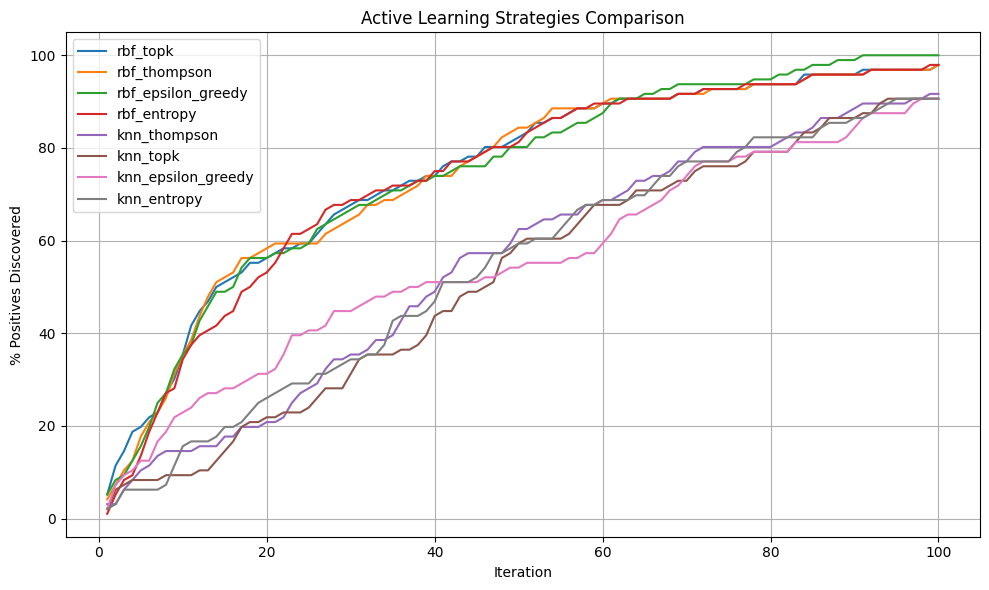

In [39]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report
from typing import List, Tuple, Literal
import matplotlib.pyplot as plt

KernelType = Literal['rbf', 'knn']
QueryStrategy = Literal['topk', 'thompson', 'epsilon_greedy', 'entropy']

def build_adjacency_matrix(G) -> Tuple[np.ndarray, dict]:
    all_nodes = sorted(G.nodes())
    node_idx_map = {n: i for i, n in enumerate(all_nodes)}
    N = len(all_nodes)
    W = np.zeros((N, N), dtype=float)
    for u, v, data in G.edges(data=True):
        i = node_idx_map[u]
        j = node_idx_map[v]
        w = data.get("weight", 1.0)
        W[i, j] = w
        W[j, i] = w
    return W, node_idx_map

def build_label_vectors(G, node_idx_map: dict) -> Tuple[np.ndarray, np.ndarray, List[int]]:
    N = len(node_idx_map)
    labels = np.full(N, -1, dtype=int)
    for n, attr in G.nodes(data=True):
        if attr["type"] == "publication":
            idx = node_idx_map[n]
            labels[idx] = int(attr.get("label_included", 0))
    labels_original = labels.copy()
    publication_indices = [node_idx_map[n] for n, d in G.nodes(data=True)
                           if d['type'] == 'publication' and labels_original[node_idx_map[n]] in [0, 1]]
    return labels, labels_original, publication_indices

def initialize_seed(labels_original, publication_indices: List[int], seed_positives, seed_negatives, seed=6) -> np.ndarray:
    np.random.seed(seed)
    labels_active = np.full_like(labels_original, fill_value=-1)
    ones = [i for i in publication_indices if labels_original[i] == 1]
    zeros = [i for i in publication_indices if labels_original[i] == 0]
    np.random.shuffle(ones)
    np.random.shuffle(zeros)
    seed_indices = ones[:seed_positives] + zeros[:seed_negatives]
    for idx in seed_indices:
        labels_active[idx] = labels_original[idx]
    return labels_active

def active_learning_loop(
    G,
    kernel: KernelType,
    query_strategy: QueryStrategy,
    gamma: float = 0.1,
    alpha_val: float = 0.2,
    max_iter: int = 300,
    n_iterations: int = 100,
    query_batch_size: int = 10,
    epsilon: float = 0.1,
    seed: int = 6
) -> List[float]:
    np.random.seed(seed)
    W, node_idx_map = build_adjacency_matrix(G)
    labels, labels_original, publication_indices = build_label_vectors(G, node_idx_map)
    labels = initialize_seed(labels_original, publication_indices, seed_positives=1, seed_negatives=1, seed=seed)

    model = LabelSpreading(kernel=kernel, gamma=gamma, alpha=alpha_val, max_iter=max_iter)
    total_positives = sum(labels_original[i] == 1 for i in publication_indices)
    
    alpha_exploit, beta_exploit = 1.0, 1.0
    alpha_explore, beta_explore = 1.0, 1.0

    discovery_curve = []

    for _ in range(n_iterations):
        model.fit(W, labels)
        label_distributions = model.label_distributions_
        unlabeled = [i for i in publication_indices if labels[i] == -1]
        if not unlabeled:
            break

        selected = []
        for _ in range(query_batch_size):
            if not unlabeled:
                break

            if query_strategy == 'thompson':
                sample_exploit = np.random.beta(alpha_exploit, beta_exploit)
                sample_explore = np.random.beta(alpha_explore, beta_explore)
                if sample_exploit >= sample_explore:
                    sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                    chosen = sorted_idx[0]
                    arm = 'exploit'
                else:
                    sorted_idx = sorted(unlabeled, key=lambda i: abs(label_distributions[i,1] - label_distributions[i,0]))
                    chosen = sorted_idx[0]
                    arm = 'explore'
            elif query_strategy == 'epsilon_greedy':
                if np.random.rand() < epsilon:
                    chosen = np.random.choice(unlabeled)
                    arm = 'explore'
                else:
                    sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                    chosen = sorted_idx[0]
                    arm = 'exploit'
            elif query_strategy == 'entropy':
                entropies = [-np.sum(p * np.log(p + 1e-12)) for p in label_distributions[unlabeled]]
                chosen = unlabeled[np.argmax(entropies)]
                arm = 'entropy'
            else:
                sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                chosen = sorted_idx[0]
                arm = 'topk'

            unlabeled.remove(chosen)
            true_label = labels_original[chosen]
            reward = 1 if true_label == 1 else 0

            if query_strategy == 'thompson':
                if arm == 'exploit':
                    alpha_exploit += reward
                    beta_exploit += 1 - reward
                elif arm == 'explore':
                    alpha_explore += reward
                    beta_explore += 1 - reward

            labels[chosen] = true_label
            selected.append((chosen, label_distributions[chosen, 1], true_label, arm))

        discovered = sum(labels[i] == 1 for i in publication_indices)
        percent = 100.0 * discovered / total_positives
        discovery_curve.append(percent)

    return discovery_curve

def run_all_experiments(G):
    configs = [
        ('rbf', 'topk'),
        ('rbf', 'thompson'),
        ('rbf', 'epsilon_greedy'),
        ('rbf', 'entropy'),
        ('knn', 'thompson'),
        ('knn', 'topk'),
        ('knn', 'epsilon_greedy'),
        ('knn', 'entropy')
    ]
    results = {}
    for kernel, strategy in configs:
        print(f"Running {kernel} + {strategy}...")
        curve = active_learning_loop(G, kernel=kernel, query_strategy=strategy)
        results[f"{kernel}_{strategy}"] = curve

    plt.figure(figsize=(10, 6))
    for label, curve in results.items():
        plt.plot(range(1, len(curve)+1), curve, label=label)
    plt.xlabel("Iteration")
    plt.ylabel("% Positives Discovered")
    plt.title("Active Learning Strategies Comparison")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

run_all_experiments(G)


Running rbf + topk...
Running rbf + thompson...
Running rbf + epsilon_greedy...
Running rbf + entropy...
Running knn + thompson...
Running knn + topk...
Running knn + epsilon_greedy...
Running knn + entropy...


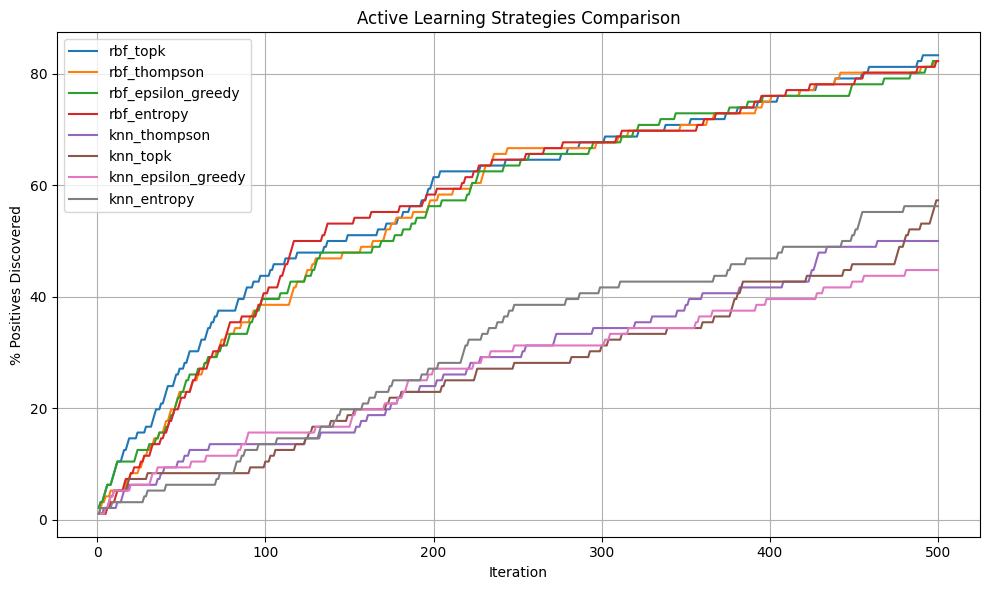

In [41]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report
from typing import List, Tuple, Literal
import matplotlib.pyplot as plt

KernelType = Literal['rbf', 'knn']
QueryStrategy = Literal['topk', 'thompson', 'epsilon_greedy', 'entropy']

def build_adjacency_matrix(G) -> Tuple[np.ndarray, dict]:
    all_nodes = sorted(G.nodes())
    node_idx_map = {n: i for i, n in enumerate(all_nodes)}
    N = len(all_nodes)
    W = np.zeros((N, N), dtype=float)
    for u, v, data in G.edges(data=True):
        i = node_idx_map[u]
        j = node_idx_map[v]
        w = data.get("weight", 1.0)
        W[i, j] = w
        W[j, i] = w
    return W, node_idx_map

def build_label_vectors(G, node_idx_map: dict) -> Tuple[np.ndarray, np.ndarray, List[int]]:
    N = len(node_idx_map)
    labels = np.full(N, -1, dtype=int)
    for n, attr in G.nodes(data=True):
        if attr["type"] == "publication":
            idx = node_idx_map[n]
            labels[idx] = int(attr.get("label_included", 0))
    labels_original = labels.copy()
    publication_indices = [node_idx_map[n] for n, d in G.nodes(data=True)
                           if d['type'] == 'publication' and labels_original[node_idx_map[n]] in [0, 1]]
    return labels, labels_original, publication_indices

def initialize_seed(labels_original, publication_indices: List[int], seed_positives, seed_negatives, seed=6) -> np.ndarray:
    np.random.seed(seed)
    labels_active = np.full_like(labels_original, fill_value=-1)
    ones = [i for i in publication_indices if labels_original[i] == 1]
    zeros = [i for i in publication_indices if labels_original[i] == 0]
    np.random.shuffle(ones)
    np.random.shuffle(zeros)
    seed_indices = ones[:seed_positives] + zeros[:seed_negatives]
    for idx in seed_indices:
        labels_active[idx] = labels_original[idx]
    return labels_active

def active_learning_loop(
    G,
    kernel: KernelType,
    query_strategy: QueryStrategy,
    gamma: float = 0.1,
    alpha_val: float = 0.2,
    max_iter: int = 300,
    n_iterations: int = 500,
    query_batch_size: int = 1,
    epsilon: float = 0.1,
    seed: int = 6
) -> List[float]:
    np.random.seed(seed)
    W, node_idx_map = build_adjacency_matrix(G)
    labels, labels_original, publication_indices = build_label_vectors(G, node_idx_map)
    labels = initialize_seed(labels_original, publication_indices, seed_positives=1, seed_negatives=1, seed=seed)

    model = LabelSpreading(kernel=kernel, gamma=gamma, alpha=alpha_val, max_iter=max_iter)
    total_positives = sum(labels_original[i] == 1 for i in publication_indices)
    
    alpha_exploit, beta_exploit = 1.0, 1.0
    alpha_explore, beta_explore = 1.0, 1.0

    discovery_curve = []

    for _ in range(n_iterations):
        model.fit(W, labels)
        label_distributions = model.label_distributions_
        unlabeled = [i for i in publication_indices if labels[i] == -1]
        if not unlabeled:
            break

        selected = []
        for _ in range(query_batch_size):
            if not unlabeled:
                break

            if query_strategy == 'thompson':
                sample_exploit = np.random.beta(alpha_exploit, beta_exploit)
                sample_explore = np.random.beta(alpha_explore, beta_explore)
                if sample_exploit >= sample_explore:
                    sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                    chosen = sorted_idx[0]
                    arm = 'exploit'
                else:
                    sorted_idx = sorted(unlabeled, key=lambda i: abs(label_distributions[i,1] - label_distributions[i,0]))
                    chosen = sorted_idx[0]
                    arm = 'explore'
            elif query_strategy == 'epsilon_greedy':
                if np.random.rand() < epsilon:
                    chosen = np.random.choice(unlabeled)
                    arm = 'explore'
                else:
                    sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                    chosen = sorted_idx[0]
                    arm = 'exploit'
            elif query_strategy == 'entropy':
                entropies = [-np.sum(p * np.log(p + 1e-12)) for p in label_distributions[unlabeled]]
                chosen = unlabeled[np.argmax(entropies)]
                arm = 'entropy'
            else:
                sorted_idx = sorted(unlabeled, key=lambda i: label_distributions[i, 1], reverse=True)
                chosen = sorted_idx[0]
                arm = 'topk'

            unlabeled.remove(chosen)
            true_label = labels_original[chosen]
            reward = 1 if true_label == 1 else 0

            if query_strategy == 'thompson':
                if arm == 'exploit':
                    alpha_exploit += reward
                    beta_exploit += 1 - reward
                elif arm == 'explore':
                    alpha_explore += reward
                    beta_explore += 1 - reward

            labels[chosen] = true_label
            selected.append((chosen, label_distributions[chosen, 1], true_label, arm))

        discovered = sum(labels[i] == 1 for i in publication_indices)
        percent = 100.0 * discovered / total_positives
        discovery_curve.append(percent)

    return discovery_curve

def run_all_experiments(G):
    configs = [
        ('rbf', 'topk'),
        ('rbf', 'thompson'),
        ('rbf', 'epsilon_greedy'),
        ('rbf', 'entropy'),
        ('knn', 'thompson'),
        ('knn', 'topk'),
        ('knn', 'epsilon_greedy'),
        ('knn', 'entropy')
    ]
    results = {}
    for kernel, strategy in configs:
        print(f"Running {kernel} + {strategy}...")
        curve = active_learning_loop(G, kernel=kernel, query_strategy=strategy)
        results[f"{kernel}_{strategy}"] = curve

    plt.figure(figsize=(10, 6))
    for label, curve in results.items():
        plt.plot(range(1, len(curve)+1), curve, label=label)
    plt.xlabel("Iteration")
    plt.ylabel("% Positives Discovered")
    plt.title("Active Learning Strategies Comparison")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

run_all_experiments(G)


## 2.4. (D) Citation Network [P->P]

In [1]:
import os
import ast
import pandas as pd
import networkx as nx

# ------------------------------------------------------------
# 1. Load Your CSV
# ------------------------------------------------------------
processed_folder_path = os.path.join(os.getcwd(),"..", "data", "pre_processed")
csv_path = os.path.join(processed_folder_path, "temp.csv")
df = pd.read_csv(csv_path)
print("Database loaded from:", csv_path)
print(df.head())

# ------------------------------------------------------------
# 2. Initialize a Directed Graph for Citations
# ------------------------------------------------------------
G_citation = nx.DiGraph()

# We'll store all paper IDs in a set to quickly check
all_paper_ids = set(df["id"])

# ------------------------------------------------------------
# 3. Add Nodes (One per Paper) with Metadata
# ------------------------------------------------------------
for idx, row in df.iterrows():
    paper_id = row["id"]
    
    # You can store additional attributes, e.g. 'label_included', 'title'
    node_attrs = {
        "label_included": row.get("label_included", 0),
        "title": row.get("title", None),
        "publication_year": row.get("publication_year", None),
        # add more if needed
    }
    # Add the paper node to the graph
    G_citation.add_node(paper_id, **node_attrs)

# ------------------------------------------------------------
# 4. Add Edges for Citations (Directed from citing -> cited)
# ------------------------------------------------------------
for idx, row in df.iterrows():
    citing_paper = row["id"]
    ref_works_str = row.get("referenced_works", None)
    if pd.isna(ref_works_str):
        continue
    # Convert the string representation to a Python list (e.g., using ast.literal_eval)
    try:
        ref_list = ast.literal_eval(ref_works_str)
    except Exception as e:
        # If there's a parsing issue, skip
        continue
    
    # Add a directed edge from citing_paper -> each referenced paper
    for ref_id in ref_list:
        if ref_id in all_paper_ids:
            # Only add an edge if the referenced paper is also in the dataset
            G_citation.add_edge(citing_paper, ref_id)

# ------------------------------------------------------------
# 5. Print Summary
# ------------------------------------------------------------
print(f"Built a directed citation graph with {G_citation.number_of_nodes()} nodes "
      f"and {G_citation.number_of_edges()} edges.")

# Example: top in-degree or out-degree papers
# (Out-degree is how many papers a paper cites; In-degree is how many times it's cited)
top_in_degree = sorted(G_citation.in_degree, key=lambda x: x[1], reverse=True)[:5]
top_out_degree = sorted(G_citation.out_degree, key=lambda x: x[1], reverse=True)[:5]
print("Top 5 by in-degree (most cited):", top_in_degree)
print("Top 5 by out-degree (biggest citers):", top_out_degree)

# Optionally save to a GEXF file for external visualization, e.g., in Gephi:
# nx.write_gexf(G_citation, os.path.join(processed_folder_path, "citation_network.gexf"))


Database loaded from: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\pre_processed\temp.csv
                                 id  \
0  https://openalex.org/W3007172259   
1  https://openalex.org/W2088256967   
2  https://openalex.org/W1830000322   
3  https://openalex.org/W2504228461   
4  https://openalex.org/W2057344590   

                                            doi  \
0     https://doi.org/10.1186/s12913-016-1423-5   
1  https://doi.org/10.1016/j.arthro.2013.09.074   
2     https://doi.org/10.1007/s10529-015-1975-1   
3             https://doi.org/10.1002/stem.2475   
4    https://doi.org/10.1016/j.msec.2005.07.024   

                                               title  \
0  Proceedings of the 3rd IPLeiria’s Internationa...   
1  Injectable Cultured Bone Marrow–Derived Mesenc...   
2  Three-dimensional bioprinting in tissue engine...   
3  Allogeneic Mesenchymal Stem Cells Stimulate Ca...   
4  Preparation of a biphasic scaffold for osteoch...   

Network Analysis & Statistics

In [2]:
import networkx as nx

# ------------------------------------------------------------
# Assuming you already have a directed graph `G_citation` (nx.DiGraph)
# containing paper nodes and directed edges representing citations.
# ------------------------------------------------------------

# 1. Basic Network Information
if G_citation.number_of_nodes() > 0:
    avg_out_degree = G_citation.number_of_edges() / G_citation.number_of_nodes()
    print(f"  Average out-degree: {avg_out_degree:.2f}")

# Alternatively, manually print stats:
num_nodes = G_citation.number_of_nodes()
num_edges = G_citation.number_of_edges()
print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")

# 2. Degree Measures
# (Out-degree = how many references a paper makes)
# (In-degree = how many citations a paper receives)

# Top 5 by out-degree
top_out_degree = sorted(G_citation.out_degree, key=lambda x: x[1], reverse=True)[:5]
print("Top 5 Papers by Out-Degree (most references):")
for paper, deg in top_out_degree:
    print(f"  {paper} => {deg} references")

# Top 5 by in-degree
top_in_degree = sorted(G_citation.in_degree, key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 Papers by In-Degree (most cited):")
for paper, deg in top_in_degree:
    print(f"  {paper} => {deg} citations")

# 3. Density (fraction of possible directed edges that exist)
# For a directed graph with N nodes, max edges = N*(N-1).
density = nx.density(G_citation)
print(f"\nNetwork density: {density:.4f}")

# 4. PageRank
# PageRank is a measure of node importance, originally for ranking webpages.
pr = nx.pagerank(G_citation, alpha=0.85)  # alpha=0.85 or 0.9 are common damping factors
# Print top 5 by PageRank
top_pagerank = sorted(pr.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 Papers by PageRank:")
for paper, score in top_pagerank:
    print(f"  {paper}: {score:.6f}")

# 5. Betweenness Centrality
# A measure of how many shortest paths pass through each node.
# For large networks, this can be expensive (O(N^3) default).
# You might consider approximate methods (e.g., nx.betweenness_centrality_subset) for big graphs.
bet = nx.betweenness_centrality(G_citation, k=None, normalized=True)
# Print top 5 by betweenness
top_bet = sorted(bet.items(), key=lambda x: x[1], reverse=True)[:5]
print("\nTop 5 Papers by Betweenness Centrality:")
for paper, score in top_bet:
    print(f"  {paper}: {score:.6f}")

# 6. Strongly Connected Components
# A strongly connected component (SCC) is a subgraph where each node is reachable from any other.
sccs = list(nx.strongly_connected_components(G_citation))
print(f"\nNumber of strongly connected components: {len(sccs)}")

# Example: find the largest SCC
largest_scc = max(sccs, key=len)
print(f"Largest SCC size: {len(largest_scc)}")

# If the graph is not too large, you could explore subgraph properties:
largest_scc_subgraph = G_citation.subgraph(largest_scc)
# Then run analyses on that subgraph, e.g. average shortest path length.

# ------------------------------------------------------------
# End of analysis snippet
# ------------------------------------------------------------


  Average out-degree: 5.66
Number of nodes: 1175
Number of edges: 6645
Top 5 Papers by Out-Degree (most references):
  https://openalex.org/W2939738537 => 60 references
  https://openalex.org/W2062882455 => 34 references
  https://openalex.org/W2155200798 => 32 references
  https://openalex.org/W2017965041 => 31 references
  https://openalex.org/W2144152716 => 29 references

Top 5 Papers by In-Degree (most cited):
  https://openalex.org/W2223297936 => 184 citations
  https://openalex.org/W1942341118 => 131 citations
  https://openalex.org/W2083667175 => 108 citations
  https://openalex.org/W2042511089 => 90 citations
  https://openalex.org/W2133096089 => 83 citations

Network density: 0.0048

Top 5 Papers by PageRank:
  https://openalex.org/W1942341118: 0.046214
  https://openalex.org/W2223297936: 0.045178
  https://openalex.org/W2074895129: 0.022875
  https://openalex.org/W2052593694: 0.022006
  https://openalex.org/W1887263623: 0.021506

Top 5 Papers by Betweenness Centrality:
  http

(no multi-node strongly connected components), this is a typical pattern in scientific citations, where older papers seldom cite future ones.


Acyclic Graph:

An acyclic graph is a graph having no graph cycles. Acyclic graphs are bipartite.

A connected acyclic graph is known as a tree, and a possibly disconnected acyclic graph is known as a forest (i.e., a collection of trees).

The numbers of acyclic graphs (forests) on n=1, 2, ... are 1, 2, 3, 6, 10, 20, 37, 76, 153, ... (OEIS A005195), and the corresponding numbers of connected acyclic graphs (trees) are 1, 1, 1, 2, 3, 6, 11, 23, 47, 106, ... (OEIS A000055).

A graph can be tested in the Wolfram Language to see if it is acyclic using AcyclicGraphQ[g], and a collection of acyclic graphs are available as GraphData["Acyclic"].

A graph with a single cycle is known as a unicyclic graph.
https://mathworld.wolfram.com/AcyclicGraph.html

In [9]:
nx.write_gexf(G_citation, "citation_network.gexf")

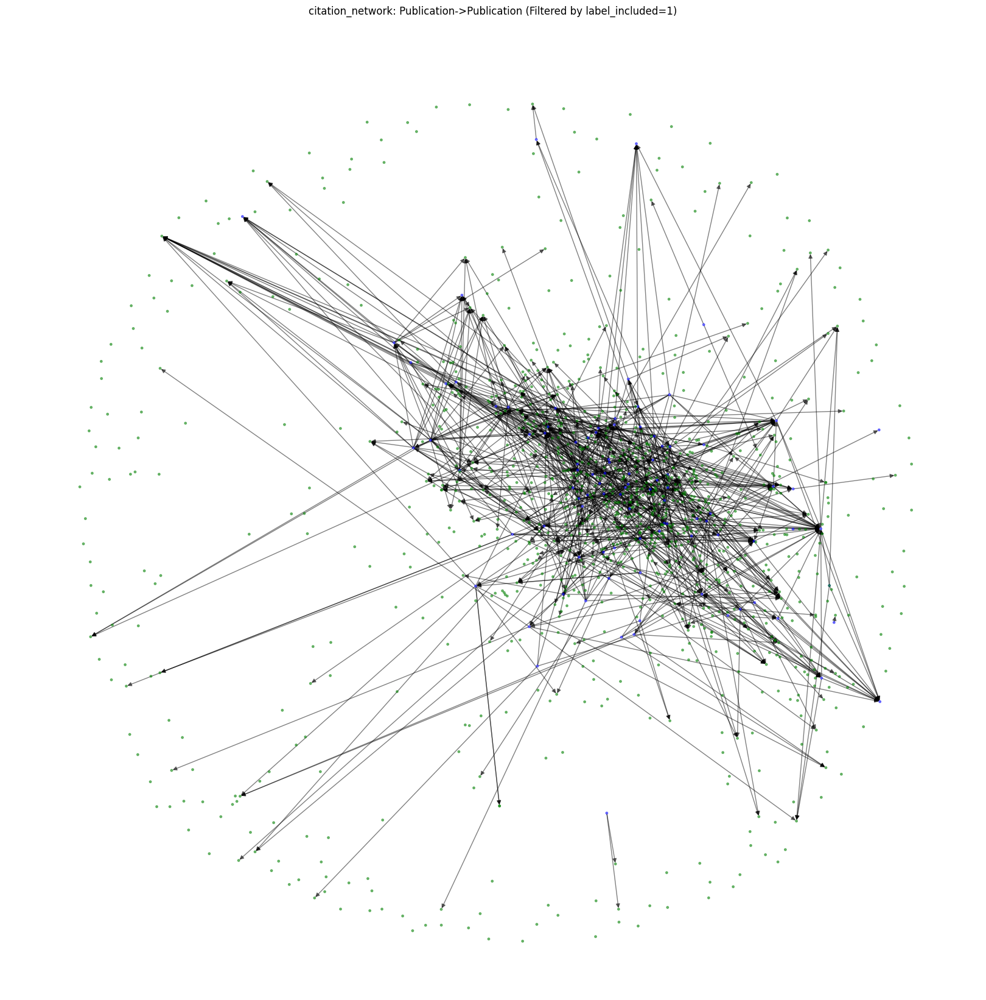

In [10]:
import matplotlib.pyplot as plt

# Filter edges where the source node has label_included=1
filtered_edges = [(u, v) for u, v in G_citation.edges() if G_citation.nodes[u].get('label_included') == 1]

# Define node colors based on type (publications vs topics)
node_colors = ["blue" if G_citation.nodes[node]['label_included'] == 1 else "green" for node in G_citation.nodes]

plt.figure(figsize=(16, 16))
nx.draw(G_citation, edgelist=filtered_edges, with_labels=False, node_size=6, alpha=0.5, node_color=node_colors)
plt.title("citation_network: Publication->Publication (Filtered by label_included=1)")
plt.show()


In [11]:
import pandas as pd
import networkx as nx

# ---------------------------------------------
# Assuming 'G_citation' is your directed graph
# of publications (nodes) and citations (edges).
# ---------------------------------------------

# A. Initialize a dataframe to hold features for each node (paper)
df_features = pd.DataFrame(index=G_citation.nodes(), columns=[])

# B. Basic degree measures
# in_degree = how many times a paper is cited
# out_degree = how many references a paper makes
df_features['in_degree'] = [val for (node, val) in G_citation.in_degree()]
df_features['out_degree'] = [val for (node, val) in G_citation.out_degree()]

# C. PageRank
# Measures node "importance" in a directed network
pr = nx.pagerank(G_citation, alpha=0.85)
df_features['pagerank'] = df_features.index.map(pr)

# D. Betweenness Centrality
# High betweenness => a paper sits on many shortest paths
bet = nx.betweenness_centrality(G_citation, normalized=True)
df_features['betweenness'] = df_features.index.map(bet)

# E. (Optional) Any other network measure
# e.g., HITS scores, or a custom measure you define.

# Print or inspect the feature DataFrame
print(df_features.head())

# (Optional) Save to CSV for use in machine learning:
# df_features.to_csv("citation_features.csv")


                                  in_degree  out_degree  pagerank  betweenness
https://openalex.org/W3007172259          0           0  0.000317     0.000000
https://openalex.org/W2088256967         12           8  0.001094     0.000275
https://openalex.org/W1830000322          0           1  0.000317     0.000000
https://openalex.org/W2504228461          1           3  0.000363     0.000029
https://openalex.org/W2057344590          3           0  0.001485     0.000000


In [12]:
import community.community_louvain as community  # pip install python-louvain

# ---------------------------------------------
# Convert directed to undirected for Louvain
# ---------------------------------------------
G_undirected = G_citation.to_undirected()

# Best-partition returns a dict: {node: community_id}
partition = community.best_partition(G_undirected)

# Add the detected community as a feature in our dataframe
df_features['community'] = df_features.index.map(partition)

# Inspect how many communities we have
unique_communities = df_features['community'].nunique()
print(f"Detected {unique_communities} communities using Louvain.")

# (Optional) For each community, see how many papers it contains:
community_sizes = df_features['community'].value_counts()
print("\nCommunity sizes:")
print(community_sizes)

# You can also group your papers by community for further analysis:
for comm_id, group in df_features.groupby('community'):
    print(f"\nCommunity {comm_id} => {len(group)} papers")
    # Optionally list top in_degree or PageRank within this group

# Example: Count relevant vs. non-relevant within each community
for comm_id, group in df_features.groupby('community'):
    # 'community' = your assigned community label
    community_papers = group.index  # node IDs in this community
    relevant_count = 0
    total_count = len(community_papers)
    for paper_id in community_papers:
        # Suppose you stored label_included in the graph node attributes:
        if G_citation.nodes[paper_id].get('label_included', 0) == 1:
            relevant_count += 1
    print(f"Community {comm_id} -> {total_count} papers, {relevant_count} relevant")



Detected 106 communities using Louvain.

Community sizes:
community
1     189
5     161
2     156
31    132
3     128
     ... 
8       1
12      1
44      1
16      1
17      1
Name: count, Length: 106, dtype: int64

Community 0 => 1 papers

Community 1 => 189 papers

Community 2 => 156 papers

Community 3 => 128 papers

Community 4 => 104 papers

Community 5 => 161 papers

Community 6 => 1 papers

Community 7 => 1 papers

Community 8 => 1 papers

Community 9 => 2 papers

Community 10 => 2 papers

Community 11 => 100 papers

Community 12 => 1 papers

Community 13 => 1 papers

Community 14 => 57 papers

Community 15 => 38 papers

Community 16 => 1 papers

Community 17 => 1 papers

Community 18 => 1 papers

Community 19 => 1 papers

Community 20 => 1 papers

Community 21 => 1 papers

Community 22 => 1 papers

Community 23 => 1 papers

Community 24 => 3 papers

Community 25 => 1 papers

Community 26 => 1 papers

Community 27 => 7 papers

Community 28 => 1 papers

Community 29 => 1 papers

In [13]:
import os
import pandas as pd
import networkx as nx
import community.community_louvain as community
from scipy.stats import ttest_ind

# ------------------------------------------------------------
# 1. Load or Build your Directed Citation Graph `G_citation`
#    and the feature DataFrame `df_features` as shown earlier.
# ------------------------------------------------------------

# Suppose you have your directed graph `G_citation` from previous steps,
# and `df_features` with columns: in_degree, out_degree, pagerank, betweenness.

# We'll also need 'label_included' for each paper.
# If you saved it as a node attribute when building G_citation:
df_features['label_included'] = [G_citation.nodes[n].get('label_included', 0)
                                 for n in df_features.index]

# Optionally, check how many relevant vs non-relevant
num_relevant = (df_features['label_included'] == 1).sum()
num_non_relevant = (df_features['label_included'] == 0).sum()
print(f"Relevant papers: {num_relevant}, Non-relevant papers: {num_non_relevant}")

# ------------------------------------------------------------
# 2. Two-Sample t-tests for each citation-based feature
# ------------------------------------------------------------
relevant_df = df_features[df_features['label_included'] == 1]
non_relevant_df = df_features[df_features['label_included'] == 0]

features_to_test = ['in_degree', 'out_degree', 'pagerank', 'betweenness']

print("\nT-test results (relevant vs. non-relevant, alpha=0.01):\n")

for feat in features_to_test:
    # Extract the feature values for the two groups
    group1 = relevant_df[feat].dropna()
    group2 = non_relevant_df[feat].dropna()
    
    # Perform an independent two-sample t-test
    t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
    
    # Check significance at alpha=0.01
    sig_str = "SIGNIFICANT" if p_val < 0.01 else "NOT significant"
    
    print(f"Feature: {feat}")
    print(f"  t-statistic = {t_stat:.4f}, p-value = {p_val:.6e} -> {sig_str}")



Relevant papers: 96, Non-relevant papers: 1079

T-test results (relevant vs. non-relevant, alpha=0.01):

Feature: in_degree
  t-statistic = 4.2009, p-value = 5.929214e-05 -> SIGNIFICANT
Feature: out_degree
  t-statistic = 3.8578, p-value = 1.829051e-04 -> SIGNIFICANT
Feature: pagerank
  t-statistic = 2.1703, p-value = 3.245713e-02 -> NOT significant
Feature: betweenness
  t-statistic = 3.3284, p-value = 1.205160e-03 -> SIGNIFICANT


In [1]:
import os
import pandas as pd
import numpy as np
import networkx as nx
import torch
import ast
import torch.nn.functional as F
from torch_geometric.utils import from_networkx
from torch_geometric.nn import GATConv
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

# ----------------------------
# Load the Dataset
# ----------------------------
# Define the path to the processed folder and the CSV file
processed_folder_path = os.path.join(os.getcwd(), "..", "data", "pre_processed")
csv_path = os.path.join(processed_folder_path, "temp.csv")

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_path)

# ----------------------------
# Build the NetworkX Graph
# ----------------------------
# Initialize a directed graph
G = nx.DiGraph()

# Extract publication IDs from the DataFrame
publication_nodes = set(df["id"].apply(lambda x: x.split('/')[-1]))
concept_nodes = set()  # Initialize an empty set for concept nodes

# ---- Step 1: Add all Publication Nodes first ----
# Iterate over each row in the DataFrame to add publication nodes
for idx, row in df.iterrows():
    pub_id = row["id"].split('/')[-1]  # Extract the publication ID
    # Add the publication node with its attributes
    G.add_node(
        pub_id,
        type="publication",
        label=row.get("label_included", -1),
        title=row.get("title_clean", ""),
        abstract=row.get("abstract_clean", ""),
        year=row.get("publication_year", 0),
        name="",
        level=-1,
        score=-1.0
    )

# ---- Step 2: Add Concept Nodes and Edges, and Citation Edges ----
# Iterate over each row in the DataFrame to add concept nodes and edges, and citation edges
for idx, row in df.iterrows():
    pub_id = row["id"].split('/')[-1]  # Extract the publication ID

    # --- Parse Concepts ---
    raw_concepts = row.get("concepts", "[]")
    if isinstance(raw_concepts, str):
        try:
            concepts = ast.literal_eval(raw_concepts)  # Safely parse the string to a list
        except Exception as e:
            print(f"Error parsing concepts for {pub_id}: {e}")
            concepts = []
    else:
        concepts = raw_concepts if isinstance(raw_concepts, list) else []

    # Iterate over each concept to add concept nodes and edges
    for concept in concepts:
        concept_id = concept["id"].split('/')[-1]  # Extract the concept ID
        concept_name = concept.get("display_name", "unknown")
        concept_level = concept.get("level", 1)
        concept_score = concept.get("score", 1.0)

        # Add the concept node if it doesn't already exist
        if concept_id not in concept_nodes:
            G.add_node(
                concept_id,
                type="concept",
                name=concept_name,
                level=concept_level,
                score=concept_score,
                label=-1,
                title="",
                abstract="",
                year=0
            )
            concept_nodes.add(concept_id)  # Add the concept ID to the set

        # Add an edge from the publication to the concept
        G.add_edge(
            pub_id,
            concept_id,
            type="has_concept",
            weight=float(concept_score) * float(concept_level)
        )

    # --- Add Citation Edges ---
    ref_works_str = row.get("referenced_works", None)
    if pd.isna(ref_works_str):
        continue  # Skip if there are no referenced works
    try:
        ref_list = ast.literal_eval(ref_works_str)  # Safely parse the string to a list
    except Exception:
        continue  # Skip if parsing fails

    # Iterate over each referenced work to add citation edges
    for ref_id_full in ref_list:
        ref_id = ref_id_full.split('/')[-1]  # Extract the referenced publication ID
        if ref_id in publication_nodes:
            G.add_edge(
                pub_id,
                ref_id,
                type="citation",
                weight=1.0
            )

#### Test the graph
## Basic Graph Summary
#print(f"Total Nodes: {G.number_of_nodes()}")
#print(f"Total Edges: {G.number_of_edges()}")
#
## Count nodes by type
#node_types = nx.get_node_attributes(G, 'type')
#num_publications = sum(1 for t in node_types.values() if t == 'publication')
#num_concepts = sum(1 for t in node_types.values() if t == 'concept')
#print(f"Publications: {num_publications}, Concepts: {num_concepts}")
#
## Edge type distribution
#edge_types = nx.get_edge_attributes(G, 'type')
#concept_edges = sum(1 for t in edge_types.values() if t == 'has_concept')
#citation_edges = sum(1 for t in edge_types.values() if t == 'citation')
#print(f"Concept Edges: {concept_edges}, Citation Edges: {citation_edges}")
## ----------------------------

## 2.5. Paper To topic Graph Relation [T->P]

### 2.5.1 Build the Graph

In [1]:
import os
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans

# =============================================================================
# PART 1: BUILD THE GRAPH FROM PUBLICATIONS AND TOPICS
# =============================================================================
# ----------------------------
# Setup: Load Data and Graph
# ----------------------------
# Construct the processed folder path dynamically
processed_folder_path = os.path.join(os.getcwd(),"..", "data", "pre_processed")
csv_file = os.path.join(processed_folder_path, "temp.csv")

# Load dataset
df = pd.read_csv(csv_file)
print("Database loaded from:", csv_file)

# ----------------------------
# Build Graph from Publications and Topics
# ----------------------------
G = nx.Graph()
publication_nodes = set()
topic_nodes = set()

# Build graph using the 'openalex_topics' field (each is a list of topic dicts)
for idx, row in df.iterrows():
    pub_id = row["id"]
    G.add_node(pub_id,
               type="publication",
               label_included=row.get("label_included"),
               title=row.get("title_clean"),
               abstract=row.get("abstract_clean"),
               year=row.get("publication_year"))
    publication_nodes.add(pub_id)
    
    # Parse topics (use eval if stored as string)
    raw_topics = row.get("openalex_topics", "[]")
    if isinstance(raw_topics, str):
        try:
            topics = eval(raw_topics)
        except Exception as e:
            print(f"Error evaluating topics for publication {pub_id}: {e}")
            topics = []
    elif isinstance(raw_topics, list):
        topics = raw_topics
    else:
        topics = []
    
    # Add topic nodes and connect with an edge (weight = topic score)
    for topic in topics:
        topic_id_full = topic.get("id", "")
        if topic_id_full:
            topic_id = topic_id_full.rstrip("/").split("/")[-1]  # e.g., "T10105"
        else:
            continue
        topic_name = topic.get("display_name", "unknown")
        topic_score = topic.get("score", 1.0)
        if topic_id not in topic_nodes:
            G.add_node(topic_id,
                       type="topic",
                       name=topic_name,
                       score=topic_score,
                       subfield=topic.get("subfield", {}),
                       field=topic.get("field", {}),
                       domain=topic.get("domain", {}))
            topic_nodes.add(topic_id)
        G.add_edge(pub_id, topic_id, weight=float(topic_score), relationship="has_topic")

print(f"Graph built with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")
print(f"Publication nodes: {len(publication_nodes)}, topic nodes: {len(topic_nodes)}")

# ----------------------------
# 2. Graph Summary and Saving
# ----------------------------
print(f"Total nodes: {G.number_of_nodes()}")
print(f"Total edges: {G.number_of_edges()}")
print(f"Publication nodes: {len(publication_nodes)}")
print(f"Topic nodes: {len(topic_nodes)}")

# Save the graph as a GEXF file (for visualization in tools like Gephi)
gexf_path = os.path.join(os.getcwd(),"..", "data", "Graph", "Topic_Paper_Graph.gexf")
nx.write_gexf(G, gexf_path)
print("Graph saved as GEXF file at:", gexf_path)

# Also, convert the edge list to a DataFrame and save as CSV
edge_df = nx.to_pandas_edgelist(G)
edge_csv_path = os.path.join(os.getcwd(),"..", "data", "Graph", "graph_edges.csv")
edge_df.to_csv(edge_csv_path, index=False)
print("Graph edge list saved as CSV at:", edge_csv_path)


Database loaded from: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\pre_processed\temp.csv
Graph built with 1273 nodes and 3495 edges.
Publication nodes: 1175, topic nodes: 98
Total nodes: 1273
Total edges: 3495
Publication nodes: 1175
Topic nodes: 98
Graph saved as GEXF file at: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\Graph\Topic_Paper_Graph.gexf
Graph edge list saved as CSV at: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\Graph\graph_edges.csv


### 2.5.2 Data Analysis

Total nodes: 1273
Total edges: 3495
Publication nodes: 1175
Topic nodes: 98
Graph saved as GEXF file at: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\pre_processed\Topic_Paper_Graph.gexf
Graph edge list saved as CSV at: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\pre_processed\graph_edges.csv
Average Degree Centrality: 0.0043
Top Topics by Degree Centrality: [('T10105', 0.7790880503144655), ('T10442', 0.6328616352201258), ('T10562', 0.3789308176100629), ('T11570', 0.21933962264150944), ('T11018', 0.14150943396226415), ('T10176', 0.09276729559748428), ('T11068', 0.09040880503144655), ('T10455', 0.04088050314465409), ('T11966', 0.03537735849056604), ('T11131', 0.025943396226415096)]
Top Papers by topic Connections: [('https://openalex.org/W2088256967', 3), ('https://openalex.org/W1830000322', 3), ('https://openalex.org/W2504228461', 3), ('https://openalex.org/W2057344590', 3), ('https://openalex.org/W2091961852', 3), ('ht

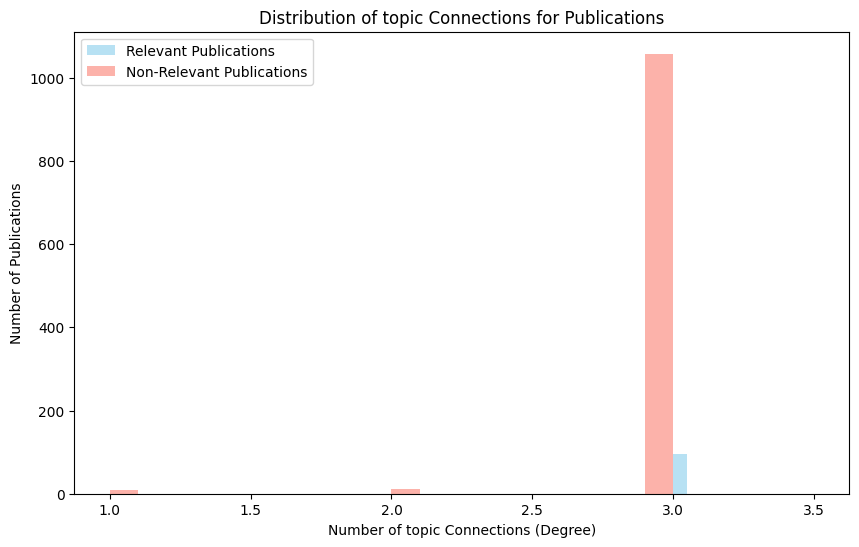

T-test comparing topic connections:
  t-statistic = 4.3662, p-value = 1.3858e-05


c:\Users\vares\visualization-graph-learning-paper-screening\env\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [2]:
import community.community_louvain as community  # Install via: pip install python-louvain
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# ----------------------------
# 3. Graph Metrics and Evaluation
# ----------------------------
# Compute degree centrality for all nodes
degree_centrality = nx.degree_centrality(G)
avg_degree = sum(degree_centrality.values()) / len(degree_centrality)
print(f"Average Degree Centrality: {avg_degree:.4f}")

# Top topics by Degree Centrality (for nodes of type "topic")
topic_centrality = {n: centrality for n, centrality in degree_centrality.items() if G.nodes[n]['type'] == 'topic'}
top_topics = sorted(topic_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top Topics by Degree Centrality:", top_topics)

# Top Publications by number of topic connections (degree for publication nodes)
publication_degrees = [(n, d) for n, d in G.degree() if G.nodes[n]['type'] == 'publication']
top_papers = sorted(publication_degrees, key=lambda x: x[1], reverse=True)[:10]
print("Top Papers by topic Connections:", top_papers)

# Community Detection using the Louvain method
partition = community.best_partition(G)
num_communities = len(set(partition.values()))
print(f"Detected {num_communities} research communities")

# ----------------------------
# 4. Evaluation Based on label_included (Active Search for Minority Label '1')
# ----------------------------
# Identify publications with the minority label '1'
relevant_papers = [n for n, d in G.nodes(data=True) if d["type"] == "publication" and d.get("label_included") == 1]
print(f"Total relevant (label_included==1) papers: {len(relevant_papers)}")

# For active search: sort publications by the number of topic connections (degree)
# so that papers with more topic connections (potentially more informative) are prioritized.
publication_degree_dict = {n: d for n, d in G.degree() if G.nodes[n]['type'] == 'publication'}
sorted_relevant = sorted(relevant_papers, key=lambda n: publication_degree_dict.get(n, 0), reverse=True)
print("Sorted relevant papers (by number of topic connections):")
for paper in sorted_relevant[:10]:
    print(paper, "degree:", publication_degree_dict.get(paper, 0))

# Optionally, calculate topic distribution among relevant papers:
topic_counts = {}
for pub in relevant_papers:
    for neighbor in G.neighbors(pub):
        if G.nodes[neighbor]["type"] == "topic":
            topic_counts[neighbor] = topic_counts.get(neighbor, 0) + 1
sorted_topic_counts = sorted(topic_counts.items(), key=lambda x: x[1], reverse=True)
print("Top Topics in Relevant Papers:", sorted_topic_counts[:10])

# ----------------------------
# 5. Compare Degree Distributions for Relevant vs Non-Relevant Publications
# ----------------------------
relevant_degrees = []
non_relevant_degrees = []

for n, attr in G.nodes(data=True):
    if attr.get("type") == "publication":
        deg = G.degree(n)
        if attr.get("label_included") == 1:
            relevant_degrees.append(deg)
        else:
            non_relevant_degrees.append(deg)

print("Relevant Publications (label_included==1):")
print(f"  Count: {len(relevant_degrees)}")
print(f"  Average topic Connections: {np.mean(relevant_degrees):.2f} (Std: {np.std(relevant_degrees):.2f})")

print("Non-Relevant Publications (label_included!=1):")
print(f"  Count: {len(non_relevant_degrees)}")
print(f"  Average topic Connections: {np.mean(non_relevant_degrees):.2f} (Std: {np.std(non_relevant_degrees):.2f})")

plt.figure(figsize=(10, 6))
plt.hist(relevant_degrees, bins=20, alpha=0.6, label='Relevant Publications', color='skyblue')
plt.hist(non_relevant_degrees, bins=20, alpha=0.6, label='Non-Relevant Publications', color='salmon')
plt.xlabel("Number of topic Connections (Degree)")
plt.ylabel("Number of Publications")
plt.title("Distribution of topic Connections for Publications")
plt.legend()
plt.show()

t_stat, p_val = ttest_ind(relevant_degrees, non_relevant_degrees, equal_var=False)
print("T-test comparing topic connections:")
print(f"  t-statistic = {t_stat:.4f}, p-value = {p_val:.4e}")


### 2.5.3 visualization

Note: you may need to restart the kernel to use updated packages.
Database loaded from: c:\Users\vares\visualization-graph-learning-paper-screening\notebooks\..\data\pre_processed\temp.csv
Graph built with 1273 nodes and 3495 edges.
Publication nodes: 1175, topic nodes: 98
Detected 20 communities


C:\Users\vares\AppData\Local\Temp\ipykernel_15216\3978246108.py:119: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_topics_df, x="topic", y="centrality", palette="viridis")
C:\Users\vares\AppData\Local\Temp\ipykernel_15216\3978246108.py:197: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([relevant_degrees, non_relevant_degrees], labels=['Relevant', 'Non-Relevant'])


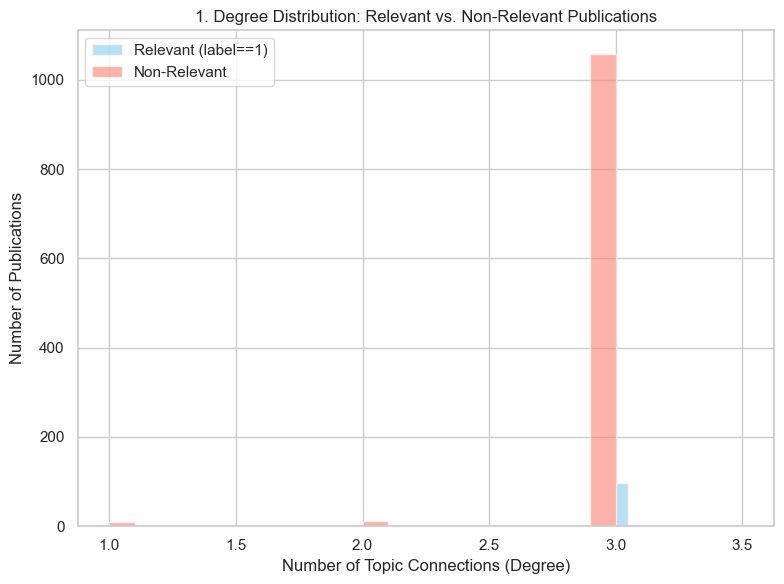

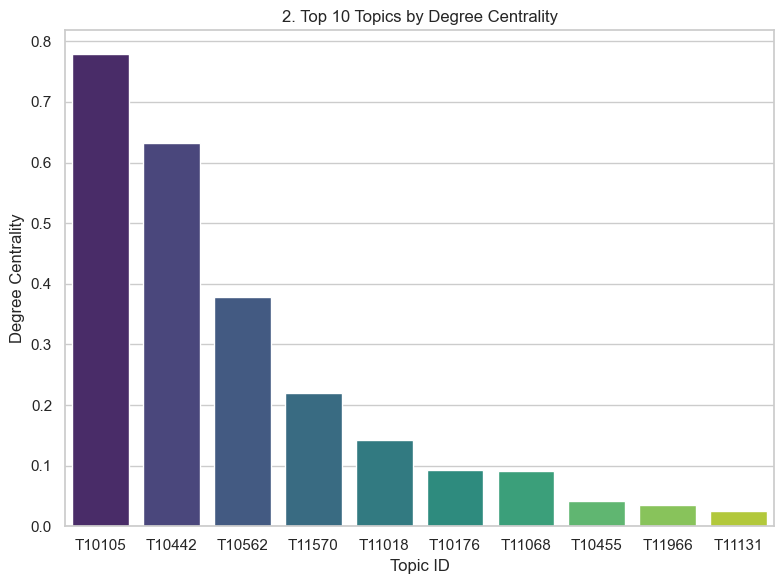

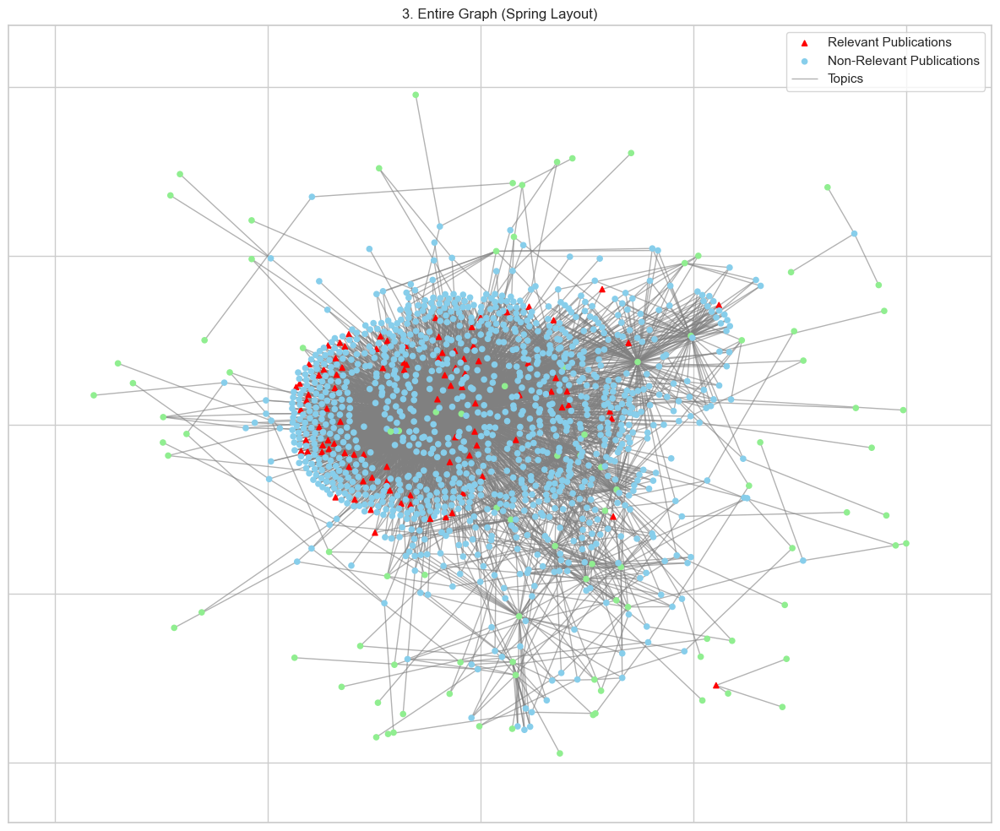

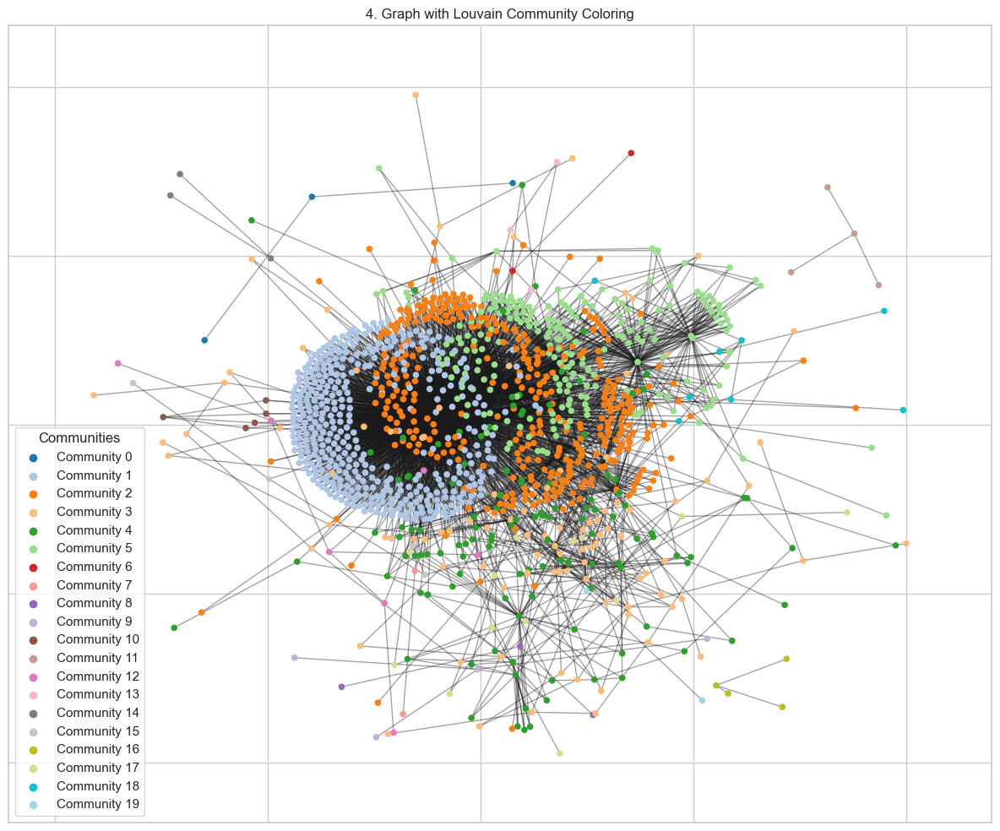

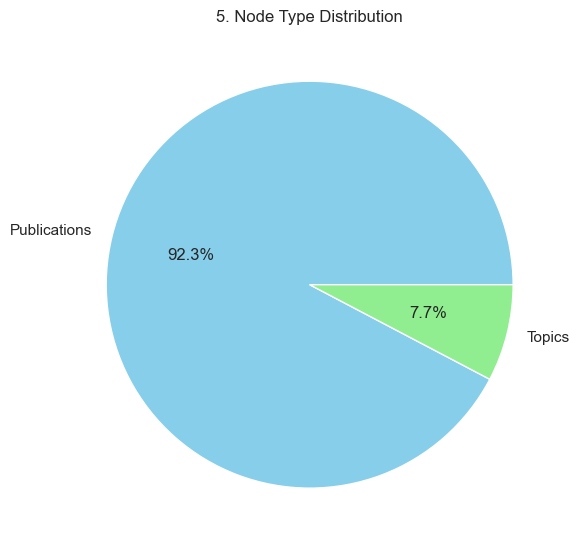

...

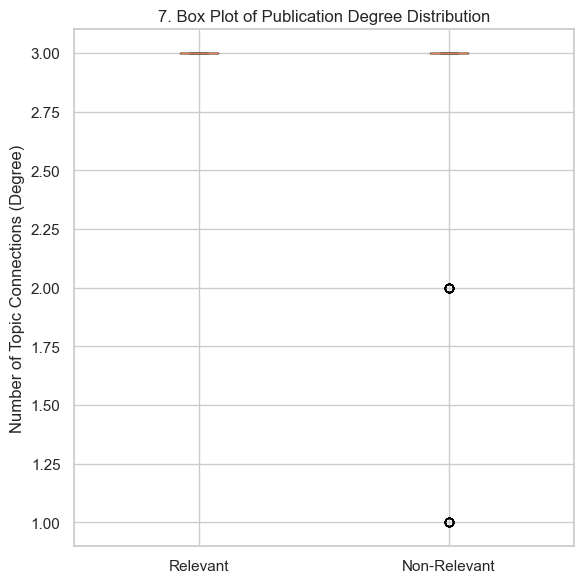

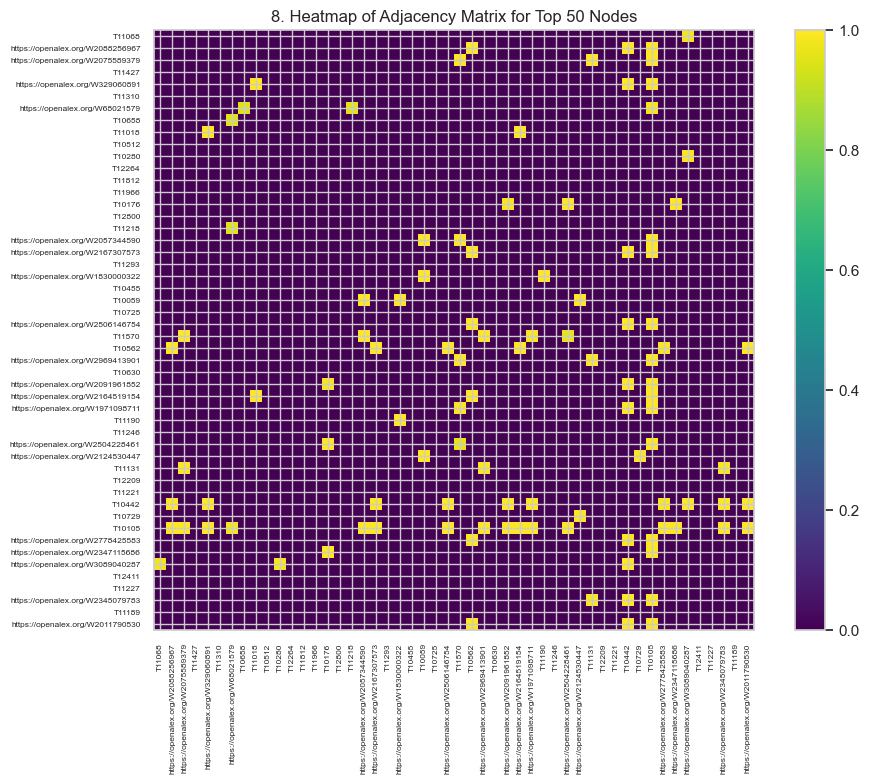

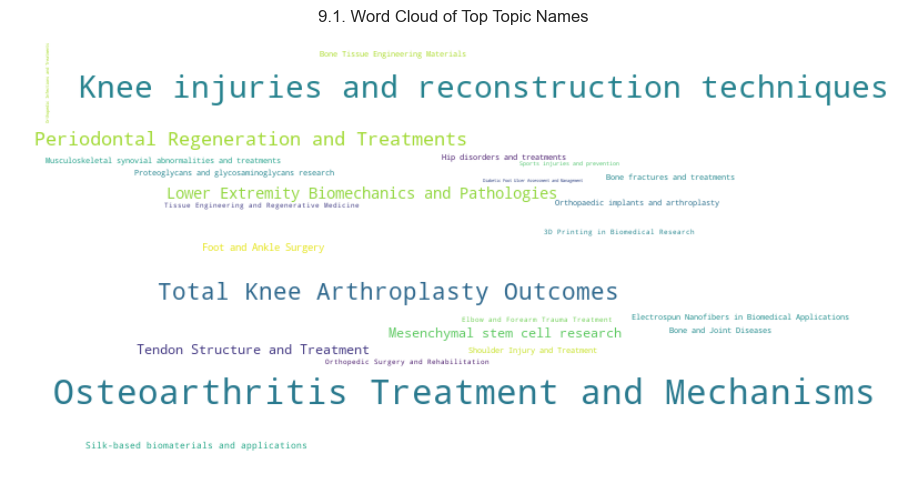

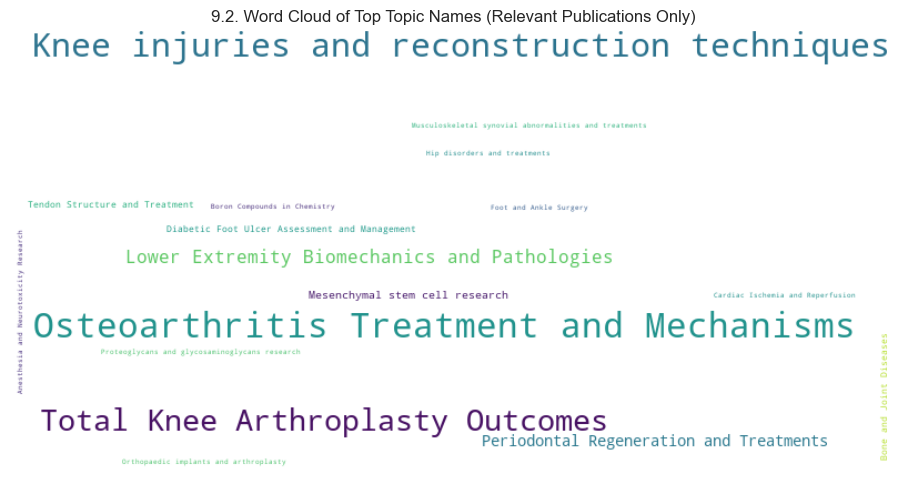

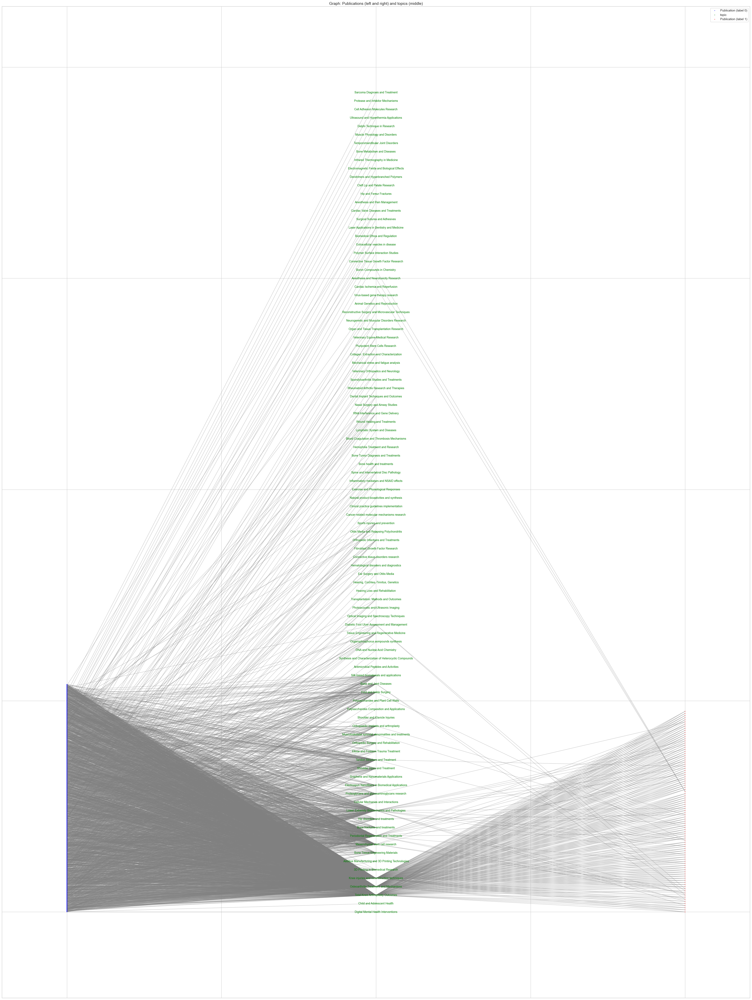

In [5]:
%pip install wordcloud
import seaborn as sns
# Set Seaborn theme for a clean, publication-ready style
sns.set_theme(style="whitegrid")
import os
import pandas as pd
import networkx as nx
import community.community_louvain as community  # pip install python-louvain
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

# Optional: for word cloud visualization (pip install wordcloud)
from wordcloud import WordCloud

# ----------------------------
# Setup: Load Data and Graph
# ----------------------------
# Construct the processed folder path dynamically
processed_folder_path = os.path.join(os.getcwd(),"..", "data", "pre_processed")
csv_file = os.path.join(processed_folder_path, "temp.csv")

# Load dataset
df = pd.read_csv(csv_file)
print("Database loaded from:", csv_file)

# ----------------------------
# Build Graph from Publications and Topics
# ----------------------------
G = nx.Graph()
publication_nodes = set()
topic_nodes = set()

# Build graph using the 'openalex_topics' field (each is a list of topic dicts)
for idx, row in df.iterrows():
    pub_id = row["id"]
    G.add_node(pub_id,
               type="publication",
               label_included=row.get("label_included"),
               title=row.get("title_clean"),
               abstract=row.get("abstract_clean"),
               year=row.get("publication_year"))
    publication_nodes.add(pub_id)
    
    # Parse topics (use eval if stored as string)
    raw_topics = row.get("openalex_topics", "[]")
    if isinstance(raw_topics, str):
        try:
            topics = eval(raw_topics)
        except Exception as e:
            print(f"Error evaluating topics for publication {pub_id}: {e}")
            topics = []
    elif isinstance(raw_topics, list):
        topics = raw_topics
    else:
        topics = []
    
    # Add topic nodes and connect with an edge (weight = topic score)
    for topic in topics:
        topic_id_full = topic.get("id", "")
        if topic_id_full:
            topic_id = topic_id_full.rstrip("/").split("/")[-1]  # e.g., "T10105"
        else:
            continue
        topic_name = topic.get("display_name", "unknown")
        topic_score = topic.get("score", 1.0)
        if topic_id not in topic_nodes:
            G.add_node(topic_id,
                       type="topic",
                       name=topic_name,
                       score=topic_score,
                       subfield=topic.get("subfield", {}),
                       field=topic.get("field", {}),
                       domain=topic.get("domain", {}))
            topic_nodes.add(topic_id)
        G.add_edge(pub_id, topic_id, weight=float(topic_score), relationship="has_topic")

print(f"Graph built with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")
print(f"Publication nodes: {len(publication_nodes)}, topic nodes: {len(topic_nodes)}")

# Compute basic metrics for later use
degree_centrality = nx.degree_centrality(G)
# Compute Louvain partition for community detection
partition = community.best_partition(G)
num_communities = len(set(partition.values()))
print(f"Detected {num_communities} communities")

# ----------------------------
# 10 Visualizations
# ----------------------------

# Visualization 1: Histogram of Publication Degree Distributions (Relevant vs. Non-Relevant)
relevant_degrees = []
non_relevant_degrees = []
for n, attr in G.nodes(data=True):
    if attr.get("type") == "publication":
        d = G.degree(n)
        if attr.get("label_included") == 1:
            relevant_degrees.append(d)
        else:
            non_relevant_degrees.append(d)
plt.figure(figsize=(8, 6))
plt.hist(relevant_degrees, bins=20, alpha=0.6, label='Relevant (label==1)', color='skyblue')
plt.hist(non_relevant_degrees, bins=20, alpha=0.6, label='Non-Relevant', color='salmon')
plt.xlabel("Number of Topic Connections (Degree)")
plt.ylabel("Number of Publications")
plt.title("1. Degree Distribution: Relevant vs. Non-Relevant Publications")
plt.legend()
plt.tight_layout()

# ----------------------------
# Visualization 2: Bar Chart of Top 10 Topics by Degree Centrality (Topics Only)
# ----------------------------
topic_centrality = {n: c for n, c in degree_centrality.items() if G.nodes[n]['type'] == 'topic'}
top_topics = sorted(topic_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
# Convert to DataFrame for Seaborn
top_topics_df = pd.DataFrame(top_topics, columns=["topic", "centrality"])
plt.figure(figsize=(8, 6))
sns.barplot(data=top_topics_df, x="topic", y="centrality", palette="viridis")
plt.xlabel("Topic ID")
plt.ylabel("Degree Centrality")
plt.title("2. Top 10 Topics by Degree Centrality")
plt.tight_layout()

# Visualization 3: Spring Layout Visualization of Entire Graph
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(G, k=0.15, seed=42)
# Color nodes by type: publications in blue, topics in green
node_shapes = {'publication': 'o', 'topic': 'o'}
node_colors = []
node_shapes_list = []
for n in G.nodes():
    if G.nodes[n]['type'] == 'publication':
        if G.nodes[n].get('label_included') == 1:
            node_colors.append('red')  # Relevant publications in red
            node_shapes_list.append('^')  # Triangle for relevant publications
        else:
            node_colors.append('skyblue')  # Non-relevant publications in blue
            node_shapes_list.append('o')  # Circle for non-relevant publications
    else:
        node_colors.append('lightgreen')  # Topics in green
        node_shapes_list.append('o')  # Circle for topics

# Draw nodes with different shapes
for shape in set(node_shapes_list):
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=[n for n, s in zip(G.nodes(), node_shapes_list) if s == shape],
        node_color=[c for c, s in zip(node_colors, node_shapes_list) if s == shape],
        node_shape=shape,
        node_size=20
    )

nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.6)
plt.title("3. Entire Graph (Spring Layout)")
plt.legend(['Relevant Publications', 'Non-Relevant Publications', 'Topics'], loc='best')
plt.tight_layout()

# Visualization 4: Community Detection Visualization (Colored by Louvain Partition)
plt.figure(figsize=(12, 10))
# Use the same spring layout from before
community_colors = [partition.get(n) for n in G.nodes()]
nx.draw_networkx_nodes(G, pos, node_color=community_colors, cmap=plt.cm.tab20, node_size=20)
nx.draw_networkx_edges(G, pos, alpha=0.4)
plt.title("4. Graph with Louvain Community Coloring")
# Add legend for communities
unique_communities = set(partition.values())
for community_id in unique_communities:
    plt.scatter([], [], color=plt.cm.tab20(community_id / len(unique_communities)), label=f'Community {community_id}')
plt.legend(loc='best', title="Communities")
plt.tight_layout()

# Visualization 5: Pie Chart of Node Type Distribution
pub_count = sum(1 for n, d in G.nodes(data=True) if d['type'] == 'publication')
topic_count = sum(1 for n, d in G.nodes(data=True) if d['type'] == 'topic')
plt.figure(figsize=(6, 6))
plt.pie([pub_count, topic_count], labels=['Publications', 'Topics'], autopct='%1.1f%%', colors=['skyblue', 'lightgreen'])
plt.title("5. Node Type Distribution")
plt.tight_layout()

# Visualization 6: Scatter Plot of Publication Year vs. Degree (Topic Connections)
pub_years = []
pub_degrees = []
for n, attr in G.nodes(data=True):
    if attr.get("type") == "publication" and attr.get("year"):
        pub_years.append(int(attr.get("year")))
        pub_degrees.append(G.degree(n))
plt.figure(figsize=(8, 6))
plt.scatter(pub_years, pub_degrees, alpha=0.6, color='coral')
plt.xlabel("Publication Year")
plt.ylabel("Number of Topic Connections (Degree)")
plt.title("6. Publication Year vs. Topic Connections")
plt.tight_layout()

# Visualization 7: Box Plot of Degree Distribution for Publications
plt.figure(figsize=(6, 6))
plt.boxplot([relevant_degrees, non_relevant_degrees], labels=['Relevant', 'Non-Relevant'])
plt.ylabel("Number of Topic Connections (Degree)")
plt.title("7. Box Plot of Publication Degree Distribution")
plt.tight_layout()

# Visualization 8: Heatmap of a Subgraph's Adjacency Matrix (Top 50 Nodes by Degree)
# Get the top 50 nodes (by degree) for a smaller subgraph
top_nodes = sorted(G.nodes(), key=lambda n: G.degree(n), reverse=True)[:50]
subG = G.subgraph(top_nodes)
adj_matrix = nx.to_numpy_array(subG)

# Create labels for the heatmap
labels = list(subG.nodes())

plt.figure(figsize=(10, 8))
plt.imshow(adj_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.xticks(ticks=np.arange(len(labels)), labels=labels, rotation=90, fontsize=6)
plt.yticks(ticks=np.arange(len(labels)), labels=labels, fontsize=6)
plt.title("8. Heatmap of Adjacency Matrix for Top 50 Nodes")
plt.tight_layout()

# Visualization 9: Word Cloud of Top Topic Names in the Entire Graph
# Aggregate topic names weighted by their degree centrality
topic_name_weights = {}
for n, d in G.nodes(data=True):
    if d.get("type") == "topic":
        weight = degree_centrality.get(n, 0)
        name = d.get("name", "")
        if name:
            topic_name_weights[name] = topic_name_weights.get(name, 0) + weight

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_name_weights)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("9.1. Word Cloud of Top Topic Names")
plt.tight_layout()

###
# Filter relevant publication nodes (label_included == 1)
relevant_pub_ids = [n for n, d in G.nodes(data=True) 
                    if d.get("type") == "publication" and d.get("label_included") == 1]

# Build a subgraph that includes relevant publications and their neighboring topics
nodes_of_interest = set(relevant_pub_ids)
for pub in relevant_pub_ids:
    nodes_of_interest.update(G.neighbors(pub))
G_relevant = G.subgraph(nodes_of_interest)

# Compute degree centrality for the subgraph
degree_centrality_relevant = nx.degree_centrality(G_relevant)

# Aggregate topic names weighted by their degree centrality in the relevant subgraph
topic_name_weights = {}
for n, d in G_relevant.nodes(data=True):
    if d.get("type") == "topic":
        weight = degree_centrality_relevant.get(n, 0)
        name = d.get("name", "")
        if name:
            topic_name_weights[name] = topic_name_weights.get(name, 0) + weight

# Generate and display the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(topic_name_weights)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("9.2. Word Cloud of Top Topic Names (Relevant Publications Only)")
plt.tight_layout()
plt.show()

###

# Visualization 10: Custom Layered Graph Visualization
## Publications with label 0 on the left, topics in the middle, and publications with label 1 on the right.
#pub_nodes_0 = [n for n, d in G.nodes(data=True) if d["type"] == "publication" and d.get("label_included", 0) == 0]
#pub_nodes_1 = [n for n, d in G.nodes(data=True) if d["type"] == "publication" and d.get("label_included", 0) == 1]
## We'll use a simple layered layout: left for label 0, middle for topics, right for label 1.
#pos_layered = {}
#for i, n in enumerate(pub_nodes_0):
#    pos_layered[n] = (-1, i)
#spacing = 20
#for i, n in enumerate(topic_nodes):
#    pos_layered[n] = (0, i * spacing)
#for i, n in enumerate(pub_nodes_1):
#    pos_layered[n] = (1, i)
## Filter edges connecting publications and topics
#edges_layered = [(u, v) for u, v in G.edges() if (u in pub_nodes_0 or u in pub_nodes_1) and v in topic_nodes or (v in pub_nodes_0 or v in pub_nodes_1) and u in topic_nodes]
#
#plt.figure(figsize=(14, 10))
#nx.draw_networkx_nodes(G, pos_layered, nodelist=pub_nodes_0, node_color='blue', node_size=10, label='Publications (label 0)')
#nx.draw_networkx_nodes(G, pos_layered, nodelist=topic_nodes, node_color='green', node_size=10, label='Topics')
#nx.draw_networkx_nodes(G, pos_layered, nodelist=pub_nodes_1, node_color='red', node_size=10, label='Publications (label 1)')
#nx.draw_networkx_edges(G, pos_layered, edgelist=edges_layered, alpha=0.5, edge_color='gray')
#plt.title("10. Custom Layered Graph Visualization")
#plt.legend(scatterpoints=1)
#plt.axis("off")
#plt.tight_layout()
## Show all figures
#plt.show()
########

# Separate nodes by type
pub_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "publication"]
topic_nodes = [n for n, d in G.nodes(data=True) if d["type"] == "topic"] #xxx Change for the lvl

# Separate publication nodes by label
pub_nodes_0 = [n for n in pub_nodes if G.nodes[n].get("label_included", 0) == 0]
pub_nodes_1 = [n for n in pub_nodes if G.nodes[n].get("label_included", 0) == 1]

# Color publication nodes based on their label_included:
# red for relevant (1), blue for irrelevant (0)
pub_colors_0 = ["blue"] * len(pub_nodes_0)
pub_colors_1 = ["red"] * len(pub_nodes_1)

# Color topic nodes in green
topic_colors = ["green"] * len(topic_nodes)

# Create a custom layout
pos = {}
# Position publication nodes with label 0 on the left (default spacing)
for i, node in enumerate(pub_nodes_0):
    pos[node] = (-1, i)

# Increase vertical spacing for the middle layer (topic nodes)
spacing_factor_middle = 40  # Adjust this factor for more or less space
for i, node in enumerate(topic_nodes):
    pos[node] = (0, i * spacing_factor_middle)

# Increase vertical spacing for the right layer (publication nodes with label 1)
spacing_factor_right = 10  # Adjust this factor for more or less space
for i, node in enumerate(pub_nodes_1):
    pos[node] = (1, i * spacing_factor_right)

# Filter edges that connect publications to topics
filtered_edges = [
    (u, v) 
    for u, v in G.edges() 
    if (u in pub_nodes and v in topic_nodes) or (v in pub_nodes and u in topic_nodes)
]

# Plotting the custom graph with only the filtered edges
plt.figure(figsize=(48, 64))

# Draw publication nodes with label 0 (left layer)
nx.draw_networkx_nodes(G, pos, nodelist=pub_nodes_0, node_color=pub_colors_0, 
                       node_size=1, label="Publication (label 0)")

# Draw topic nodes (middle layer)
nx.draw_networkx_nodes(G, pos, nodelist=topic_nodes, node_color=topic_colors, 
                       node_size=1, label="topic")

# Draw publication nodes with label 1 (right layer)
nx.draw_networkx_nodes(G, pos, nodelist=pub_nodes_1, node_color=pub_colors_1, 
                       node_size=1, label="Publication (label 1)")

# Draw only the edges connecting publications topics
nx.draw_networkx_edges(G, pos, edgelist=filtered_edges, alpha=0.5, edge_color="gray")

# Draw labels for topic nodes only
topic_labels = {n: G.nodes[n]['name'] for n in topic_nodes}
nx.draw_networkx_labels(G, pos, labels=topic_labels, font_size=10, font_color="green")
plt.title(f"Graph: Publications (left and right) and topics (middle)", fontsize=14)

plt.axis("on")
plt.legend(scatterpoints=1)
plt.show()




### 2.5.4 topic vs concept

C:\Users\vares\AppData\Local\Temp\ipykernel_20152\3437239196.py:60: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axs[1].boxplot([concept_degrees, topic_degrees], labels=['Concept Graph', 'Topic Graph'], patch_artist=True,


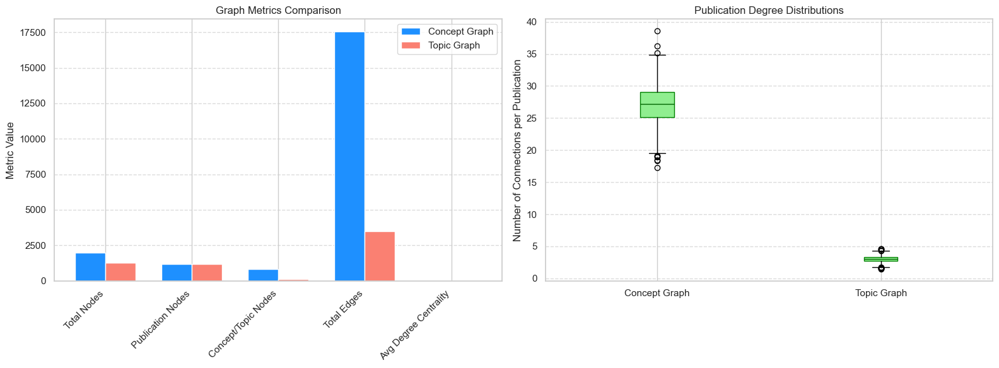

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------
# 1. Define the Network Metrics
# ----------------------------
# These metrics are taken from your analysis.
# For the concept-based graph:
concept_total_nodes = 1979
concept_pub_nodes = 1175
concept_concept_nodes = 804
concept_total_edges = 17550
concept_avg_deg_cent = 0.0090

# For the topic-based graph:
topic_total_nodes = 1273
topic_pub_nodes = 1175
topic_topic_nodes = 98
topic_total_edges = 3495
topic_avg_deg_cent = 0.0043

# Create lists for side-by-side comparison:
metric_labels = ["Total Nodes", "Publication Nodes", "Concept/Topic Nodes", "Total Edges", "Avg Degree Centrality"]
concept_values = [concept_total_nodes, concept_pub_nodes, concept_concept_nodes, concept_total_edges, concept_avg_deg_cent]
topic_values   = [topic_total_nodes, topic_pub_nodes, topic_topic_nodes, topic_total_edges, topic_avg_deg_cent]

# ----------------------------
# 2. Simulate Degree Distributions for Publications
# ----------------------------
# For demonstration, we simulate degree distributions.
# (In your analysis, publications in the concept graph have much higher connection counts 
# due to granular concepts than those in the topic graph.)
# Here, we assume:
# - Concept graph: degrees around 25-30 (you mentioned top papers with 27–29 connections)
# - Topic graph: degrees around 3 (as per your analysis)
np.random.seed(42)  # For reproducibility
concept_degrees = np.random.normal(loc=27, scale=3, size=concept_pub_nodes)
topic_degrees   = np.random.normal(loc=3,  scale=0.5, size=topic_pub_nodes)

# ----------------------------
# 3. Create Visualizations
# ----------------------------
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

# --- Plot A: Bar Chart of Network Metrics ---
x = np.arange(len(metric_labels))
width = 0.35

axs[0].bar(x - width/2, concept_values, width, label='Concept Graph', color='dodgerblue')
axs[0].bar(x + width/2, topic_values, width, label='Topic Graph', color='salmon')
axs[0].set_ylabel("Metric Value")
axs[0].set_title("Graph Metrics Comparison")
axs[0].set_xticks(x)
axs[0].set_xticklabels(metric_labels, rotation=45, ha="right")
axs[0].legend()
axs[0].grid(axis='y', linestyle='--', alpha=0.7)

# --- Plot B: Boxplot of Publication Degree Distributions ---
axs[1].boxplot([concept_degrees, topic_degrees], labels=['Concept Graph', 'Topic Graph'], patch_artist=True,
                boxprops=dict(facecolor='lightgreen', color='green'),
                medianprops=dict(color='darkgreen'))
axs[1].set_ylabel("Number of Connections per Publication")
axs[1].set_title("Publication Degree Distributions")
axs[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


# 3. Mother Graph:

### 3.1. Graph

In [25]:
# src/graph_builder.py
import pandas as pd
import networkx as nx
import ast
from collections import defaultdict


def parse_str_to_list(val):
    if isinstance(val, str):
        try:
            return ast.literal_eval(val)
        except:
            return []
    elif isinstance(val, list):
        return val
    return []


def calculate_coauthor_weights(df):
    coauthor_counts = defaultdict(int)
    for authorships in df["authorships"]:
        author_ids = [auth["author"].get("id") for auth in authorships if auth.get("author") and auth["author"].get("id")]
        for i in range(len(author_ids)):
            for j in range(i + 1, len(author_ids)):
                pair = tuple(sorted((author_ids[i], author_ids[j])))
                coauthor_counts[pair] += 1
    return coauthor_counts


def build_graph(df: pd.DataFrame, include_edges: dict):
    df["authorships"] = df["authorships"].apply(parse_str_to_list)
    df["openalex_topics"] = df["openalex_topics"].apply(parse_str_to_list)

    G = nx.Graph()
    all_paper_ids = set(df["id"])

    coauthor_weights = calculate_coauthor_weights(df) if include_edges.get("coauthor", False) else {}

    for _, row in df.iterrows():
        paper_id = row["id"]

        G.add_node(
            paper_id,
            node_type="paper",
            title=row.get("title_clean", ""),
            abstract=row.get("abstract_clean", "N/A"),
            year=row.get("year", 0),
            label_included=row.get("label_included", 0)
        )

        if include_edges.get("citation", False):
            ref_works_str = row.get("referenced_works")
            try:
                ref_list = ast.literal_eval(ref_works_str) if pd.notna(ref_works_str) else []
                for ref_id in ref_list:
                    if ref_id in all_paper_ids:
                        G.add_edge(paper_id, ref_id, edge_type="citation", weight=0.5)
            except:
                pass

        if include_edges.get("author", False):
            authorships = row["authorships"]
            author_ids = []
            for auth in authorships:
                author = auth.get("author", {})
                author_id = author.get("id")
                if not author_id:
                    continue

                G.add_node(author_id, node_type="author", name=author.get("display_name", ""), orcid=author.get("orcid", ""))
                G.add_edge(paper_id, author_id, edge_type="paper_author", weight=1.0)
                author_ids.append(author_id)

                if include_edges.get("institution", False):
                    for inst in auth.get("institutions", []):
                        inst_id = inst.get("id")
                        if not inst_id:
                            continue
                        G.add_node(inst_id, node_type="institution", name=inst.get("display_name", ""), country=inst.get("country_code", ""))
                        G.add_edge(author_id, inst_id, edge_type="author_institution", weight=0.5)

            if include_edges.get("coauthor", False):
                for i in range(len(author_ids)):
                    for j in range(i + 1, len(author_ids)):
                        pair = tuple(sorted((author_ids[i], author_ids[j])))
                        G.add_edge(author_ids[i], author_ids[j], edge_type="coauthor", weight=coauthor_weights[pair])

        if include_edges.get("topic", False):
            topics = row["openalex_topics"]
            for topic in topics:
                topic_id = topic.get("id")
                if not topic_id:
                    continue
                G.add_node(
                    topic_id,
                    node_type="topic",
                    name=topic.get("display_name", ""),
                    score=topic.get("score", 0.0),
                    subfield=topic.get("subfield", {}),
                    field=topic.get("field", {}),
                    domain=topic.get("domain", {})
                )
                G.add_edge(paper_id, topic_id, edge_type="paper_topic", weight=float(topic.get("score", 0.0)))

    print(f"Graph constructed with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")
    node_types = nx.get_node_attributes(G, 'node_type')
    for node_type in set(node_types.values()):
        nodes_of_type = [node for node, ntype in node_types.items() if ntype == node_type]
        print(f"{node_type.capitalize()} Nodes ({len(nodes_of_type)}): {nodes_of_type[:5]} ...")
    
    edge_types = nx.get_edge_attributes(G, 'edge_type')
    type_counts = {}
    for _, _, etype in G.edges(data='edge_type'):
        type_counts[etype] = type_counts.get(etype, 0) + 1
    for etype, count in type_counts.items():
        print(f"Edge type '{etype}': {count} edges")    

    
    return G

In [26]:
processed_folder_path = os.path.join(os.getcwd(), "..", "data", "pre_processed")
csv_file = os.path.join(processed_folder_path, "temp.csv")
df = pd.read_csv(csv_file)
include_edges = {
    "citation": True,
    "author": True,
    "institution": True,
    "topic": True,
    "coauthor": True,
}
G = build_graph(df, include_edges)




Graph constructed with 7869 nodes and 49530 edges.
Topic Nodes (98): ['https://openalex.org/T11519', 'https://openalex.org/T13883', 'https://openalex.org/T10562', 'https://openalex.org/T10105', 'https://openalex.org/T10442'] ...
Paper Nodes (1175): ['https://openalex.org/W3007172259', 'https://openalex.org/W2088256967', 'https://openalex.org/W1983085571', 'https://openalex.org/W1997362118', 'https://openalex.org/W2083667175'] ...
Author Nodes (5496): ['https://openalex.org/A2953650918', 'https://openalex.org/A2145634323', 'https://openalex.org/A2119344267', 'https://openalex.org/A2556555333', 'https://openalex.org/A2103159261'] ...
Institution Nodes (1100): ['https://openalex.org/I76903346', 'https://openalex.org/I2802542264', 'https://openalex.org/I141596103', 'https://openalex.org/I47652572', 'https://openalex.org/I58028834'] ...
Edge type 'paper_author': 7276 edges
Edge type 'paper_topic': 3495 edges
Edge type 'coauthor': 27191 edges
Edge type 'author_institution': 4923 edges
Edge t

### 3.2. Validate & Clean the Graph

In [11]:
import networkx as nx

def validate_and_clean_graph(G: nx.Graph):
    """
    Validate a graph's nodes/edges and fix or remove some issues:
      1) Ensure all nodes have node_type
      2) Check for required attributes by node_type
      3) Remove isolated nodes (optional)
      4) Check and/or remove self-loops
      5) Check for multi-edges if it's a MultiGraph
    Returns a list of validation messages.
    """
    messages = []
    
    # 1. Ensure every node has a 'node_type'
    bad_nodes = []
    for node, attrs in G.nodes(data=True):
        node_type = attrs.get("node_type")
        if node_type is None:
            bad_nodes.append(node)
    if bad_nodes:
        messages.append(f"Found {len(bad_nodes)} node(s) with no 'node_type': {bad_nodes}")
        # Optionally remove these or set a default node_type
        for bn in bad_nodes:
            # Example: set them to "unknown" or remove them
            G.nodes[bn]["node_type"] = "unknown"

    # 2. Check required attributes by node_type
    #    For example, paper nodes might require 'title', 'abstract', 'year'
    #    author nodes might require 'name', etc.

    # We define a dict of {node_type: [required attributes]}
    required_attrs_map = {
        "paper": ["title", "abstract", "year"],
        "author": ["name"],
        "institution": ["name"],
        "topic": ["name", "score"]
    }

    missing_attr_nodes = []
    for node, attrs in G.nodes(data=True):
        ntype = attrs.get("node_type")
        if ntype in required_attrs_map:
            required_attrs = required_attrs_map[ntype]
            for req_attr in required_attrs:
                if req_attr not in attrs or attrs[req_attr] in (None, ""):
                    missing_attr_nodes.append((node, ntype, req_attr))

    if missing_attr_nodes:
        msg = f"{len(missing_attr_nodes)} node(s) missing required attributes:\n"
        for node_info in missing_attr_nodes[:10]:  # show first 10
            msg += f"  - Node {node_info[0]} (type={node_info[1]}) missing '{node_info[2]}'\n"
        messages.append(msg)
        # Optionally fill defaults or remove them. For instance:
        # for (n, t, attr) in missing_attr_nodes:
        #     G.nodes[n][attr] = "N/A"

    # 3. Remove isolated nodes if desired
    #    (nodes with no edges—can happen if data is incomplete or references are missing).
    isolated = list(nx.isolates(G))
    if isolated:
        messages.append(f"Found {len(isolated)} isolated node(s). Removing them...")
        G.remove_nodes_from(isolated)

    # 4. Check self-loops (where node has an edge to itself)
    loops = list(nx.selfloop_edges(G))
    if loops:
        messages.append(f"Found {len(loops)} self-loop edge(s). Removing them...")
        G.remove_edges_from(loops)

    # 5. If the graph is a MultiGraph, check for multiple edges between the same nodes
    if isinstance(G, nx.MultiGraph):
        multi_edges = []
        for u, v in G.edges():
            if len(G[u][v]) > 1:  # multiple edges between u and v
                multi_edges.append((u, v, len(G[u][v])))
        if multi_edges:
            messages.append(
                f"Found edges with multiplicity: " +
                ", ".join([f"{uv} x {count}" for uv, _, count in multi_edges[:10]])
            )
            # Optionally remove duplicates or merge them

    return messages

# Example usage:
# Suppose G is already created:
# G = nx.Graph(...) or G = some_function_that_creates_graph()

validation_messages = validate_and_clean_graph(G)

print("Validation & Cleaning Report:")
if validation_messages:
    for m in validation_messages:
        print("- ", m)
else:
    print("No issues found! Graph looks good.")


# Print all nodes grouped by their types
node_types = nx.get_node_attributes(G, 'node_type')
for node_type in set(node_types.values()):
    nodes_of_type = [node for node, ntype in node_types.items() if ntype == node_type]
    print(f"{node_type.capitalize()} Nodes ({len(nodes_of_type)}): {nodes_of_type}")


Validation & Cleaning Report:
-  Found 2 self-loop edge(s). Removing them...
Institution Nodes (1100): ['https://openalex.org/I76903346', 'https://openalex.org/I2802542264', 'https://openalex.org/I141596103', 'https://openalex.org/I47652572', 'https://openalex.org/I58028834', 'https://openalex.org/I59361560', 'https://openalex.org/I83558840', 'https://openalex.org/I56125125', 'https://openalex.org/I182534213', 'https://openalex.org/I112197944', 'https://openalex.org/I155381812', 'https://openalex.org/I157071867', 'https://openalex.org/I80606768', 'https://openalex.org/I146165071', 'https://openalex.org/I56243300', 'https://openalex.org/I101100930', 'https://openalex.org/I82951845', 'https://openalex.org/I119635470', 'https://openalex.org/I130442723', 'https://openalex.org/I4210150261', 'https://openalex.org/I165932596', 'https://openalex.org/I165799507', 'https://openalex.org/I196699116', 'https://openalex.org/I3018483916', 'https://openalex.org/I205401836', 'https://openalex.org/I4210

### 3.3. Graph Analysis

This is usefull to implement in the app.

In [5]:
import networkx as nx
import numpy as np
from collections import Counter

def perform_graph_analysis(G: nx.Graph):
    """
    A comprehensive 10-step guide to analyze a graph in NetworkX.
    Assumes G is already validated & cleaned, and node_type attributes exist.
    """

    print("=== PERFORMING GRAPH ANALYSIS ===")

    # 1. BASIC GRAPH STATISTICS
    print("\n1) BASIC GRAPH STATISTICS")
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()
    print(f"   - Total nodes: {num_nodes}")
    print(f"   - Total edges: {num_edges}")

    # Optional: Count node types
    node_type_counts = Counter(nx.get_node_attributes(G, "node_type").values())
    print("   - Node types:", dict(node_type_counts))

    # 2. CONNECTIVITY / COMPONENT ANALYSIS
    #    For an undirected graph: find connected components
    #    For a directed graph (DiGraph), use strongly/weakly connected components
    print("\n2) CONNECTIVITY / COMPONENT ANALYSIS")
    if isinstance(G, nx.DiGraph):
        # E.g., for a directed graph
        comps = list(nx.weakly_connected_components(G))
        print(f"   - Found {len(comps)} weakly connected components.")
    else:
        comps = list(nx.connected_components(G))
        print(f"   - Found {len(comps)} connected components.")

    # 3. DEGREE DISTRIBUTION
    print("\n3) DEGREE DISTRIBUTION")
    degrees = [deg for (node, deg) in G.degree()]
    max_degree = max(degrees) if degrees else 0
    avg_degree = np.mean(degrees) if degrees else 0
    print(f"   - Average degree: {avg_degree:.2f}")
    print(f"   - Max degree: {max_degree}")
    # If you want a histogram, you could do:
    degree_counts = Counter(degrees)
    print(f"   - Degree distribution (degree -> count): {dict(degree_counts.most_common(10))}")

    # 4. CENTRALITY MEASURES (DEGREE, BETWEENNESS, PAGERANK, ETC.)
    #    a) Degree Centrality
    print("\n4a) DEGREE CENTRALITY (top 5 nodes)")
    deg_centrality = nx.degree_centrality(G)
    top_deg = sorted(deg_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
    for node, val in top_deg:
        print(f"      Node: {node}, Degree Centrality: {val:.4f}")

    #    b) Betweenness Centrality
    print("\n4b) BETWEENNESS CENTRALITY (top 5 nodes)")
    bet_centrality = nx.betweenness_centrality(G)
    top_bet = sorted(bet_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
    for node, val in top_bet:
        print(f"      Node: {node}, Betweenness: {val:.4f}")

    #    c) PageRank (for either directed or undirected graph)
    #    For large graphs, consider personalization or alpha adjustments
    print("\n4c) PageRank (top 5 nodes)")
    if isinstance(G, nx.DiGraph):
        page_rank = nx.pagerank(G, alpha=0.85)
    else:
        # Convert to DiGraph or use "nx.pagerank(G.to_directed())" 
        # or just run pagerank on undirected. 
        # Internally, it treats undirected edges as two directed edges.
        page_rank = nx.pagerank(G, alpha=0.85)
    top_pr = sorted(page_rank.items(), key=lambda x: x[1], reverse=True)[:5]
    for node, val in top_pr:
        print(f"      Node: {node}, PageRank: {val:.4f}")

    # 5. CLUSTERING COEFFICIENTS
    #    This is more typical for undirected graphs. 
    #    For directed, consider nx.clustering(G.to_undirected()) or specialized metrics
    print("\n5) CLUSTERING COEFFICIENTS")
    if not isinstance(G, nx.DiGraph):
        avg_cluster_coeff = nx.average_clustering(G)
        print(f"   - Average Clustering Coefficient: {avg_cluster_coeff:.4f}")
    else:
        print("   - Graph is directed; skipping undirected clustering coefficient.")

    # 6. SHORTEST PATH STATS (E.G., AVERAGE SHORTEST PATH LENGTH)
    #    Only for a single connected component or a not-too-large graph
    print("\n6) SHORTEST PATH LENGTH STATS (on largest connected component)")
    if not isinstance(G, nx.DiGraph):
        # Identify largest connected component
        largest_cc = max(nx.connected_components(G), key=len) if len(comps) > 0 else set()
        subG = G.subgraph(largest_cc)
        if len(subG) > 1:
            try:
                avg_spl = nx.average_shortest_path_length(subG)
                print(f"   - Average Shortest Path Length (largest CC): {avg_spl:.4f}")
            except nx.NetworkXError as e:
                print(f"   - Unable to compute shortest paths: {e}")
        else:
            print("   - Largest connected component is too small to compute.")
    else:
        print("   - For directed graphs, consider strongly/weakly connected subgraphs or skip.")

    # 7. COMMUNITY DETECTION (OPTIONAL)
    #    NetworkX by default does not have built-in community detection for large graphs.
    #    We can use a simple greedy modularity approach for demonstration if graph is undirected.
    print("\n7) COMMUNITY DETECTION (Greedy Modularity)")
    if not isinstance(G, nx.DiGraph):
        try:
            from networkx.algorithms.community import greedy_modularity_communities
            communities = greedy_modularity_communities(G)
            print(f"   - Found {len(communities)} communities using Greedy Modularity.")
            # Show size of each community
            comm_sizes = [len(c) for c in communities]
            print("   - Community sizes (top 5):", sorted(comm_sizes, reverse=True)[:5])
        except ImportError:
            print("   - Please install networkx>=2.2 for greedy_modularity_communities or skip.")
    else:
        print("   - Graph is directed; skipping modularity-based community detection.")

    # 8. ASSORTATIVITY (E.G., NODE DEGREE CORRELATION)
    print("\n8) ASSORTATIVITY (Degree-Degree Correlation)")
    if not isinstance(G, nx.DiGraph):
        assort_coeff = nx.degree_assortativity_coefficient(G)
        print(f"   - Degree Assortativity Coefficient: {assort_coeff:.4f}")
    else:
        print("   - Skipping for directed graph (can use nx.degree_pearson_correlation_coefficient).")

    # 9. SUBGRAPH ANALYSIS BY NODE TYPE
    #    For instance, let's quickly see how paper-paper subgraphs or author-author subgraphs look
    #    if we had edges for those. Or just see how many edges connect each node_type pair.
    print("\n9) SUBGRAPH ANALYSIS BY NODE TYPE")
    # We'll count edges by (node_type_A, node_type_B)
    edge_type_count = Counter()
    for u, v in G.edges():
        utype = G.nodes[u].get("node_type")
        vtype = G.nodes[v].get("node_type")
        if utype > vtype:
            # Order them so we don't double-count (paper->author vs author->paper)
            utype, vtype = vtype, utype
        edge_type_count[(utype, vtype)] += 1
    print("   - Edge counts by node_type pair:")
    for (nt1, nt2), cnt in edge_type_count.items():
        print(f"      * {nt1} -- {nt2}: {cnt} edges")

    # 10. PRINT OUT TOP NODES BY ANY METRIC OF INTEREST (E.G., PAGE RANK, LABEL, ETC.)
    print("\n10) FINAL SUMMARY: TOP 'FEATURED' NODES")
    # Example: top 5 'paper' nodes by PageRank
    paper_nodes = [(n, page_rank[n]) for n in G.nodes if G.nodes[n].get("node_type") == "paper"]
    paper_nodes_sorted = sorted(paper_nodes, key=lambda x: x[1], reverse=True)[:5]
    print("   - Top 5 Paper Nodes by PageRank:")
    for node_id, rank_val in paper_nodes_sorted:
        title = G.nodes[node_id].get("title", "N/A")
        print(f"      Node: {node_id}, PageRank: {rank_val:.4f}, Title: {title}")

    print("\n=== GRAPH ANALYSIS COMPLETE ===")


perform_graph_analysis(G)


=== PERFORMING GRAPH ANALYSIS ===

1) BASIC GRAPH STATISTICS
   - Total nodes: 7869
   - Total edges: 22339
   - Node types: {'paper': 1175, 'author': 5496, 'institution': 1100, 'topic': 98}

2) CONNECTIVITY / COMPONENT ANALYSIS
   - Found 2 connected components.

3) DEGREE DISTRIBUTION
   - Average degree: 5.68
   - Max degree: 991
   - Degree distribution (degree -> count): {2: 3742, 1: 1478, 3: 595, 4: 307, 5: 195, 6: 110, 7: 99, 10: 84, 13: 81, 12: 80}

4a) DEGREE CENTRALITY (top 5 nodes)
      Node: https://openalex.org/T10105, Degree Centrality: 0.1260
      Node: https://openalex.org/T10442, Degree Centrality: 0.1023
      Node: https://openalex.org/T10562, Degree Centrality: 0.0613
      Node: https://openalex.org/T11570, Degree Centrality: 0.0355
      Node: https://openalex.org/W2223297936, Degree Centrality: 0.0252

4b) BETWEENNESS CENTRALITY (top 5 nodes)
      Node: https://openalex.org/T10105, Betweenness: 0.4914
      Node: https://openalex.org/T10442, Betweenness: 0.238

#### analyze labeled subgraphs 1 vs 0

In [6]:
import networkx as nx
import numpy as np
from collections import Counter
from scipy.stats import ttest_ind

def build_label_subgraph(G, target_label=1):
    """
    Creates a FULL induced subgraph around all papers that have label_included == target_label,
    plus all neighbors of those papers. We keep all edges among these nodes
    (i.e., a true induced subgraph).
    """
    # 1) Identify all paper nodes with the desired label
    paper_nodes_of_label = [
        n for n, attrs in G.nodes(data=True)
        if attrs.get("node_type") == "paper" and attrs.get("label_included") == target_label
    ]

    # If no papers of this label, return an empty graph
    if not paper_nodes_of_label:
        return nx.Graph()

    # 2) Collect neighbors of these labeled papers
    neighbor_set = set()
    for p in paper_nodes_of_label:
        neighbor_set.update(G.neighbors(p))

    # 3) The combined node set
    node_set_sub = set(paper_nodes_of_label).union(neighbor_set)

    # 4) Induced subgraph with *all* edges among those nodes
    G_sub = G.subgraph(node_set_sub).copy()

    return G_sub


def gather_node_metrics(G_sub, max_nodes_for_betweenness=10000):
    """
    Computes local, per-node metrics for each node in the subgraph:
      - degree
      - PageRank
      - betweenness
      - local clustering
      - closeness
    Returns a dict of arrays: {
       'degree': np.array([...]),
       'pagerank': np.array([...]),
       'betweenness': np.array([...]),
       'local_clust': np.array([...]),
       'closeness': np.array([...])
    }
    For large graphs, betweenness/closeness can be slow; we do it if node count < max_nodes_for_betweenness.
    """
    metrics = {}

    # A) Degree (simple)
    degree_dict = dict(G_sub.degree())
    metrics['degree'] = np.array(list(degree_dict.values()), dtype=float)

    # B) PageRank
    if G_sub.number_of_nodes() > 0:
        try:
            pr = nx.pagerank(G_sub, alpha=0.85)
        except:
            pr = {}
    else:
        pr = {}
    metrics['pagerank'] = np.array(list(pr.values()), dtype=float) if pr else np.array([])

    # C) Betweenness
    #    For large subgraphs, consider skipping or approximating
    if G_sub.number_of_nodes() < max_nodes_for_betweenness and G_sub.number_of_nodes() > 0:
        btwn = nx.betweenness_centrality(G_sub)
    else:
        btwn = {}
    metrics['betweenness'] = np.array(list(btwn.values()), dtype=float) if btwn else np.array([])

    # D) Local Clustering
    #    If the graph is directed, consider G_sub.to_undirected() or a specialized approach
    local_clust_dict = nx.clustering(G_sub if not isinstance(G_sub, nx.DiGraph) else G_sub.to_undirected())
    metrics['local_clust'] = np.array(list(local_clust_dict.values()), dtype=float)

    # E) Closeness
    #    Also can be slow for large graphs; we do it if under threshold
    if G_sub.number_of_nodes() < max_nodes_for_betweenness and G_sub.number_of_nodes() > 0:
        closeness_dict = nx.closeness_centrality(G_sub)
    else:
        closeness_dict = {}
    metrics['closeness'] = np.array(list(closeness_dict.values()), dtype=float) if closeness_dict else np.array([])

    return metrics


def ttest_summary(arr1, arr2, alpha=0.05, label1="Group1", label2="Group2"):
    """
    Performs a two-sample t-test on arr1 vs arr2, returning min/max/mean for each,
    plus t-stat, p-val, significance note.
    """
    result = {}
    result["count1"] = len(arr1)
    result["count2"] = len(arr2)

    # If either array is empty, skip
    if len(arr1) == 0 or len(arr2) == 0:
        result["note"] = f"One or both arrays empty. Skipping t-test for {label1} vs. {label2}."
        return result

    result["min1"]  = float(np.min(arr1))
    result["max1"]  = float(np.max(arr1))
    result["mean1"] = float(np.mean(arr1))
    result["min2"]  = float(np.min(arr2))
    result["max2"]  = float(np.max(arr2))
    result["mean2"] = float(np.mean(arr2))

    t_stat, p_val = ttest_ind(arr1, arr2, equal_var=False)  # Welch’s t-test
    result["t_stat"] = float(t_stat)
    result["p_val"]  = float(p_val)
    result["alpha"]  = alpha
    result["significant"] = (p_val < alpha)
    result["note"]   = (f"T-test: {label1} vs {label2}, p={p_val:.4g}, alpha={alpha}, "
                        f"significant={p_val<alpha}")
    return result


def compare_label_subgraphs_with_ttests(G):
    """
    10-step script focusing on T-tests for node-level metrics in the subgraphs
    of label=1 vs label=0.

    Steps:
      1) Build subgraph for label=1 (full induced subgraph)
      2) Build subgraph for label=0
      3) Gather node-level metrics for subgraph label=1
      4) Gather node-level metrics for subgraph label=0
      5) T-test: degree
      6) T-test: pagerank
      7) T-test: betweenness
      8) T-test: local clustering
      9) T-test: closeness
      10) Summaries & next steps
    """
    print("\n=== COMPARING LABEL=1 VS LABEL=0 SUBGRAPHS WITH T-TESTS ===\n")

    # STEP 1: Build label=1 subgraph
    print("1) Building subgraph for label_included=1...")
    G_label1 = build_label_subgraph(G, target_label=1)

    # STEP 2: Build label=0 subgraph
    print("2) Building subgraph for label_included=0...")
    G_label0 = build_label_subgraph(G, target_label=0)

    # STEP 3: Gather node-level metrics for label=1 subgraph
    print("\n3) Gathering node-level metrics (label=1) ...")
    m1 = gather_node_metrics(G_label1)

    # STEP 4: Gather node-level metrics for label=0 subgraph
    print("4) Gathering node-level metrics (label=0) ...")
    m0 = gather_node_metrics(G_label0)

    # Now we run T-tests on each metric distribution:

    # STEP 5: T-test on degree
    print("\n5) T-TEST: DEGREE DISTRIBUTION")
    deg_stats = ttest_summary(m1["degree"], m0["degree"], label1="label=1 deg", label2="label=0 deg")
    _print_stat_summary(deg_stats)

    # STEP 6: T-test on pagerank
    print("\n6) T-TEST: PAGERANK DISTRIBUTION")
    pr_stats = ttest_summary(m1["pagerank"], m0["pagerank"], label1="label=1 PR", label2="label=0 PR")
    _print_stat_summary(pr_stats)

    # STEP 7: T-test on betweenness
    print("\n7) T-TEST: BETWENNESS DISTRIBUTION")
    bt_stats = ttest_summary(m1["betweenness"], m0["betweenness"], label1="label=1 Btw", label2="label=0 Btw")
    _print_stat_summary(bt_stats)

    # STEP 8: T-test on local clustering
    print("\n8) T-TEST: LOCAL CLUSTERING DISTRIBUTION")
    clust_stats = ttest_summary(m1["local_clust"], m0["local_clust"], label1="label=1 cluster", label2="label=0 cluster")
    _print_stat_summary(clust_stats)

    # STEP 9: T-test on closeness
    print("\n9) T-TEST: CLOSENESS DISTRIBUTION")
    close_stats = ttest_summary(m1["closeness"], m0["closeness"], label1="label=1 close", label2="label=0 close")
    _print_stat_summary(close_stats)

def _print_stat_summary(stats_dict):
    """Helper to cleanly print the ttest_summary results."""
    if "note" in stats_dict:
        print("   ", stats_dict["note"])
    if "count1" in stats_dict and "count2" in stats_dict:
        print(f"   count1={stats_dict['count1']}, count2={stats_dict['count2']}")
    if "min1" in stats_dict:
        print(f"   Group1 min={stats_dict['min1']:.4g}, max={stats_dict['max1']:.4g}, mean={stats_dict['mean1']:.4g}")
        print(f"   Group2 min={stats_dict['min2']:.4g}, max={stats_dict['max2']:.4g}, mean={stats_dict['mean2']:.4g}")
    if "t_stat" in stats_dict:
        print(f"   t_stat={stats_dict['t_stat']:.4g}, p_val={stats_dict['p_val']:.4g}, alpha={stats_dict['alpha']}")


compare_label_subgraphs_with_ttests(G)



=== COMPARING LABEL=1 VS LABEL=0 SUBGRAPHS WITH T-TESTS ===

1) Building subgraph for label_included=1...
2) Building subgraph for label_included=0...

3) Gathering node-level metrics (label=1) ...
4) Gathering node-level metrics (label=0) ...

5) T-TEST: DEGREE DISTRIBUTION
    T-test: label=1 deg vs label=0 deg, p=1.726e-17, alpha=0.05, significant=True
   count1=1320, count2=6394
   Group1 min=1, max=676, mean=12.8
   Group2 min=1, max=991, mean=5.325
   t_stat=8.612, p_val=1.726e-17, alpha=0.05

6) T-TEST: PAGERANK DISTRIBUTION
    T-test: label=1 PR vs label=0 PR, p=9.547e-44, alpha=0.05, significant=True
   count1=1320, count2=6394
   Group1 min=0.0001515, max=0.03398, mean=0.0007576
   Group2 min=3.821e-05, max=0.02315, mean=0.0001564
   t_stat=14.37, p_val=9.547e-44, alpha=0.05

7) T-TEST: BETWENNESS DISTRIBUTION
    T-test: label=1 Btw vs label=0 Btw, p=0.008184, alpha=0.05, significant=True
   count1=1320, count2=6394
   Group1 min=0, max=0.3976, mean=0.001425
   Group2 min=

### 3.4. Active Search Algo

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.semi_supervised import LabelSpreading
from typing import List, Tuple, Literal

KernelType = Literal['rbf']
QueryStrategy = Literal['topk']

def build_full_adjacency_matrix(G: nx.Graph) -> Tuple[np.ndarray, dict]:
    all_nodes = sorted(G.nodes())
    node_idx_map = {n: i for i, n in enumerate(all_nodes)}
    N = len(all_nodes)
    W = np.zeros((N, N), dtype=float)
    for u, v, data in G.edges(data=True):
        i = node_idx_map[u]
        j = node_idx_map[v]
        weight = data.get("weight", 0.0)
        W[i, j] = weight
        W[j, i] = weight
    return W, node_idx_map

def build_labels_from_graph(G: nx.Graph, node_idx_map: dict) -> Tuple[np.ndarray, np.ndarray, List[int]]:
    N = len(node_idx_map)
    labels = np.full(N, -1, dtype=int)
    for node, data in G.nodes(data=True):
        if data.get("node_type") == "paper":
            idx = node_idx_map[node]
            labels[idx] = int(data.get("label_included", 0))
    labels_original = labels.copy()
    publication_indices = [node_idx_map[node] for node, data in G.nodes(data=True)
                           if data.get("node_type") == "paper" and labels_original[node_idx_map[node]] in [0, 1]]
    return labels, labels_original, publication_indices

def initialize_seed(labels_original: np.ndarray, pub_indices: List[int], pos_seed=1, neg_seed=1, seed=6) -> np.ndarray:
    np.random.seed(seed)
    labels_active = np.full_like(labels_original, fill_value=-1)
    ones = [i for i in pub_indices if labels_original[i] == 1]
    zeros = [i for i in pub_indices if labels_original[i] == 0]
    np.random.shuffle(ones)
    np.random.shuffle(zeros)
    seeds = ones[:pos_seed] + zeros[:neg_seed]
    for idx in seeds:
        labels_active[idx] = labels_original[idx]
    return labels_active

def active_learning_rbf_topk(
    G: nx.Graph,
    gamma: float = 0.1,
    alpha_val: float = 0.2,
    max_iter: int = 300,
    n_iterations: int = 100,
    query_batch_size: int = 1,
    seed: int = 6
) -> List[float]:
    np.random.seed(seed)
    W, node_idx_map = build_full_adjacency_matrix(G)
    labels, labels_original, pub_indices = build_labels_from_graph(G, node_idx_map)
    labels = initialize_seed(labels_original, pub_indices, pos_seed=1, neg_seed=1, seed=seed)

    model = LabelSpreading(kernel='rbf', gamma=gamma, alpha=alpha_val, max_iter=max_iter)
    total_pos = sum(labels_original[i] == 1 for i in pub_indices)
    discovery_curve = []

    for _ in range(n_iterations):
        model.fit(W, labels)
        dist = model.label_distributions_
        unlabeled = [i for i in pub_indices if labels[i] == -1]
        if not unlabeled:
            break

        for _ in range(query_batch_size):
            if not unlabeled:
                break
            chosen = max(unlabeled, key=lambda i: dist[i, 1])
            labels[chosen] = labels_original[chosen]
            unlabeled.remove(chosen)

        discovered = sum(labels[i] == 1 for i in pub_indices)
        percent = 100.0 * discovered / total_pos
        discovery_curve.append(percent)

    return discovery_curve

def plot_discovery_curve(curve: List[float]):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(curve)+1), curve, label='rbf_topk')
    plt.xlabel("Iteration")
    plt.ylabel("% Positives Discovered")
    plt.title("Active Search (RBF + Top-K)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [ ]:
active_learning_rbf_topk(G)


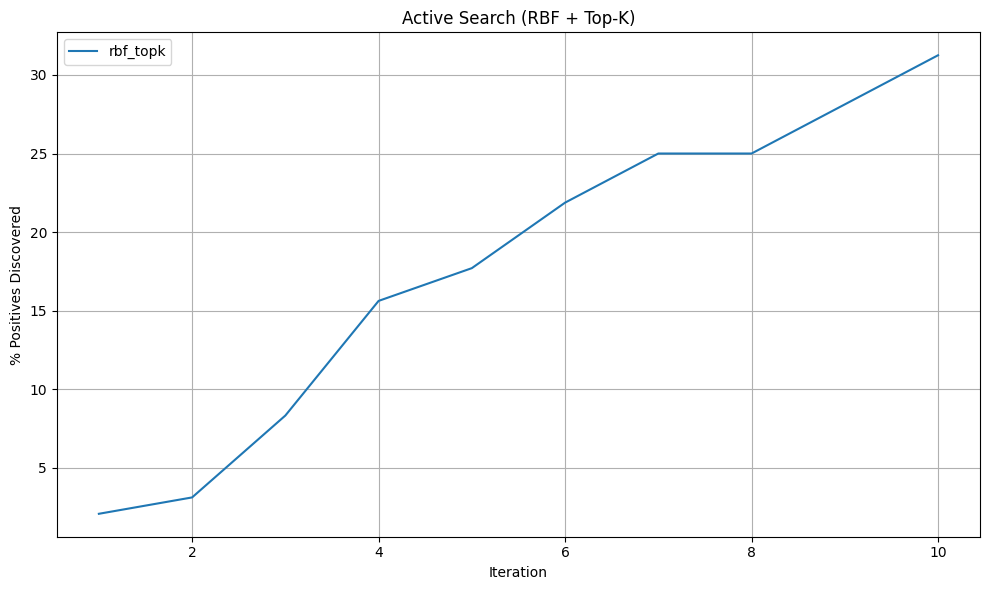

In [ ]:
plot_discovery_curve([np.float64(2.0833333333333335),
 np.float64(3.125),
 np.float64(8.333333333333334),
 np.float64(15.625),
 np.float64(17.708333333333332),
 np.float64(21.875),
 np.float64(25.0),
 np.float64(25.0),
 np.float64(28.125),
 np.float64(31.25)])

___

In [2]:
import networkx as nx
import numpy as np

def build_paper_features_and_labels(
    G: nx.Graph,
    compute_betweenness=True,
    compute_closeness=True,
    max_nodes_for_expensive=100,
    alpha=0.85
):
    """
    10-step function that:
      1. Filters to only 'paper' nodes
      2. Computes degree/pagerank/betweenness/closeness/clustering
      3. Builds node_features dict {paper_id: np.array([...])}
      4. Builds node_labels dict {paper_id: 0,1,None}
      5. Returns them for classification
    """
    print("\n=== BUILD PAPER FEATURES & LABELS ===")

    ### 1. Identify only the paper nodes
    paper_nodes = [
        n for n, attrs in G.nodes(data=True)
        if attrs.get("node_type") == "paper"
    ]
    print(f"Step 1: Found {len(paper_nodes)} 'paper' nodes in the graph.")

    ### 2. Build subgraph with only those paper nodes (optional).
    #    If you only want to compute graph metrics among paper-paper edges,
    #    do something like G.subgraph(paper_nodes).
    #    But if you want the entire network's betweenness/pagerank, keep them all.
    #    We'll do all-network metrics so the global structure influences betweenness/pagerank.
    num_nodes = G.number_of_nodes()

    ### 3. Compute degree (on the full graph or subgraph).
    #    If you only want "paper-paper" degree, do subG=G.subgraph(paper_nodes), etc.
    print("Step 3: Computing Degree on the FULL graph (or do subgraph if you prefer).")
    degree_dict = dict(G.degree())

    ### 4. Compute PageRank
    print("Step 4: Computing PageRank...")
    pagerank_dict = nx.pagerank(G, alpha=alpha)

    ### 5. Optionally compute betweenness/closeness if feasible
    if compute_betweenness and G.number_of_nodes() <= max_nodes_for_expensive:
        print("Step 5: Computing Betweenness Centrality...")
        betweenness_dict = nx.betweenness_centrality(G)
    else:
        print("Step 5: Skipping Betweenness (too large or not requested).")
        betweenness_dict = {}

    if compute_closeness and G.number_of_nodes() <= max_nodes_for_expensive:
        print("Step 6: Computing Closeness Centrality...")
        closeness_dict = nx.closeness_centrality(G)
    else:
        print("Step 6: Skipping Closeness (too large or not requested).")
        closeness_dict = {}

    ### 7. Local clustering
    print("Step 7: Computing Local Clustering (on the full or undirected graph).")
    if isinstance(G, nx.DiGraph):
        clustering_dict = nx.clustering(G.to_undirected())
    else:
        clustering_dict = nx.clustering(G)

    ### 8. Build node_features ONLY for paper nodes
    node_features = {}
    print("Step 8: Building node_features for PAPER nodes only...")
    for node in paper_nodes:
        deg = degree_dict.get(node, 0)
        pr  = pagerank_dict.get(node, 0.0)
        b   = betweenness_dict.get(node, 0.0)
        c   = closeness_dict.get(node, 0.0)
        lc  = clustering_dict.get(node, 0.0)
        feats = np.array([deg, pr, b, c, lc], dtype=float)
        node_features[node] = feats

    ### 9. Build node_labels for PAPER nodes
    node_labels = {}
    print("Step 9: Building node_labels for PAPER nodes (0,1 or None).")
    labeled_count = 0
    unlabeled_count = 0
    for node in paper_nodes:
        attrs = G.nodes[node]
        lbl = attrs.get("label_included")
        if lbl in (0, 1):
            node_labels[node] = lbl
            labeled_count += 1
        else:
            node_labels[node] = None
            unlabeled_count += 1

    print(f"   - paper_nodes: {len(paper_nodes)}")
    print(f"   - labeled_count: {labeled_count}, unlabeled_count: {unlabeled_count}")

    ### 10. Return
    print("Step 10: Returning node_features and node_labels (PAPER nodes only).")
    return node_features, node_labels


node_features, node_labels = build_paper_features_and_labels(
    G,
    compute_betweenness=True,
    compute_closeness=True,
    max_nodes_for_expensive=100,
    alpha=0.85
)
# node_features[node_id] => array([degree, pagerank, betweenness, closeness, local_cluster])
# node_labels[node_id]   => 0, 1, or None



=== BUILD PAPER FEATURES & LABELS ===
Step 1: Found 1175 'paper' nodes in the graph.
Step 3: Computing Degree on the FULL graph (or do subgraph if you prefer).
Step 4: Computing PageRank...
Step 5: Skipping Betweenness (too large or not requested).
Step 6: Skipping Closeness (too large or not requested).
Step 7: Computing Local Clustering (on the full or undirected graph).
Step 8: Building node_features for PAPER nodes only...
Step 9: Building node_labels for PAPER nodes (0,1 or None).
   - paper_nodes: 1175
   - labeled_count: 1175, unlabeled_count: 0
Step 10: Returning node_features and node_labels (PAPER nodes only).


#### KNN

In [3]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report

# ---------------------------
# STEP 1: Prepare Features & Labels
# ---------------------------
paper_nodes = list(node_features.keys())
node_idx_map = {node: idx for idx, node in enumerate(paper_nodes)}
idx_node_map = {idx: node for node, idx in node_idx_map.items()}

# Build feature matrix X: shape (n_papers, feature_dim)
X = np.vstack([node_features[node] for node in paper_nodes])

# Build ground truth labels: if node_labels[node] is 0 or 1, use it; else treat as unknown (-1)
ground_truth = np.array([
    node_labels[node] if node_labels[node] in (0, 1) else -1
    for node in paper_nodes
])

print(f"Total paper nodes: {len(paper_nodes)}")
labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
print(f"Paper nodes with known labels (ground truth): {len(labeled_indices)}")

# ---------------------------
# STEP 2: Initialize Active Learning Seed
# ---------------------------
active_labels = -1 * np.ones_like(ground_truth)  # start with all unlabeled (-1)

labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
pos_indices = [i for i in labeled_indices if ground_truth[i] == 1]
neg_indices = [i for i in labeled_indices if ground_truth[i] == 0]

np.random.shuffle(pos_indices)
np.random.shuffle(neg_indices)

seed_count = 1  # choose up to 20 positives and 20 negatives
seed_pos = pos_indices[:min(seed_count, len(pos_indices))]
seed_neg = neg_indices[:min(seed_count, len(neg_indices))]
seed_indices = list(seed_pos) + list(seed_neg)

for idx in seed_indices:
    active_labels[idx] = ground_truth[idx]

print(f"Initial seed set size: {len(seed_indices)} "
      f"(Positives: {sum(ground_truth[i]==1 for i in seed_indices)}, "
      f"Negatives: {sum(ground_truth[i]==0 for i in seed_indices)})")

total_positives = sum(1 for lbl in ground_truth if lbl == 1)
print(f"Total positives in ground truth: {total_positives}")

# ---------------------------
# STEP 3: Active Search with Refined Query Strategy
# ---------------------------
n_iterations = 50           # Number of active learning iterations
query_batch_size = 1       # Number of new nodes to "query" per iteration

# Configure LabelSpreading with a KNN kernel.
model = LabelSpreading(kernel='knn', n_neighbors=30, alpha=0.2, max_iter=300)

# Set exploration ratio (e.g., 50% exploitation, 50% exploration)
exploration_ratio = 0.5
exploitation_count = int(query_batch_size * (1 - exploration_ratio))
exploration_count = query_batch_size - exploitation_count

for iteration in range(1, n_iterations + 1):
    print(f"\n=== Iteration {iteration} ===")
    
    # (A) Train the LabelSpreading model on current active labels
    model.fit(X, active_labels)
    label_distributions = model.label_distributions_
    
    # (B) Identify unlabeled nodes (active_labels == -1)
    unlabeled_indices = [i for i, lbl in enumerate(active_labels) if lbl == -1]
    if not unlabeled_indices:
        print("No more unlabeled nodes to query.")
        break
    
    # (C) For unlabeled nodes, extract class probabilities
    prob_0 = label_distributions[unlabeled_indices, 0]
    prob_1 = label_distributions[unlabeled_indices, 1]
    # Compute the margin (lower margin means higher uncertainty)
    margin = np.abs(prob_1 - prob_0)
    
    # (D) Refined query strategy:
    #  - Exploitation: Select nodes with highest p(label=1)
    exploitation_order = np.argsort(-prob_1)
    exploitation_selected = [unlabeled_indices[i] for i in exploitation_order[:exploitation_count]]
    
    #  - Exploration: Select nodes with smallest margin (most uncertain)
    exploration_order = np.argsort(margin)
    # Map indices from exploration_order back to actual node indices
    exploration_candidates = [unlabeled_indices[i] for i in exploration_order 
                              if unlabeled_indices[i] not in exploitation_selected]
    exploration_selected = exploration_candidates[:exploration_count]
    
    # Combine the selected indices
    selected_indices = exploitation_selected + exploration_selected
    
    # (E) Show the top queried nodes with their predicted probability and true label.
    print("Top queried nodes:")
    for rank, idx in enumerate(selected_indices, start=1):
        node_id = idx_node_map[idx]
        predicted_prob = label_distributions[idx, 1]
        true_label = ground_truth[idx]
        print(f"  Rank {rank}: Node {node_id} => p(label=1) = {predicted_prob:.4f}, True Label = {true_label}")
    
    # (F) Simulate "human" labeling: update active_labels using the ground truth.
    for idx in selected_indices:
        active_labels[idx] = ground_truth[idx]
    
    # (G) Report how many positives have been discovered so far.
    discovered_positives = sum(1 for i in range(len(active_labels)) if active_labels[i] == 1)
    percent_found = 100.0 * discovered_positives / total_positives if total_positives > 0 else 0
    print(f"After iteration {iteration}, discovered {discovered_positives} out of {total_positives} positives "
          f"({percent_found:.2f}%).")
    
    # (H) (Optional) Evaluate performance on all nodes originally labeled in the ground truth.
    evaluated_indices = [i for i in range(len(ground_truth)) if ground_truth[i] in (0, 1)]
    if evaluated_indices:
        transduced = model.transduction_
        y_true = ground_truth[evaluated_indices]
        y_pred = transduced[evaluated_indices]
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        print("Confusion Matrix:")
        print(cm)
        print("Classification Report:")
        print(classification_report(y_true, y_pred, labels=[0, 1], digits=4))

print("\n=== ACTIVE SEARCH COMPLETE ===")


Total paper nodes: 1175
Paper nodes with known labels (ground truth): 1175
Initial seed set size: 2 (Positives: 1, Negatives: 1)
Total positives in ground truth: 96

=== Iteration 1 ===
Top queried nodes:
  Rank 1: Node https://openalex.org/W2161740213 => p(label=1) = 1.0000, True Label = 0
  Rank 2: Node https://openalex.org/W2888926280 => p(label=1) = 1.0000, True Label = 0
  Rank 3: Node https://openalex.org/W2143979475 => p(label=1) = 1.0000, True Label = 0
  Rank 4: Node https://openalex.org/W2526731436 => p(label=1) = 1.0000, True Label = 0
  Rank 5: Node https://openalex.org/W4221020763 => p(label=1) = 1.0000, True Label = 0
  Rank 6: Node https://openalex.org/W2382168424 => p(label=1) = 0.0000, True Label = 0
  Rank 7: Node https://openalex.org/W2077255513 => p(label=1) = 0.0000, True Label = 0
  Rank 8: Node https://openalex.org/W2046683078 => p(label=1) = 0.0000, True Label = 0
  Rank 9: Node https://openalex.org/W2462144205 => p(label=1) = 0.0000, True Label = 0
  Rank 10: N

#### RBF

In [3]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report

# ---------------------------
# STEP 1: Prepare Features & Labels
# ---------------------------
paper_nodes = list(node_features.keys())
node_idx_map = {node: idx for idx, node in enumerate(paper_nodes)}
idx_node_map = {idx: node for node, idx in node_idx_map.items()}

# Build feature matrix X: shape (n_papers, feature_dim)
X = np.vstack([node_features[node] for node in paper_nodes])

# Build ground truth labels: if node_labels[node] is 0 or 1, use it; else treat as unknown (-1)
ground_truth = np.array([
    node_labels[node] if node_labels[node] in (0, 1) else -1
    for node in paper_nodes
])

print(f"Total paper nodes: {len(paper_nodes)}")
labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
print(f"Paper nodes with known labels (ground truth): {len(labeled_indices)}")

# ---------------------------
# STEP 2: Initialize Active Learning Seed
# ---------------------------
active_labels = -1 * np.ones_like(ground_truth)  # start with all unlabeled (-1)

labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
pos_indices = [i for i in labeled_indices if ground_truth[i] == 1]
neg_indices = [i for i in labeled_indices if ground_truth[i] == 0]

np.random.shuffle(pos_indices)
np.random.shuffle(neg_indices)

seed_count = 1  # choose up to 20 positives and 20 negatives
seed_pos = pos_indices[:min(seed_count, len(pos_indices))]
seed_neg = neg_indices[:min(seed_count, len(neg_indices))]
seed_indices = list(seed_pos) + list(seed_neg)

for idx in seed_indices:
    active_labels[idx] = ground_truth[idx]

print(f"Initial seed set size: {len(seed_indices)} "
      f"(Positives: {sum(ground_truth[i]==1 for i in seed_indices)}, "
      f"Negatives: {sum(ground_truth[i]==0 for i in seed_indices)})")

total_positives = sum(1 for lbl in ground_truth if lbl == 1)
print(f"Total positives in ground truth: {total_positives}")

# ---------------------------
# STEP 3: Active Search with Refined Query Strategy using RBF Kernel
# ---------------------------
n_iterations = 10           # Number of active learning iterations
query_batch_size = 10       # Number of new nodes to "query" per iteration

# Configure LabelSpreading with an RBF kernel.
# Adjust the gamma parameter based on your dataset.
model = LabelSpreading(kernel='rbf', gamma=0.2, alpha=0.2, max_iter=300)
# Set exploration ratio (e.g., 50% exploitation, 50% exploration)
exploration_ratio = 0.5
exploitation_count = int(query_batch_size * (1 - exploration_ratio))
exploration_count = query_batch_size - exploitation_count

for iteration in range(1, n_iterations + 1):
    print(f"\n=== Iteration {iteration} ===")
    
    # (A) Train the LabelSpreading model on current active labels
    model.fit(X, active_labels)
    label_distributions = model.label_distributions_
    
    # (B) Identify unlabeled nodes (active_labels == -1)
    unlabeled_indices = [i for i, lbl in enumerate(active_labels) if lbl == -1]
    if not unlabeled_indices:
        print("No more unlabeled nodes to query.")
        break
    
    # (C) For unlabeled nodes, extract class probabilities
    prob_0 = label_distributions[unlabeled_indices, 0]
    prob_1 = label_distributions[unlabeled_indices, 1]
    # Compute the margin (lower margin means higher uncertainty)
    margin = np.abs(prob_1 - prob_0)
    
    # (D) Refined query strategy:
    #  - Exploitation: Select nodes with highest p(label=1)
    exploitation_order = np.argsort(-prob_1)
    exploitation_selected = [unlabeled_indices[i] for i in exploitation_order[:exploitation_count]]
    
    #  - Exploration: Select nodes with smallest margin (most uncertain)
    exploration_order = np.argsort(margin)
    exploration_candidates = [unlabeled_indices[i] for i in exploration_order 
                              if unlabeled_indices[i] not in exploitation_selected]
    exploration_selected = exploration_candidates[:exploration_count]
    
    # Combine the selected indices
    selected_indices = exploitation_selected + exploration_selected
    
    # (E) Show the top queried nodes with their predicted probability and true label.
    print("Top queried nodes:")
    for rank, idx in enumerate(selected_indices, start=1):
        node_id = idx_node_map[idx]
        predicted_prob = label_distributions[idx, 1]
        true_label = ground_truth[idx]
        print(f"  Rank {rank}: Node {node_id} => p(label=1) = {predicted_prob:.4f}, True Label = {true_label}")
    
    # (F) Simulate "human" labeling: update active_labels using the ground truth.
    for idx in selected_indices:
        active_labels[idx] = ground_truth[idx]
    
    # (G) Report how many positives have been discovered so far.
    discovered_positives = sum(1 for i in range(len(active_labels)) if active_labels[i] == 1)
    percent_found = 100.0 * discovered_positives / total_positives if total_positives > 0 else 0
    print(f"After iteration {iteration}, discovered {discovered_positives} out of {total_positives} positives "
          f"({percent_found:.2f}%).")
    
    # (H) (Optional) Evaluate performance on all nodes originally labeled in the ground truth.
    evaluated_indices = [i for i in range(len(ground_truth)) if ground_truth[i] in (0, 1)]
    if evaluated_indices:
        transduced = model.transduction_
        y_true = ground_truth[evaluated_indices]
        y_pred = transduced[evaluated_indices]
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        print("Confusion Matrix:")
        print(cm)
        print("Classification Report:")
        print(classification_report(y_true, y_pred, labels=[0, 1], digits=4))

print("\n=== ACTIVE SEARCH COMPLETE ===")


Total paper nodes: 1175
Paper nodes with known labels (ground truth): 1175
Initial seed set size: 2 (Positives: 1, Negatives: 1)
Total positives in ground truth: 96

=== Iteration 1 ===
Top queried nodes:
  Rank 1: Node https://openalex.org/W2750012330 => p(label=1) = 1.0000, True Label = 0
  Rank 2: Node https://openalex.org/W204179501 => p(label=1) = 1.0000, True Label = 0
  Rank 3: Node https://openalex.org/W1996586068 => p(label=1) = 1.0000, True Label = 0
  Rank 4: Node https://openalex.org/W2150087413 => p(label=1) = 1.0000, True Label = 0
  Rank 5: Node https://openalex.org/W2012920872 => p(label=1) = 1.0000, True Label = 0
  Rank 6: Node https://openalex.org/W2223297936 => p(label=1) = 0.0000, True Label = 1
  Rank 7: Node https://openalex.org/W206866601 => p(label=1) = 0.2573, True Label = 0
  Rank 8: Node https://openalex.org/W2785908044 => p(label=1) = 0.2571, True Label = 0
  Rank 9: Node https://openalex.org/W2518357713 => p(label=1) = 0.2571, True Label = 1
  Rank 10: Nod

#### Thompson Active Learning Algorithm Selection

https://proceedings.neurips.cc/paper_files/paper/2023/file/1e77af93008ee6cd248a31723ce357d8-Paper-Conference.pdf thompson algo

https://clgiles.ist.psu.edu/pubs/CIKM-2007-learning-border.pdf metrics


In [3]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report
import pandas as pd
import networkx as nx
import ast
import os
# ---------------------------
# Active Search using Thompson Sampling for Query Strategy Selection
# ---------------------------
paper_nodes = list(node_features.keys())
node_idx_map = {node: idx for idx, node in enumerate(paper_nodes)}
idx_node_map = {idx: node for node, idx in node_idx_map.items()}

# Build feature matrix X
X = np.vstack([node_features[node] for node in paper_nodes])
ground_truth = np.array([node_labels[node] if node_labels[node] in (0, 1) else -1
                         for node in paper_nodes])

print(f"Total paper nodes: {len(paper_nodes)}")
labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
print(f"Paper nodes with known labels (ground truth): {len(labeled_indices)}")

# ---------------------------
# Initialize Active Learning Seed
# ---------------------------
active_labels = -1 * np.ones_like(ground_truth)
labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
pos_indices = [i for i in labeled_indices if ground_truth[i] == 1]
neg_indices = [i for i in labeled_indices if ground_truth[i] == 0]
np.random.shuffle(pos_indices)
np.random.shuffle(neg_indices)
seed_count = 1  # For Thompson sampling, we can start with a very small seed
seed_pos = pos_indices[:min(seed_count, len(pos_indices))]
seed_neg = neg_indices[:min(seed_count, len(neg_indices))]
seed_indices = list(seed_pos) + list(seed_neg)
for idx in seed_indices:
    active_labels[idx] = ground_truth[idx]
print(f"Initial seed set size: {len(seed_indices)} "
      f"(Positives: {sum(ground_truth[i]==1 for i in seed_indices)}, "
      f"Negatives: {sum(ground_truth[i]==0 for i in seed_indices)})")
total_positives = sum(1 for lbl in ground_truth if lbl == 1)
print(f"Total positives in ground truth: {total_positives}")

# ---------------------------
# Active Search with Thompson Sampling Query Strategy
# ---------------------------
n_iterations = 10          # Number of active learning iterations
query_batch_size = 10      # Number of queries per iteration

# Configure LabelSpreading (here using an RBF kernel; adjust gamma as needed)
model = LabelSpreading(kernel='rbf', gamma=0.1, alpha=0.2, max_iter=300)

# Initialize Beta parameters for two arms: exploitation and exploration.
alpha_exploit, beta_exploit = 1.0, 1.0
alpha_explore, beta_explore = 1.0, 1.0

for iteration in range(1, n_iterations + 1):
    print(f"\n=== Iteration {iteration} ===")
    model.fit(X, active_labels)
    label_distributions = model.label_distributions_
    
    # List of unlabeled indices
    unlabeled_indices = [i for i, lbl in enumerate(active_labels) if lbl == -1]
    if not unlabeled_indices:
        print("No more unlabeled nodes to query.")
        break

    selected_queries = []  # to store tuples (idx, chosen_arm)
    for q in range(query_batch_size):
        # If no more unlabeled nodes remain, break.
        if not unlabeled_indices:
            break
        
        # Thompson sampling: sample a value for each arm
        sample_exploit = np.random.beta(alpha_exploit, beta_exploit)
        sample_explore = np.random.beta(alpha_explore, beta_explore)
        
        # Choose arm based on highest sampled value
        if sample_exploit >= sample_explore:
            chosen_arm = 'exploit'
            # Exploitation: choose the node with highest p(label=1)
            sorted_idx = sorted(unlabeled_indices, key=lambda i: label_distributions[i, 1], reverse=True)
            chosen_idx = sorted_idx[0]
        else:
            chosen_arm = 'explore'
            # Exploration: choose the node with smallest margin (|p(label=1)-p(label=0)|)
            sorted_idx = sorted(unlabeled_indices, key=lambda i: abs(label_distributions[i,1]-label_distributions[i,0]))
            chosen_idx = sorted_idx[0]
        
        # Remove chosen index so it's not queried again in this iteration
        unlabeled_indices.remove(chosen_idx)
        selected_queries.append((chosen_idx, chosen_arm))
        
        # Simulate "human" labeling: obtain true label
        true_label = ground_truth[chosen_idx]
        reward = 1 if true_label == 1 else 0
        # Update Beta parameters for the chosen arm
        if chosen_arm == 'exploit':
            if reward == 1:
                alpha_exploit += 1
            else:
                beta_exploit += 1
        else:
            if reward == 1:
                alpha_explore += 1
            else:
                beta_explore += 1
        # Update active_labels with the true label
        active_labels[chosen_idx] = true_label

    # Print the queries of this iteration
    print("Selected queries:")
    for rank, (idx, arm) in enumerate(selected_queries, start=1):
        node_id = idx_node_map[idx]
        predicted_prob = label_distributions[idx, 1]
        true_label = ground_truth[idx]
        print(f"  Rank {rank}: Node {node_id} via {arm} arm => p(label=1) = {predicted_prob:.4f}, True Label = {true_label}")
    
    discovered_positives = sum(1 for i in range(len(active_labels)) if active_labels[i] == 1)
    percent_found = 100.0 * discovered_positives / total_positives if total_positives > 0 else 0
    print(f"After iteration {iteration}, discovered {discovered_positives} out of {total_positives} positives ({percent_found:.2f}%).")
    
    evaluated_indices = [i for i in range(len(ground_truth)) if ground_truth[i] in (0, 1)]
    if evaluated_indices:
        transduced = model.transduction_
        y_true = ground_truth[evaluated_indices]
        y_pred = transduced[evaluated_indices]
        cm = confusion_matrix(y_true, y_pred, labels=[0,1])
        print("Confusion Matrix:")
        print(cm)
        print("Classification Report:")
        print(classification_report(y_true, y_pred, labels=[0,1], digits=4))

print("\n=== ACTIVE SEARCH COMPLETE ===")

Total paper nodes: 1175
Paper nodes with known labels (ground truth): 1175
Initial seed set size: 2 (Positives: 1, Negatives: 1)
Total positives in ground truth: 96

=== Iteration 1 ===
Selected queries:
  Rank 1: Node https://openalex.org/W3007172259 via exploit arm => p(label=1) = 1.0000, True Label = 0
  Rank 2: Node https://openalex.org/W3086772849 via explore arm => p(label=1) = 0.4855, True Label = 0
  Rank 3: Node https://openalex.org/W2316736226 via explore arm => p(label=1) = 0.4855, True Label = 0
  Rank 4: Node https://openalex.org/W3093355007 via explore arm => p(label=1) = 0.4855, True Label = 0
  Rank 5: Node https://openalex.org/W2083667175 via exploit arm => p(label=1) = 1.0000, True Label = 0
  Rank 6: Node https://openalex.org/W2042511089 via exploit arm => p(label=1) = 1.0000, True Label = 1
  Rank 7: Node https://openalex.org/W2133096089 via exploit arm => p(label=1) = 1.0000, True Label = 1
  Rank 8: Node https://openalex.org/W2127616408 via exploit arm => p(label=

D(discovered):10 iteration = 100 nodes labeled + 2satrter=102 [24+] P=0.23

D(T): 1175 nodes [96+] P=0.081

=> ~ Ratio Imroved = 2.815 => ~ %282 Improved

#### Entrophy 

In [3]:
import numpy as np
from sklearn.semi_supervised import LabelSpreading
from sklearn.metrics import confusion_matrix, classification_report

# ---------------------------
# STEP 1: Prepare Features & Labels
# ---------------------------
paper_nodes = list(node_features.keys())
node_idx_map = {node: idx for idx, node in enumerate(paper_nodes)}
idx_node_map = {idx: node for node, idx in node_idx_map.items()}

# Build feature matrix X: shape (n_papers, feature_dim)
X = np.vstack([node_features[node] for node in paper_nodes])

# Build ground truth labels: if node_labels[node] is 0 or 1, use it; else treat as unknown (-1)
ground_truth = np.array([
    node_labels[node] if node_labels[node] in (0, 1) else -1
    for node in paper_nodes
])

print(f"Total paper nodes: {len(paper_nodes)}")
labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
print(f"Paper nodes with known labels (ground truth): {len(labeled_indices)}")

# ---------------------------
# STEP 2: Initialize Active Learning Seed
# ---------------------------
active_labels = -1 * np.ones_like(ground_truth)  # start with all unlabeled (-1)

labeled_indices = [i for i, lbl in enumerate(ground_truth) if lbl in (0, 1)]
pos_indices = [i for i in labeled_indices if ground_truth[i] == 1]
neg_indices = [i for i in labeled_indices if ground_truth[i] == 0]

np.random.shuffle(pos_indices)
np.random.shuffle(neg_indices)

seed_count = 1  # choose up to 1 positive and 1 negative (adjust as needed)
seed_pos = pos_indices[:min(seed_count, len(pos_indices))]
seed_neg = neg_indices[:min(seed_count, len(neg_indices))]
seed_indices = list(seed_pos) + list(seed_neg)

for idx in seed_indices:
    active_labels[idx] = ground_truth[idx]

print(f"Initial seed set size: {len(seed_indices)} "
      f"(Positives: {sum(ground_truth[i]==1 for i in seed_indices)}, "
      f"Negatives: {sum(ground_truth[i]==0 for i in seed_indices)})")

total_positives = sum(1 for lbl in ground_truth if lbl == 1)
print(f"Total positives in ground truth: {total_positives}")

# ---------------------------
# STEP 3: Active Search with Entropy-based Query Strategy
# ---------------------------
n_iterations = 10           # Number of active learning iterations
query_batch_size = 10       # Number of new nodes to "query" per iteration

# Configure LabelSpreading with a KNN kernel.
#model = LabelSpreading(kernel='knn', n_neighbors=30, alpha=0.2, max_iter=300)
model = LabelSpreading(kernel='rbf', gamma=0.2, alpha=0.2, max_iter=300)

# Set exploration ratio (e.g., 50% exploitation, 50% exploration)
exploration_ratio = 0.5
exploitation_count = int(query_batch_size * (1 - exploration_ratio))
exploration_count = query_batch_size - exploitation_count

for iteration in range(1, n_iterations + 1):
    print(f"\n=== Iteration {iteration} ===")
    
    # (A) Train the LabelSpreading model on current active labels
    model.fit(X, active_labels)
    label_distributions = model.label_distributions_
    
    # (B) Identify unlabeled nodes (active_labels == -1)
    unlabeled_indices = [i for i, lbl in enumerate(active_labels) if lbl == -1]
    if not unlabeled_indices:
        print("No more unlabeled nodes to query.")
        break
    
    # (C) For unlabeled nodes, extract class probabilities
    prob_0 = label_distributions[unlabeled_indices, 0]
    prob_1 = label_distributions[unlabeled_indices, 1]
    
    # (D) Compute entropy for each unlabeled node:
    #     Entropy = -[p*log(p) + (1-p)*log(1-p)]
    #     Use a small epsilon to avoid log(0).
    epsilon = 1e-10
    entropy = - (prob_0 * np.log(prob_0 + epsilon) + prob_1 * np.log(prob_1 + epsilon))
    
    # Refined query strategy:
    #  - Exploitation: Select nodes with highest p(label=1)
    exploitation_order = np.argsort(-prob_1)
    exploitation_selected = [unlabeled_indices[i] for i in exploitation_order[:exploitation_count]]
    
    #  - Exploration: Select nodes with highest entropy (most uncertainty)
    exploration_order = np.argsort(-entropy)
    # Map indices from exploration_order back to actual node indices and avoid duplicates
    exploration_candidates = [unlabeled_indices[i] for i in exploration_order 
                              if unlabeled_indices[i] not in exploitation_selected]
    exploration_selected = exploration_candidates[:exploration_count]
    
    # Combine the selected indices
    selected_indices = exploitation_selected + exploration_selected
    
    # (E) Show the top queried nodes with their predicted probability and true label.
    print("Top queried nodes:")
    for rank, idx in enumerate(selected_indices, start=1):
        node_id = idx_node_map[idx]
        predicted_prob = label_distributions[idx, 1]
        true_label = ground_truth[idx]
        print(f"  Rank {rank}: Node {node_id} => p(label=1) = {predicted_prob:.4f}, True Label = {true_label}")
    
    # (F) Simulate "human" labeling: update active_labels using the ground truth.
    for idx in selected_indices:
        active_labels[idx] = ground_truth[idx]
    
    # (G) Report how many positives have been discovered so far.
    discovered_positives = sum(1 for i in range(len(active_labels)) if active_labels[i] == 1)
    percent_found = 100.0 * discovered_positives / total_positives if total_positives > 0 else 0
    print(f"After iteration {iteration}, discovered {discovered_positives} out of {total_positives} positives "
          f"({percent_found:.2f}%).")
    
    # (H) (Optional) Evaluate performance on all nodes originally labeled in the ground truth.
    evaluated_indices = [i for i in range(len(ground_truth)) if ground_truth[i] in (0, 1)]
    if evaluated_indices:
        transduced = model.transduction_
        y_true = ground_truth[evaluated_indices]
        y_pred = transduced[evaluated_indices]
        cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
        print("Confusion Matrix:")
        print(cm)
        print("Classification Report:")
        print(classification_report(y_true, y_pred, labels=[0, 1], digits=4))

print("\n=== ACTIVE SEARCH COMPLETE ===")


Total paper nodes: 1175
Paper nodes with known labels (ground truth): 1175
Initial seed set size: 2 (Positives: 1, Negatives: 1)
Total positives in ground truth: 96

=== Iteration 1 ===
Top queried nodes:
  Rank 1: Node https://openalex.org/W2750012330 => p(label=1) = 0.9999, True Label = 0
  Rank 2: Node https://openalex.org/W1997630746 => p(label=1) = 0.9999, True Label = 0
  Rank 3: Node https://openalex.org/W2372586390 => p(label=1) = 0.9999, True Label = 0
  Rank 4: Node https://openalex.org/W2477024019 => p(label=1) = 0.9999, True Label = 0
  Rank 5: Node https://openalex.org/W2006751047 => p(label=1) = 0.9999, True Label = 0
  Rank 6: Node https://openalex.org/W2017068794 => p(label=1) = 0.6420, True Label = 0
  Rank 7: Node https://openalex.org/W2899516412 => p(label=1) = 0.6421, True Label = 0
  Rank 8: Node https://openalex.org/W3022139532 => p(label=1) = 0.6422, True Label = 0
  Rank 9: Node https://openalex.org/W3126208915 => p(label=1) = 0.6422, True Label = 0
  Rank 10: N

# DGL

In [ ]:
%pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement tensorflow (from versions: none)
ERROR: No matching distribution found for tensorflow


In [ ]:
import dgl
import tensorflow as tf
import numpy as np

# We assume the following variables have been computed from your preprocessing:
# - nodes: a list of nodes in the same order as used in feature matrix X
# - X: a NumPy array of node features (shape: [N, feature_dim])
# - y: a NumPy array of labels (for paper nodes, e.g. 0/1; for non-paper nodes, a dummy label)
# - train_mask: a boolean mask of shape [N] that is True for paper nodes with valid labels

# Convert your NetworkX graph G to a DGL graph.
# Note: dgl.from_networkx preserves node order based on the provided list.
dgl_g = dgl.from_networkx(G, ndata=['node_type', 'year', 'label_included'])

# Assign your computed feature matrix and labels to the DGL graph.
dgl_g.ndata['feat'] = tf.convert_to_tensor(X, dtype=tf.float32)
dgl_g.ndata['label'] = tf.convert_to_tensor(y, dtype=tf.int32)
dgl_g.ndata['train_mask'] = tf.convert_to_tensor(train_mask, dtype=tf.bool)

print("DGL graph has", dgl_g.number_of_nodes(), "nodes and", dgl_g.number_of_edges(), "edges.")


# Researches

## R0
### Introduction  
Automating literature reviews and paper screening can greatly benefit from graph-based models that capture rich relationships among scholarly entities. A **multi-layer network** (also called a multiplex or heterogeneous network) provides a powerful framework to represent different facets of academic literature in one integrated structure ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=,and%20a%20structured%20analysis%20of)) ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=By%20design%2C%20networks%20with%20multiple,collection%20challenges)). Instead of viewing the literature as a flat list of documents, a multi-layer graph encodes papers, authors, keywords, and other metadata as interconnected nodes across several layers. This approach embraces the reality that publications are linked by various relationships (citations, authorship, topics, etc.) which can be seen as interdependent subnetworks ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=,and%20a%20structured%20analysis%20of)). By leveraging **graph learning** on such a multi-layer network, we can perform classification (e.g. relevant vs. irrelevant papers for a review) in a way that exploits the scholarly context of each paper. In what follows, we discuss how to design this multi-layer graph – defining its nodes, edges, and layers – and how to propagate labels through it. We also examine strategies for graph construction to optimize classification performance with transparency, and approaches for interactive visualization of the resulting multi-layer graph and the label propagation dynamics. Throughout, we ground the discussion in state-of-the-art methodologies from graph learning and bibliometric analysis, providing references for each aspect. 

#### Nodes as Vertices in the Graph  
Choosing the right entities as **nodes** is the first key step. In a scholarly network, typical node types include: **papers**, **authors**, **venues** (journals/conferences), and **terms** or **keywords** ([](https://aclanthology.org/Q14-1001.pdf#:~:text=1,published%20in%5D%20%E2%80%94%20venue1)). Prior research on heterogeneous academic networks has modeled exactly these as distinct node sets – for example, one study constructed a graph with five semantic node types: *paper*, *author*, *venue*, *institution*, and *term* ([](https://aclanthology.org/Q14-1001.pdf#:~:text=1,cites%5D%20%E2%80%94%20paper)). In our context of literature reviews, the most relevant node types are:  

- **Paper nodes** – Each publication (article, conference paper, etc.) is a node. This is essential, as ultimately we want to classify papers (e.g. inclusion/exclusion in a review).  
- **Author nodes** – Each unique author can be a node. Including authors enables the graph to capture the social dimension of research; authors with overlapping interests or collaborations can link relevant papers together.  
- **Keyword or Term nodes** – Important keywords, topics, or technical terms extracted from papers (e.g. from titles/abstracts) can be represented as nodes. These provide a content-based connection between papers that use similar terminology.  
- **Other metadata nodes** – Depending on needs, we might include venues (to link papers in the same journal or conference), institutions, or even identified research topics (from a topic modeling algorithm) as separate nodes ([](https://aclanthology.org/Q14-1001.pdf#:~:text=AAN%2C%20where%20V%20is%20the,published%20in%5D%20%E2%80%94%20venue1)). For instance, if performing a domain-specific review, one could include *topic nodes* from an LDA topic model and link papers to their dominant topics.  

Using multiple node types leads to a **heterogeneous network** (a network with different kinds of entities). This richer representation has been advocated in the literature: “a node usually denotes an academic entity, such as a paper, a journal, or an author” rather than using only one type ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=In%20recent%20years%2C%20we%20have,word.%20Through%20scholarly%20network)). The optimal choice of node types should reflect the facets of the data that are most useful for distinguishing relevant versus irrelevant papers. For example, in an interdisciplinary review, author and institution nodes might be less informative than content nodes (keywords/topics), whereas in a narrow field with prominent research groups, author connections might be very predictive. In practice, many systems use at least **papers, authors, and keywords** as nodes, since these capture the core elements of “who wrote what about which topic.” Importantly, including multiple types of nodes allows us to later construct multiple layers of relationships between them, as described next.

#### Edges as Meaningful Connections  
After defining the vertices, we determine the **edges** – the relationships or links that connect those nodes. In a multi-layer scholarly graph, different edge types represent different semantic relations:  

- **Citation links (paper–paper)** – A directed edge from paper A to paper B indicates that A cites B. This is a crucial relation capturing the scholarly influence and knowledge flow. Citation networks are widely studied and often form the backbone of bibliometric analysis. Two papers connected by a citation are likely topically related (at least one builds on the other). In graph terms, citation edges connect paper nodes within a “citation network” layer.  
- **Co-authorship (author–author)** – An undirected edge between Author X and Author Y can represent that they have co-authored one or more papers together. This relation forms an *author collaboration network*. Co-authorship edges indicate a social or collaborative tie; authors who collaborate may share domains of expertise, which can indirectly relate their papers. (Alternatively, co-authorship can be represented by author–paper bipartite links as discussed below in graph construction, but many analyses project this into an author–author network where an edge means “worked on at least one paper together.”)  
- **Authorship (author–paper)** – In a heterogeneous graph, we will naturally include edges between authors and the papers they wrote ([](https://aclanthology.org/Q14-1001.pdf#:~:text=AAN%2C%20where%20V%20is%20the,published%20in%5D%20%E2%80%94%20venue1)). Each such edge links an author node to a paper node (often labeled with the “writes” relation). These edges cross between the author layer and paper layer and allow propagation of information from papers to their authors and vice versa. For example, if a certain paper is labeled relevant, the author node can accumulate that information and potentially transfer it to the author’s other papers.  
- **Keyword inclusion (paper–term)** – If we have keyword nodes, we link each paper to the keywords that appear in its title/abstract or are assigned to it ([](https://aclanthology.org/Q14-1001.pdf#:~:text=AAN%2C%20where%20V%20is%20the,published%20in%5D%20%E2%80%94%20venue1)). This creates a bipartite relation: paper *contains* term. Such edges embed content information in the graph: a paper node connected to a “machine learning” keyword node indicates that topic is discussed in the paper. This can help find other papers with overlapping keywords.  
- **Keyword similarity or Co-word (paper–paper or term–term)** – We can also define direct similarity edges between papers based on keywords. For example, if two papers share one or more keywords, draw an edge between them, weighted by the number or rarity of shared keywords. This is related to the concept of *co-word networks* in bibliometrics, where nodes (often terms or documents) are connected if they frequently co-occur ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=In%20recent%20years%2C%20we%20have,word.%20Through%20scholarly%20network)). Alternatively, one can connect keyword nodes to each other if they appear together in many papers, forming a keyword–keyword similarity layer (terms that co-occur indicate a topical relationship).  
- **Semantic similarity (paper–paper)** – Beyond exact keyword matching, we can compute a more nuanced semantic similarity between papers. For instance, using **cosine similarity** of textual embeddings (from abstracts or full texts), or comparing topic distributions from a topic model, we determine if two papers are topically similar. Pairs of papers with similarity above a threshold can be connected by an undirected edge in a “semantic similarity” layer. This captures relatedness even if they don’t cite each other directly. In bibliometrics, there are established measures like *co-citation* and *bibliographic coupling* that serve a similar purpose: they infer similarity from citation patterns. For example, two papers are said to be **bibliographically coupled** if they cite a common set of references; conversely, they are **co-cited** if they are jointly cited by other papers ([Bibliographic coupling - Wikipedia](https://en.wikipedia.org/wiki/Bibliographic_coupling#:~:text=Bibliographic%20coupling%2C%20like%20co,an%20indication%20that%20a%20probability)) ([Co-citation - Wikipedia](https://en.wikipedia.org/wiki/Co-citation#:~:text=Co,makes%20use%20of%20%2051)). These measures create a kind of similarity network among papers based on citation analysis. Such networks often align with topical similarity – *co-citation*, in particular, is considered a semantic similarity indicator (papers frequently cited together tend to be semantically related) ([Co-citation - Wikipedia](https://en.wikipedia.org/wiki/Co-citation#:~:text=Co,makes%20use%20of%20%2051)). We could include edges for co-citation relationships or bibliographic coupling as well, effectively linking papers that share references or are cited together.  

In summary, there is a spectrum of meaningful connections we can represent: from explicit links like citations and co-authorship, to implicit similarity links like shared keywords, topics, or citation patterns. A multi-layer network approach would *separate these different edge types into distinct layers*, rather than confounding them. This means, for example, one layer of the graph could be the pure citation network among papers, while a different layer captures paper-paper edges based on content similarity, and yet another is an author collaboration network. By encoding multiple types of edges, we ensure that two nodes can be connected via different pathways. This redundancy can be very powerful: if a relevant paper isn’t directly cited by another, they might still be linked through a shared author or a common keyword, allowing the model to discover relevance via an alternate route. Indeed, modern studies compare these different networks – citation, co-authorship, co-citation, co-word, etc. – and find they each reveal a different “view” of the scholarly landscape ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=This%20study%20is%20motivated%20to,coauthorship%20networks%20have%20the%20lowest)) ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=We%20find%20that%20topical%20networks,word%20networks%20and)). For our purposes, incorporating multiple edge types provides complementary signals for determining if a paper should be included in a review. The key is to choose relations that are **meaningful for the classification task** (e.g. topic similarity is likely meaningful; something like “published in same venue” might or might not be, depending on the context). Each chosen relation becomes one aspect (layer) of the multi-layer graph, discussed next.

#### Multi-Layer Network Integration of Scholarly Aspects  
A **multi-layer graph** structure lets us integrate all the above aspects in one framework while keeping them distinguishable. Formally, a multi-layer (or multiplex) network consists of multiple layers, each layer being a graph on (a subset of) the node set, and often with inter-layer connections as well ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=layers%20,43)) ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=multilayer%20networks%20,to%20describe%20different%20mathematical%20objects)). In our case, we can design layers roughly as follows:  

- **Layer 1: Citation Network (Paper–Paper)** – Nodes are papers; edges are directed citation links (or possibly undirected if we ignore direction for similarity). This layer captures the flow of knowledge and is excellent for tracing influence or building chains of relevant works (e.g. backward and forward search in a literature review).  
- **Layer 2: Co-authorship Network (Author–Author)** – Nodes are authors; edges connect authors that have co-authored at least one paper. This layer is a social network of researchers. In a multi-layer context, this layer is disjoint from the paper layer (different node type), but we will have cross-layer links (authorship) connecting it to the paper layer. The co-authorship layer can reveal communities of researchers and can help propagate labels among an author’s papers. For example, if one author has a labeled relevant paper, their other collaborations might be worth checking.  
- **Layer 3: Paper Similarity Network (Paper–Paper)** – Nodes are papers; edges represent content-based similarity between papers. This could be further broken into sub-layers if needed (e.g. one for keyword overlap, one for topic/embedding similarity), or combined into a single “semantic similarity” layer by weighting edges according to a similarity score. This aspect groups papers by subject matter regardless of direct citations. It is especially useful for discovering relevant papers that might not cite each other (for instance, parallel research in a field). Techniques like co-word analysis or topical networks fall in this layer category ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=aggregated%20at%20the%20institution%20level%2C,have%20high%20similarity%3B%20bibliographic%20coupling)).  
- **Layer 4: Keyword/Topic Network (Term–Term or Topic–Topic)** – (Optional) Nodes are keywords or high-level topics; edges link terms that frequently co-occur or are semantically related. This layer is more of a knowledge organization layer – it can help cluster related keywords together. While not directly used for classification, it can enhance interpretability: one could see clusters of keywords that define subtopics of the review. In a multi-layer graph, this term network would connect to papers via the paper–term edges.  

These are just example layers; the actual design might merge or split these as needed. The important point is that the multi-layer approach **“encapsulates a much more detailed description of a system than monoplex networks”** ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=By%20design%2C%20networks%20with%20multiple,collection%20challenges)). Each layer adds a different perspective. For instance, an author network layer provides a perspective on community and expertise, whereas a citation layer provides a temporal dependence perspective, and a content similarity layer provides a direct topical perspective. By keeping them as separate layers, we maintain interpretability – we know whether two papers are connected because one cites the other (citation layer) versus because they discuss similar keywords (content layer), etc. This addresses the “several interdependent subsystems (or layers)” that compose the scholarly communication system ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=,and%20a%20structured%20analysis%20of)). Many real-world datasets benefit from this layered modeling; indeed, multi-layer networks have been applied in sociology, biology, transportation, etc., whenever multiple relationship types exist ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=several%20interdependent%20subsystems%20%28or%20layers%29,not%20only%20for%20researchers%20in)).

In practice, one can implement the multi-layer network in a couple of ways: 

- **As an explicit layered structure** – e.g., using a data model that supports layers (some libraries allow a graph-of-graphs structure). Here a node like a given paper might appear in multiple layers (e.g., in the citation layer and in the similarity layer) – conceptually it’s the “same” paper node replicated across layers, with *inter-layer edges* that link these replicas (so the paper’s identity is connected through layers) ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=layers%20,43)). For example, in a **multiplex** network representation, each paper node in layer 1 (citation) has an inter-layer edge to itself in layer 3 (content similarity), ensuring that all layers know this is the same entity. Author nodes might exist only in their own layer, connected via authorship links to paper nodes in the paper layer. This representation is quite faithful to the definition of multi-layer networks in network science literature ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=explosion%20of%20papers%20on%20multilayer,43)).  
- **As a single heterogeneous graph** – an alternative engineering approach is to merge everything into one big graph, where nodes have labels (type = paper/author/term) and edges have labels (relation = cites/writes/hasKeyword/etc.). In a Neo4j (property graph) or RDF context, one would just have a knowledge graph with different relationship types. This is effectively the same information; however, one can conceptually group edges by type to think of them as layers. For analytical algorithms, one might treat the relations separately or assign weights to different edge types.  

The multi-layer framework is valuable because it allows **integrating different scholarly data aspects** (citation network, author network, topic similarity, etc.) without losing their identity. Each layer can be analyzed on its own or in combination. There is evidence that combining networks can yield better insights: in one study, researchers noted that “each type of scholarly network has its own use and brings a range of perspectives,” and they even identified orthogonal dimensions separating citation-based networks from content-based (cognitive) networks ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=We%20find%20that%20topical%20networks,word%20networks%20and)). The recommendation was to use **hybrid or heterogeneous networks** to study research interactions ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=cognitive%E2%80%9D,the%20study%20of%20various%20types)), meaning that a unified analysis leveraging multiple relation types is beneficial. Therefore, our multi-layer graph should be constructed to allow information from all layers to contribute to the task of classifying papers, while also enabling us to inspect each relation type’s role. 

#### Label Propagation Strategy in a Multi-Layer Graph  
Once the multi-layer network is built, we need a **label propagation strategy** to spread known labels (e.g., “relevant” or “include in review” vs. “not relevant”) to other nodes. Label propagation is a semi-supervised learning technique that treats the known labeled nodes as sources and iteratively transmits those labels through the graph structure to predict labels for unlabeled nodes ([Label Propagation Algorithms in Semi-Supervised Learning - Medium](https://medium.com/@amit25173/label-propagation-algorithms-in-semi-supervised-learning-bb9d53ae1a60#:~:text=Label%20propagation%20is%20based%20on,probably%20share%20the%20same%20label)). In our scenario, one might start with a small set of papers that have been manually screened (labeled relevant/irrelevant), then propagate these labels through the multi-layer network to estimate labels for the rest of the papers in the corpus. Key considerations for effective propagation in a multi-layer context include interpretability, robustness, and how to handle multiple relation types. 

**Propagation Mechanism:** The classical *Label Propagation Algorithm (LPA)* assumes that connected nodes are likely to share labels, and it iteratively updates each node’s label probabilities based on its neighbors ([Label Propagation Algorithms in Semi-Supervised Learning - Medium](https://medium.com/@amit25173/label-propagation-algorithms-in-semi-supervised-learning-bb9d53ae1a60#:~:text=Label%20propagation%20is%20based%20on,probably%20share%20the%20same%20label)). In a multi-layer graph, this means that a paper will receive influence not just from direct citation neighbors, but also from neighbors in the content similarity layer, from author-connected neighbors (via a common author), etc. One straightforward approach is to perform propagation on the *aggregate network* where all edges are combined (possibly with weights). For example, we could treat every edge, regardless of type, as contributing to label spreading – effectively flattening the layers into one weighted graph. However, treating all relations as equal might not be optimal or interpretable; instead, we can use a weighted scheme or iterative scheme: propagate labels within each layer and then combine. Some researchers have looked at **integrating multiple graphs for label propagation** to improve robustness ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=interpreted%20as%20%E2%80%9Ccitation,study%20of%20various%20types%20of)). For instance, one method constructs several similarity graphs (each based on a different measure) and then finds an optimal integration of these graphs for propagation ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=aggregated%20at%20the%20institution%20level%2C,have%20high%20similarity%3B%20bibliographic%20coupling)) ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=cognitive%E2%80%9D,the%20study%20of%20various%20types)). In our case, that could mean separately propagating on the citation graph, the co-authorship graph, and the content similarity graph, then fusing the results (perhaps by a weighted vote or averaging of confidence). Alternatively, one can explicitly use the multi-layer structure: at each iteration, propagate labels along each type of edge with perhaps different strengths. For example, a label might propagate strongly through citation links (if we trust that citation implies subject relevance) but only weakly through co-authorship (since two papers by the same author might be in different topics). Tuning these propagation rates per layer is one way to ensure the process aligns with domain intuition.  

**Interpretability:** A major advantage of label propagation on a graph is that the reasoning for a label can be traced to connections. This is important for trust in an automated literature screening tool. We want the propagation to be interpretable – e.g., it should be clear if a paper was labeled relevant because it was cited by another relevant paper, or because it shares keywords with a cluster of relevant papers, etc. Using a multi-layer network makes this easier: because we preserved the different types of edges, we can trace *which layer carried the label*. For example, consider a paper *P* that initially is unlabeled. After propagation, it gets a high score for “relevant.” We can inspect its network vicinity and see perhaps that *P* had edges in the content similarity layer connecting it to two known relevant papers (they share key topics), and maybe *P* is also co-authored by someone who wrote another relevant paper. Each of these connections in different layers provides an *explanation* for why the model thinks *P* is relevant. This addresses interpretability better than, say, a black-box text classifier. In practice, to maintain this clarity, the label propagation algorithm should allow querying the contribution from each neighbor or each layer – e.g., using a weighted sum where we can break down the sum by layer. Some frameworks unify graph neural networks and label propagation, effectively treating GNN message-passing as a form of learned propagation ([Graph-Based Label Propagation in Digital Media: A Review](https://www.researchgate.net/publication/274738602_Graph-Based_Label_Propagation_in_Digital_Media_A_Review#:~:text=Graph,construction%20based%20on%20the)), but one can keep it simpler by using the standard LPA on each relation type. 

**Robustness:** Multi-layer propagation can be more robust than single-layer because it does not depend on any single kind of link. If one layer of connections is sparse or noisy, other layers can compensate. For instance, maybe the citation network is incomplete (not all relevant papers have direct citations between them), but the content similarity layer can still connect them and propagate the label. Empirical work on semi-supervised learning for citation screening has shown that using document–document similarities can significantly improve early discovery of relevant papers ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=significant%20amount%20of%20manually%20labelled,investigate%20two%20different%20feature%20spaces)) ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=namely%20a%20bag,clinical%20and%20public%20health%20reviews)). In one study, researchers performed label propagation for systematic review screening by building a graph of citations where edges connected papers with high content similarity; they found this semi-supervised approach improved recall of relevant papers with less manual labeling ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=method%20that%20identifies%20relevant%20citations,classification%20codes%20of%20manually%20labelled)) ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20neighbouring%20unlabelled%20citations,clinical%20and%20public%20health%20reviews)). This demonstrates the robustness gained by linking papers through a similarity graph: even if relevant papers were missed by initial searches, the graph’s structure helped “pull” them in via neighbors. For our multi-layer approach, we expect that combining multiple layers will similarly improve robustness. However, we must be careful about **noise** – e.g., if two papers share an author but are on completely different topics, propagating a relevance label across that author link might introduce false positives. To mitigate this, one could incorporate simple rules or weights (e.g., propagate across author links only if there’s also some topical similarity, or weight author edges lower). Another tactic is **thresholding or pruning** edges: for example, only use content-similarity edges above a certain similarity score, to ensure we propagate through strong topical connections and not through tenuous ones. 

In summary, the label propagation strategy in a multi-layer graph should: (1) potentially treat each layer’s influence separately, (2) allow interpretation by tracing through layers, and (3) tune the contribution of each layer to maximize performance while avoiding spurious spread. One can experiment with approaches like *iterative layer-by-layer propagation* (e.g., alternate between propagating on citation layer and content layer) or *simultaneous propagation with weighted edges*. The end goal is a set of label predictions for papers that is both accurate and explainable. Because label propagation essentially performs a form of **graph-based semi-supervised classification**, it is inherently suited to this task of screening, as noted by other researchers: similar items tend to share labels, so exploiting the network of similarities can drastically reduce the amount of manual labeling needed ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,For%20evaluation%20purposes%2C%20we%20apply)). Ensuring the algorithm is **grounded in the known relations** (so that we can justify why a label hopped from one paper to another) will give us confidence in the results.

#### Graph Construction Methodology for Performance and Transparency  
Constructing the multi-layer graph for optimal classification performance requires balancing complexity and relevance. We need to decide **which nodes and edges to include, how to weight them, and how to possibly simplify the graph** for efficient computation. Each design choice can affect both the classifier’s performance and the transparency of the results. Here are some methodological considerations for graph construction:  

- **Selecting Important Nodes/Relations:** While we listed many possible node types and edge types, in practice we might exclude some to reduce noise. For example, including every keyword as a node could make the graph huge and cluttered; we might instead limit to a controlled vocabulary or major keywords. Similarly, not every metadata field needs to be a node – we should include those that add discriminatory power. A venue node might not add much if the topic similarity is already captured by content, but in some fields venue prestige could correlate with relevance (depending on the review’s criteria). One should leverage domain knowledge to prioritize relations that matter for the classification goal (relevance to a topic, in this case).  
- **Edge Weighting and Multiplicity:** Graph construction isn’t just binary (edge or no edge); often we assign weights to edges to signify strength of connection. For instance, a citation link could be weighted by citation frequency or recency (though usually one citation = one link). Content similarity edges definitely should have weights (the similarity score). Co-authorship edges might be weighted by number of joint papers or an inverse measure if an author has hundreds of collaborators (to avoid over-emphasizing prolific networkers). Setting these weights can improve performance by allowing the propagation algorithm to favor stronger connections. It also improves realism: e.g., two papers with a cosine similarity of 0.9 should influence each other more than two papers with similarity 0.4. For transparency, one can later explain that “Paper X was strongly connected to Paper Y (similarity 0.9), so label flowed easily between them.”  
- **Combining Layers – Coupling Strategy:** We have a few options to combine layers in the constructed graph: (a) **Fully merge**: integrate all layers into one weighted graph (with possibly different weights for edges from different layers). This is simple for running algorithms (you run label propagation once on the unified graph), but you must be careful to retain interpretability (store metadata of edge type for explanation) and balance (maybe down-weight extremely dense layers like co-authorship so they don’t overwhelm others). (b) **Maintain separate layers with inter-layer links**: This is a more faithful multi-layer approach. For example, you keep a separate adjacency matrix for each relation type. If a paper node in layer1 cites another, that’s in adjacency of layer1; if two papers are similar, that’s layer2. Inter-layer edges connect the same paper across layers (ensuring a paper’s neighborhood includes all layers’ neighbors). One can then use algorithms designed for multiplex networks or do an iterative propagation through layers as discussed. The advantage is clarity – you never confuse a citation edge with a similarity edge – and you could even observe how the label distribution looks in each layer. The disadvantage is complexity in implementation. Some recent works in graph learning provide frameworks for such heterogeneous or multiplex networks, which could be utilized (e.g., heterogeneous graph neural networks allow different relations, or algorithms like multiplex PageRank, etc.).  
- **Heterogeneous Graph Representation:** A popular approach from data mining is to use **metapaths** in heterogeneous networks ([](https://aclanthology.org/Q14-1001.pdf#:~:text=networks%2C%20networks%20with%20multiple%20different,Bird%20et%20al)) ([](https://aclanthology.org/Q14-1001.pdf#:~:text=1,cites%5D%20%E2%80%94%20paper)). A metapath is a sequence of edge types, e.g., Paper–Author–Paper (which would connect two papers that share an author), or Paper–Term–Paper (papers sharing a keyword). Instead of explicitly adding an edge between two papers that share an author, one could rely on a two-hop path (Paper→Author→Paper). However, for label propagation, usually we prefer to have an explicit edge if we think that connection is important. But one could construct a derived graph where nodes of the same type are connected if they have a metapath relation. For example, build a “paper similarity” edge if two papers have at least one common author *or* if they share keywords, etc. This effectively fuses multiple relations into one similarity layer. Techniques exist to calculate similarity in heterogeneous graphs using such meta-path features (Sun et al., 2011 on heterogeneous information networks). From a transparency viewpoint, it might be clearer to keep original layers separate rather than only using meta-path edges, because meta-path edges can be a bit abstract (“these two papers are connected by an author” is more indirect than a direct authorship edge to that author node). So there is a trade-off between richer but indirect connectivity vs. explictness.  
- **Sparsification and Pruning:** For performance, especially if the dataset is large, we want to avoid an explosively large graph. Some layers can be extremely dense: e.g., if we connected every pair of papers with a similarity above some low threshold, the graph could become nearly complete for a large corpus. It’s wise to prune edges: perhaps keep each paper’s top-K most similar other papers, or set a high similarity threshold. Similarly, author networks can get large if many authors, but often author collaboration networks are scale-free (some highly connected nodes). One might choose to prune very weak co-authorship connections (e.g., one-off collaborations in huge teams might be less indicative than a long-term collaboration). Pruning not only helps runtime but also can improve transparency by removing very tenuous connections that would be hard to justify in the labeling context. The goal is to focus on the strongest, most meaningful links so that when labels propagate, we can clearly say “paper X is connected to Y by a strong link (common keywords, or a citation)” rather than a laundry list of dozens of faint connections. There is research on **structural reducibility** of multi-layer networks which looks at removing redundant layers or edges without losing much information ([[PDF] Multilayer Social Networks III Visualization and Community ...](https://homel.vsb.cz/~kud007/lectures/madii_07_mk.pdf#:~:text=,in%20the%20flattened%20graph)) – applying such principles, one could test if, say, the keyword-similarity layer and topic-similarity layer largely overlap in the connections they create, in which case one might drop one to simplify.  
- **Ensuring Transparency:** We have touched on this, but to reiterate: document the schema of the graph and use meaningful identifiers. For instance, in the graph database (if using one), define relationships clearly (“CITES”, “COAUTHOR_OF”, “HAS_KEYWORD”) so that any downstream analysis or visualization can label the links accordingly. When performing label propagation, log or output not just the final labels but also perhaps the fraction of influence coming from each neighbor or layer (for auditing). This can be done by instrumenting the propagation process to record the contributions. In an academic setting, such transparency can help in debugging the model (e.g., catch if a lot of irrelevant papers got labeled just because they shared an author with a relevant paper – maybe that author works in multiple fields, indicating the need to adjust weighting).  

Optimizing classification performance often means maximizing recall of relevant papers while maintaining precision. A graph constructed with rich connections can dramatically improve recall – as it “finds” related papers that text search might miss – as shown by the label propagation study that achieved better results than state-of-art active learning by exploiting inter-document similarities ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=share%20the%20same%20label%20%28e,For%20evaluation%20purposes%2C%20we%20apply)) ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20neighbouring%20unlabelled%20citations,clinical%20and%20public%20health%20reviews)). However, one must be cautious that it doesn’t over-connect everything (which would trivially propagate labels everywhere). Thus, thoughtful graph construction is essentially about maximizing **signal** (meaningful links) and minimizing **noise**. Techniques like cross-validation can be used: hold out some known relevant papers, see if the graph-based propagation would catch them from the rest; this can inform adjustments to the graph (e.g., if propagation isn’t reaching far enough, maybe add another layer or reduce threshold; if it’s going too far, increase threshold or weight). 

In summary, the methodology is: define the schema (node types, edge types), populate the graph from your data (applying any filters, weighting schemes), and ensure each aspect of the graph is justified and interpretable. Recent work in **knowledge graph based literature review** construction echoes this approach – for instance, Sahlab *et al.* built a knowledge graph for systematic reviews including publications, authors, keywords, etc., and were able to query and analyze it to aid the review process ([[2208.02334] A Knowledge Graph-Based Method for Automating Systematic Literature Reviews](https://ar5iv.org/pdf/2208.02334#:~:text=work%20over%20a%20long%20period,compared%20to%20a%20manual%20conduction)). They demonstrated that such graphs can be kept up-to-date and allow dynamic querying (e.g., clustering publications by year or by keyword) to support the review ([(PDF) A Knowledge Graph-Based Method for Automating Systematic Literature Reviews](https://www.researchgate.net/publication/362489481_A_Knowledge_Graph-Based_Method_for_Automating_Systematic_Literature_Reviews#:~:text=After%20building%20the%20KG%2C%20queries,publication%20as%20well%20as%20analyze)) ([(PDF) A Knowledge Graph-Based Method for Automating Systematic Literature Reviews](https://www.researchgate.net/publication/362489481_A_Knowledge_Graph-Based_Method_for_Automating_Systematic_Literature_Reviews#:~:text=3)). Our focus is specifically on classification via label propagation, but the underlying constructed graph serves a dual purpose: it not only feeds the algorithm, but also acts as a knowledge base that a human can explore (which ties into visualization).

#### Interactive Visualization of the Multi-Layer Graph  
An interactive visualization of the multi-layer scholarly network and the label propagation outcomes can significantly enhance understanding and trust in the system. Visualizing multi-layer graphs is an active area of research in information visualization ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=model%20can%20be%20applied%20to,graph%20visualization%2C%20as%20well%20as)). The challenge is to present multiple types of relationships and possibly multiple node types in a clear, explorable way. Here are best practices and tool suggestions for this context:

**1. Representing Multiple Layers:** There are several strategies to visualize a multi-layer network:  
- *Overlay or color-coding:* Use a single view but encode different edge types with different colors or styles (e.g., citation edges in blue arrows, author edges in green, similarity edges in dashed red lines, etc.). Similarly, use different node shapes or colors for different node types (papers vs. authors vs. keywords). A legend can explain the encodings. This overlay approach keeps everything in one canvas, which is convenient but can become visually cluttered if the graph is dense. Interactive filtering is key here (discussed below).  
- *Layer-by-layer toggling:* Provide a UI control to turn layers on/off. For example, a set of checkboxes to show/hide citation links, co-author links, etc. This way a user can focus on one relation at a time or any combination. When all layers are on, it’s the full multi-layer graph; when one is on, it’s like seeing that subnetwork alone. This is a common approach in tools; effectively, it’s treating the multi-layer as multiple overlaid transparent layers that you can isolate.  
- *Spatial separation of layers:* Another approach is to visually separate layers (especially if the node sets are identical or overlapping). In some multilayer visualizations, they draw each layer as a plane or level – e.g., imagine three parallel planes: the top plane has the citation network among paper nodes, the middle plane has the similarity network among paper nodes, the bottom plane has the author collaboration network. Nodes that are conceptually the same (e.g., the same paper) can be vertically aligned across planes, sometimes with connecting lines to show it’s the same entity across layers ([MuxViz - Visualization and Analysis of Multilayer Networks • muxViz](https://manlius.github.io/muxViz/#:~:text=Multilayer%20networks%20are%20a%20class,networks%2C%20urban%20and%20transportation%20networks)). This method can be done in 2D (with layers side by side or stacked with separation) or in 3D (actually placing layers at different depths). For example, **Arena3Dweb** is a system that visualizes multilayer graphs in a 3D space, allowing users to literally see separate layers and connections between them ([Arena3D web : interactive 3D visualization of multilayered networks](https://academic.oup.com/nar/article/49/W1/W36/6246395#:~:text=networks%20academic,multilayered%20graphs%20in%203D%20space)) ([Arena3D<sup>web</sup>: Interactive 3D visualization of ... - OUCI](https://ouci.dntb.gov.ua/en/works/45EJ5Qv4/#:~:text=Arena3D,along%20with%20their%20intra)). For our case, a 2D layered view might suffice given the mix of node types; authors and papers could even be in different sub-panels.  
- *Matrix or hybrid views:* For very large graphs, node-link diagrams can become hairballs. In bibliometrics, sometimes matrix representations or heatmaps are used (e.g., a matrix of papers vs. papers where a cell is colored if there’s a citation). Multi-layer adds complexity to matrix views, but one could have multiple adjacency matrices (one per layer). However, matrix views are less intuitive for general audiences and less interactive in terms of path tracing, so for an interactive tool aimed at exploration, node-link with good filtering is usually preferred.

**2. Highlighting Label Propagation Dynamics:** To visualize the **label propagation** process and results, consider the following:  
- *Node coloring:* Use color or another visual encoding to show the label or score of each paper node (e.g., nodes colored by probability of being relevant). As propagation runs, these colors will update. One could animate this process over iterations: initially only seed nodes are colored (say, bright orange for relevant, blue for irrelevant), then as labels propagate, other nodes gradually change color intensity. This dynamic visualization helps illustrate how information spreads through the network. In an interactive setup, a user could drag a slider to move through propagation time steps. This gives insight into *which nodes influenced which*, as you can see the wave of influence expanding.  
- *Explanation on hover:* Implement tooltips or click interactions: when a user hovers on a node, highlight its neighbors and display a tooltip listing which neighbors (and in which layers) contributed to its label. For example, “Paper X (predicted relevant, 85% confidence) – connected via *CITES* to Paper Y (relevant), via *COMMON KEYWORD* to Paper Z (relevant)”. This directly shows the evidence accumulated through the graph. Because we preserved layers, we can explicitly name the relation in the explanation. Such transparency is crucial for users (researchers conducting the review) to trust the suggestions. It turns the visualization into a diagnostic and exploratory tool, not just a pretty picture.  
- *Filtering and search:* The interface should allow filtering nodes by attributes (e.g., search by author name or keyword to find specific nodes of interest) and possibly filtering by the propagated label score (e.g., highlight or show only nodes above a certain relevance probability). This way, the reviewers can quickly zero in on candidates for inclusion that the model found, and examine their context in the graph.  
- *Use of small multiples for layers:* If overlaying all layers is too confusing, an alternative is to have multiple synchronized views – e.g., one panel shows the citation network subgraph with the relevant nodes highlighted, another panel shows the similarity network. When you select a paper in one, it could highlight the same paper in the other. This is a more advanced interface, but it can separate concerns and still allow cross-layer comparison. The downside is more screen space and complexity.

**3. Tooling:** The user specifically mentioned D3.js, which is a powerful JavaScript library for DOM-based data visualization. **D3.js** is well-suited for building custom interactive network visualizations in the web browser, and it supports animations, tooltips, dynamic updates, etc. A developer can use D3 to create force-directed layouts for the node-link diagram, and then add custom interactions (hover, click, filter UI). D3 gives fine-grained control, which is helpful for tailoring a multi-layer display. Another library, **Sigma.js**, is specialized for graph drawing and can handle larger graphs with WebGL; it might offer better performance for very large networks, though perhaps with less flexibility than D3 for representing multiple types of edges easily. In general, web-based visualization is advantageous for an interactive tool (can be easily shared, run in a browser). There are also higher-level frameworks like **Cytoscape.js** for networks, or Python-based tools (NetworkX with matplotlib, but those are static, or Plotly for some interactivity). Given the need for fine control (multiple layers and custom animations for propagation), a D3-based custom visualization or an existing multi-layer network vis tool is ideal.  

Notably, research prototypes and tools exist specifically for multilayer networks. We mentioned Arena3Dweb for 3D; there’s also **muxViz** (an R package) for analysis and some visualization of multiplex networks ([MuxViz - Visualization and Analysis of Multilayer Networks • muxViz](https://manlius.github.io/muxViz/#:~:text=The%20R%20package%20muxViz%20enables,the%20analysis%20of%20multilayer%20data)), and **Py3plex** (a Python library for multilayer network visualization) which could be useful if one wants to stay in Python ([Py3plex toolkit for visualization and analysis of multilayer networks ...](https://www.semanticscholar.org/paper/Py3plex-toolkit-for-visualization-and-analysis-of-Skrlj-Kralj/703692620254075c29d5f9ad4235ea9847da42d6#:~:text=Py3plex%20toolkit%20for%20visualization%20and,3D%20space%20is%20presented)). However, for an interactive web app that an end-user (reviewer) would use, a D3.js implementation might be more straightforward to integrate with a web interface for the review system. A contemporary survey of multilayer network visualization techniques suggests that a variety of visual encodings and interactive features have been tried, and one should choose based on the task ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=match%20at%20L64%20visualization%20techniques,research%20directions%20for%20addressing%20them)). Our task here is understanding and leveraging the network to decide on paper inclusion; thus, clarity and interactivity are paramount. Simpler 2D visual metaphors with good highlighting might be better than complex 3D views in this case, unless we specifically want a “wow factor” 3D view. In any event, the **state-of-the-art visualization systems support interactivity, filtering, and multi-network integration**, which we can emulate ([Arena3D<sup>web</sup>: Interactive 3D visualization of ... - OUCI](https://ouci.dntb.gov.ua/en/works/45EJ5Qv4/#:~:text=Arena3D,along%20with%20their%20intra)). 

**4. Example Workflow:** Using D3 or similar, one might implement the following: when the user loads the graph, by default perhaps only the citation and similarity edges are shown (to reduce clutter). The user can toggle an “Author network” overlay to see author nodes and edges. The nodes (papers) are initially colored by whether they are included (if known from training) or by a score from propagation. As the user hovers over a paper node, immediate neighbors light up and the sidebar shows details like title, abstract, etc., along with a list of connections (which papers cite it, which keywords it has, etc., possibly sorted by layer). If the label propagation is run live (or stepwise), the user could press “propagate” and see the colors spread. Alternatively, if it’s precomputed, the user may adjust a threshold slider to filter out nodes below a certain relevance score, effectively seeing a subgraph of likely relevant papers and how they connect. This kind of interactive exploration can be invaluable: it not only shows the recommendation (this paper is likely relevant), but also *why* (it’s connected to other relevant papers or shares important terms). 

Overall, the visualization component ties everything together: it leverages the graph structure built and the label propagation results, presenting them in an intuitive way. Following best practices such as distinct visual encoding for each relation, interactive layer filtering, and on-demand details (tooltips/popups), we can manage the complexity of a multi-layer graph. Given that the multi-layer model is meant to enhance **transparency**, the visualization is in fact a critical part of the system – it externalizes the model’s reasoning. This aligns with the idea of explainable AI: here the explanation is literally the network of connections shown to the user. Modern web technologies and libraries (D3.js, Sigma.js, three.js for 3D if needed) are capable of this level of interactive graph visualization ([9 Best JavaScript Techniques for Network Graph Visualization](https://rapidops.medium.com/9-best-javascript-techniques-for-network-graph-visualization-f5f377419b1a#:~:text=Visualization%20rapidops,3)) ([Arena3D web : interactive 3D visualization of multilayered networks](https://academic.oup.com/nar/article/49/W1/W36/6246395#:~:text=networks%20academic,multilayered%20graphs%20in%203D%20space)). For example, D3 has been used to create dynamic networks where users can click to expand neighbors, filter by link type, etc., and Sigma.js can efficiently render thousands of nodes for large academic databases with smooth zooming and panning. We should also not forget usability: for instance, implementing search (to center the view on a known paper or author) and maybe clustering (to group related subcommunities visually) can help tame a large graph. If the graph is extremely large, one might visualize only a relevant subgraph (like the neighborhood of known relevant papers) to keep it manageable. 

In conclusion, an interactive visualization will serve as the user interface for our multi-layer network approach, allowing researchers to *see* the literature as an interconnected system. By adopting these best practices, we ensure that the complexity of multi-layer data translates into clarity and insight, rather than confusion. The combination of a robust multilayer graph, an effective label propagation algorithm, and an interactive visualization front-end constitutes a state-of-the-art toolkit for literature review automation and discovery.

#### Conclusion  
To summarize, applying a multi-layer network approach to literature review and screening involves: (1) defining nodes as the critical entities in scholarly data (papers, authors, keywords, etc.), (2) defining edges that represent meaningful connections (citations, co-authorships, shared keywords, semantic similarity, and beyond), (3) organizing these nodes and edges into multiple layers that each capture a different aspect of the scholarly network (bibliographic, social, topical, etc.), (4) deploying a label propagation strategy across this multi-layer graph to classify papers – a strategy that leverages the graph’s structure to spread labels from a small seed set to the remaining nodes, while maintaining interpretability and robustness, (5) carefully constructing the graph with weighting, pruning, and combination techniques to enhance classification performance and ensure that the reasoning remains transparent, and (6) implementing an interactive visualization (e.g., with D3.js or similar tools) to allow users to explore the multi-layer graph, inspect the relationships, and observe the label propagation in action. This comprehensive approach is grounded in current research on graph-based learning and network science, which emphasizes that combining heterogeneous information through networks can yield deeper insights ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=interpreted%20as%20%E2%80%9Ccitation,study%20of%20various%20types%20of)). By building on these principles – as evidenced by prior works on heterogeneous academic networks ([](https://aclanthology.org/Q14-1001.pdf#:~:text=1,cites%5D%20%E2%80%94%20paper)), semi-supervised propagation for citation screening ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=method%20that%20identifies%20relevant%20citations,classification%20codes%20of%20manually%20labelled)) ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20neighbouring%20unlabelled%20citations,clinical%20and%20public%20health%20reviews)), and multilayer network analysis ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=,and%20a%20structured%20analysis%20of)) – we can create a system that not only automates part of the review process, but also augments the researcher’s ability to understand the landscape of the literature. The multi-layer network becomes a knowledge graph of the domain, where each link and node plays a role in contextualizing a paper’s relevance ([[2208.02334] A Knowledge Graph-Based Method for Automating Systematic Literature Reviews](https://ar5iv.org/pdf/2208.02334#:~:text=work%20over%20a%20long%20period,compared%20to%20a%20manual%20conduction)). 

Such a system aligns with the state-of-the-art trend of using knowledge graphs and network-based machine learning for literature analysis ([[2208.02334] A Knowledge Graph-Based Method for Automating Systematic Literature Reviews](https://ar5iv.org/pdf/2208.02334#:~:text=work%20over%20a%20long%20period,compared%20to%20a%20manual%20conduction)). It offers an interpretable AI solution: rather than a black-box classifier, it produces human-explainable connections and visual maps of the literature. Ultimately, the success of this approach can be measured by how well it helps researchers identify key papers (high recall and precision in screening) and how easily they can justify those findings (traceable paths in the graph). By following the research-backed guidelines and techniques outlined above, one can be confident in developing a multi-layer graph learning pipeline that is both effective and transparent, providing a strong foundation for an internship project or master’s thesis in this exciting interdisciplinary area of graph learning and digital libraries. 

**References:** The concepts and methods discussed are supported by current literature. For instance, King et al. (2014) demonstrate building an ACL Anthology network with papers, authors, venues, and terms as nodes and multiple relations including citations and content links ([](https://aclanthology.org/Q14-1001.pdf#:~:text=1,published%20in%5D%20%E2%80%94%20venue1)). Yan et al. (2015) compare scholarly network types (citation, co-citation, bibliographic coupling, co-authorship, co-word) and advocate combining them for comprehensive analysis ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=aggregated%20at%20the%20institution%20level%2C,have%20high%20similarity%3B%20bibliographic%20coupling)) ([Microsoft Word - network_compare6full.docx](https://yingding.ischool.utexas.edu/Publication/networkcomparison.pdf#:~:text=interpreted%20as%20%E2%80%9Ccitation,study%20of%20various%20types%20of)). The advantages of multilayer representations are highlighted by Kivelä et al. (2014) in their multilayer network review ([](https://www.math.ucla.edu/~mason/papers/multilayer_review-published.pdf#:~:text=By%20design%2C%20networks%20with%20multiple,collection%20challenges)). For label propagation in literature screening, Miwa et al. (2014) and others have shown improved screening performance by graph-based semi-supervised learning ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=method%20that%20identifies%20relevant%20citations,classification%20codes%20of%20manually%20labelled)) ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20neighbouring%20unlabelled%20citations,clinical%20and%20public%20health%20reviews)). Visualization strategies are drawn from surveys of multilayer network visualization ([[1902.06815] The State of the Art in Multilayer Network Visualization](https://arxiv.org/abs/1902.06815#:~:text=,and%20a%20structured%20analysis%20of)) and tools like Arena3Dweb ([Arena3D web : interactive 3D visualization of multilayered networks](https://academic.oup.com/nar/article/49/W1/W36/6246395#:~:text=networks%20academic,multilayered%20graphs%20in%203D%20space)). This multifaceted approach is well-grounded in these sources, ensuring that our methodology is scientifically rigorous and up-to-date.
        


### R1. Exploring the OpenAlex Concept Attribute
The research will focus on:

- **Concept Attribute Generation**: How OpenAlex assigns concept attributes to new papers, the methodologies involved, and how these concepts are linked to existing knowledge graphs.
- **Structure of OpenAlex Concepts**: Hierarchical levels, scoring mechanisms, and how they are sourced from Wikidata and other taxonomies.
- **Applications**: Use cases in bibliometric analysis, systematic reviews, citation screening, and topic modeling.
- **Best Practices for Use**: Strategies for leveraging concept attributes effectively in graph-based machine learning and literature screening.

OpenAlex provides a **concept attribute** for scholarly works, representing topical tags assigned to each paper. These concepts are drawn from a controlled vocabulary (aligned with Wikidata) and are generated through automated text analysis. In this report, we examine five key aspects of the OpenAlex concept attribute: how concepts are generated for new papers, their structure and properties, applications in bibliometric analysis, best practices for using these concepts, and guidance on integrating them into a graph-based model for classifying and ranking papers (particularly in a systematic review context). The goal is to provide a scientifically rigorous understanding and actionable insights for leveraging OpenAlex concepts in research workflows.

#### 1. Generation of Concept Attributes for New Papers

OpenAlex concepts for a given work are assigned by an **automated NLP classifier** that analyzes the work’s metadata (primarily the title and abstract, and to some extent the venue title) ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=Each%20work%20is%20tagged%20with,using%20our%20models%20and%20code)). This classifier was originally trained on Microsoft Academic Graph (MAG)’s large corpus of papers with known field-of-study labels ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=Each%20work%20is%20tagged%20with,using%20our%20models%20and%20code)) ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=which%20is%20a%20modified%20version,at%20least%20one%20concept%20assigned)). In practice, when a new paper is added to OpenAlex, its title and abstract are run through the model to predict which concepts (topics) best describe the paper ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=which%20is%20a%20modified%20version,at%20least%20one%20concept%20assigned)). The use of MAG’s corpus provided a massive training set, enabling robust multi-label topic classification across diverse disciplines.

**NLP techniques and topic modeling:** Under the hood, the concept tagger uses advanced NLP methods to identify relevant topics. Early iterations of the model used simpler textual features due to limited data (e.g. using only titles when abstracts were not available), but later versions incorporated full abstracts and significantly improved performance ([GitHub - ourresearch/openalex-concept-tagging: Scripts used to make and evaluate OpenAlex's concept tagging model](https://github.com/ourresearch/openalex-concept-tagging#:~:text=Both%20a%20V1%20and%20a,at%20the%20top%20of%20the)). The model can be seen as performing a form of topic modeling or classification: given the text, it outputs one or more relevant concepts from a fixed taxonomy. Unlike unsupervised LDA topic modeling, however, OpenAlex’s approach is supervised and anchored to a predefined concept list, ensuring consistency with known topics. The classifier likely leverages features like TF-IDF or word embeddings of the text and possibly metadata (authors, venue) to predict concept labels. The OpenAlex team has iterated on this model (versions V1 through V3) to enhance accuracy; for example, the introduction of abstracts in the V2 model improved the quality of concept assignments dramatically ([GitHub - ourresearch/openalex-concept-tagging: Scripts used to make and evaluate OpenAlex's concept tagging model](https://github.com/ourresearch/openalex-concept-tagging#:~:text=Both%20a%20V1%20and%20a,the%20top%20of%20our%20concept)). The current model (V3) retains the same core NLP classifier as V2 but adds logic to ensure hierarchical consistency in assigned concepts ([GitHub - ourresearch/openalex-concept-tagging: Scripts used to make and evaluate OpenAlex's concept tagging model](https://github.com/ourresearch/openalex-concept-tagging#:~:text=we%20went%20with%20a%20V1,top%20of%20the%20V3%20directory)).

**Wikidata integration:** A distinctive aspect of OpenAlex concepts is that they are mapped to Wikidata entities. Every concept in OpenAlex corresponds to a Wikidata item (the canonical external ID is the Wikidata ID) ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=The%20Canonical%20External%20ID%20for,concepts%20are%20also%20Wikidata%20concepts)). This integration means the concepts aren’t arbitrary keywords but rather **grounded in a knowledge base**, inheriting well-defined meanings and aliases. In practice, after the classifier identifies topics in the text, those topics are linked to Wikidata-derived concepts in the OpenAlex taxonomy. For example, if the classifier detects a paper is about “machine learning,” it assigns the concept entity for Machine Learning (which has a Wikidata ID Q2539, for instance). This linking to Wikidata facilitates rich context (descriptions, translations, related concepts) and interoperability with other databases.

**Training and assignment methodology:** The development of the concept classifier is described in an internal report and open-source code. It was trained on millions of MAG-labeled papers, essentially learning to predict MAG’s **Fields of Study** for new works ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=Each%20work%20is%20tagged%20with,using%20our%20models%20and%20code)). MAG’s taxonomy was machine-generated and refined by Microsoft; OpenAlex inherited this taxonomy with some modifications (removing extremely rare fields and aligning entries to Wikidata) ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=in%20a%20recent%20webinar%2C%20Kyle,within%20the%20concept%20of%20History)). The automated tagging in OpenAlex is thus a continuation of MAG’s approach, now executed in an open environment. Each new work can receive multiple concepts (i.e., multi-label classification). Notably, about **85% of works** in OpenAlex have at least one concept tag assigned ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=total,at%20least%20one%20concept%20assigned)), indicating the broad coverage of the classifier. The assignment process is continuous: as new papers are added to the corpus (tens of thousands daily), the classifier tags them, ensuring the concept data stays up-to-date.

In summary, OpenAlex generates concept attributes for papers using a trained NLP classifier (initially derived from MAG’s data) that maps textual content to a controlled concept taxonomy. This process blends topic modeling techniques with supervised learning, and it leverages Wikidata to ensure each concept is a well-defined, globally identifiable entity ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=The%20Canonical%20External%20ID%20for,concepts%20are%20also%20Wikidata%20concepts)). The result is a set of topical keywords for each paper that are consistent across the entire database.

#### 2. Structure and Properties of OpenAlex Concepts

**Hierarchical taxonomy:** OpenAlex concepts are organized in a hierarchical structure with multiple levels of specificity. There are **19 top-level (level 0) concepts** – broad domains like Medicine, Biology, Computer Science, etc. – and up to **5 levels of sub-concepts beneath them** ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=OpenAlex%20concepts%20are%20also%20Wikidata,code%20and%20models%20behind%20this)). In total, roughly **65,000 concepts** exist, forming a taxonomy tree from very general to very specific topics ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=Concepts%20Concepts%20are%20abstract%20ideas,The%20concept%20tree)) ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=OpenAlex%20concepts%20are%20also%20Wikidata,code%20and%20models%20behind%20this)). Level 0 concepts have no parents (roots of the hierarchy), while the deepest level 5 concepts have no children (leaf nodes) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=Integer%3A%20The%20level%20in%20the,5%20concepts%20have%20no%20descendants)). This structure was adapted from MAG’s Fields of Study hierarchy, with modifications to improve coherence. (MAG’s original hierarchy was machine-generated from citation patterns and Wikipedia data ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=Concepts%20are%20hierarchical%2C%20like%20a,the%20one%20created%20by%20MAG)); OpenAlex has pruned or adjusted it for clarity, such as removing fields that had very few papers ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=study%20will%20argue%20that%2C%20while,automated%20approaches%20to%20subject)).)

Each concept in the hierarchy knows its **ancestors and descendants**. For example, a specific concept like “Machine learning” (level 2) would have ancestors “Computer science” (level 0) and “Artificial intelligence” (level 1), and also has more specialized descendants like “Neural network” or “Decision tree” at deeper levels. The OpenAlex API provides an `ancestors` field for each concept listing all broader concepts above it ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=)) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=id%3A%20,Library%20science)). This hierarchical layering allows users to roll up or drill down topics as needed – one can move from a narrow topic up to the broad field it falls under, or discover related subtopics within a field.

**Concept object properties:** Each concept is represented by a rich data object. Key properties include: 
- **Display name and description:** a human-readable name for the concept (often the common academic term) and usually a brief description. Many descriptions are drawn from Wikipedia via Wikidata, given the alignment.
- **Unique identifiers:** an OpenAlex ID (e.g. `C2778793908`) and a Wikidata ID (e.g. `Q2374463`) for the concept ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=id%3A%20,Library%20science)). The Wikidata ID serves as the external reference, ensuring every concept is tied to a well-defined entity ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=)).
- **Level:** an integer 0 through 5 indicating where it resides in the hierarchy (0 = broadest, 5 = most specific) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=Integer%3A%20The%20level%20in%20the,5%20concepts%20have%20no%20descendants)). For instance, “Computer Science” has level 0, while “Java bytecode” is level 5 ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=Integer%3A%20The%20level%20in%20the,5%20concepts%20have%20no%20descendants)).
- **Ancestors and Related Concepts:** a list of ancestor concepts (all the way to level 0) and a list of **related concepts** ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=)). Related concepts are those frequently co-occurring or semantically linked but not in a direct parent-child relationship. Each related concept comes with a *score* indicating the strength of association on a 0–100 scale ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=List%3A%20Concepts%20that%20are%20similar,object%2C%20with%20one%20additional%20attribute)). For example, “Machine learning” might list “Artificial intelligence” (parent) as an ancestor, and have related concepts like “Data mining” or “Computer vision” with some similarity score.
- **Usage metrics:** the concept object also tracks how often it appears in the literature. It has a `works_count` (number of works tagged with this concept) and `cited_by_count` (total citations received by those works) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=)). Additionally, summary statistics like the concept’s h-index and 2-year mean citation rate are provided as `summary_stats` ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=)) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=Copy)). These indicate the impact of research in that area (for instance, a concept with a high h-index denotes a well-cited body of literature in that topic).

**Concepts in works and confidence scores:** In the context of a *work* (a paper), the concept attribute is typically a list of concept entries, each with an associated relevance score. This score is the classifier’s confidence in assigning that concept to the paper ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). It might be a probability or a weight (OpenAlex documentation suggests it’s a float, where higher means more relevant, and 0.0 is used in special cases) ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). Importantly, OpenAlex ensures that if a specific low-level concept is assigned to a paper, *all of its ancestor concepts are also assigned to that paper* ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). This is done to guarantee that every paper has at least the higher-level context of its topics. The ancestor concepts that were not directly predicted get included with a score of 0.0 (essentially marking them as “inferred” tags) ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). For example, if a classifier confidently tags a paper with “Neural networks” (a child of “Machine learning” → “Artificial intelligence” → “Computer science”), OpenAlex will attach “Neural networks” with a positive score (say 0.85) and also attach “Machine learning”, “Artificial intelligence”, and “Computer science” as concepts for that paper, but those may carry a 0.0 score since they weren’t specifically detected by text but are implied by hierarchy ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). 

The inclusion of all ancestor concepts means a user filtering for a broad field (e.g. level 0 Medicine) will find all papers that have any specific medical sub-topic tagged. Hierarchically, this provides **multi-level classification**: one can use coarse or fine concepts as needed. It’s worth noting that OpenAlex’s concept system is currently **static** (the 65k set inherited from MAG). As of 2023–2024, the maintainers introduced a new parallel system called **“Topics”** – a coarser classification with domains and subdomains (4 domains, 26 fields, etc.) – intended to eventually replace or supplement the original concepts ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=OpenAlex%20snapshot%20we%20used%20provides,fields%2C%20and%20subfields%20are%20too)). However, the concept taxonomy (with its Wikidata links and six-level hierarchy) continues to be provided for all works and remains a powerful, fine-grained attribute.

**Classification criteria and quality:** The criteria for assigning a concept to a work largely boil down to the classifier’s confidence exceeding a certain threshold. While exact thresholds aren’t publicly stated, the system generally avoids extremely low-confidence assignments to reduce noise. By design, most papers end up with a handful of concepts rather than dozens – typically focusing on the core topics discussed in the title/abstract. The OpenAlex team has indicated that these concepts are intended to be “meaningful research concepts,” not random keywords ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=in%20a%20recent%20webinar%2C%20Kyle,within%20the%20concept%20of%20History)). Because they come from a curated taxonomy and are assigned by a trained model, they often align well with human expectations of the paper’s subject matter. That said, being automated, the concept assignments can have errors or oddities, especially if a paper’s text is sparse or the subject is underrepresented in training data. For instance, a study found that in the domain of History (a level 0 concept), the automated tagger had some shortcomings, misclassifying or missing relevant subtopics ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=be%20meaningful%20research%20concepts,within%20the%20concept%20of%20History)) ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=study%20will%20argue%20that%2C%20while,within%20the%20concept%20of%20History)). OpenAlex is still evolving this feature, and the eventual shift to the new “Topics” system (with more manual curation) may address some inconsistencies. 

In summary, OpenAlex concepts form a structured, hierarchical system from broad to narrow topics, each concept richly described and linked to external IDs. Works are linked to multiple concepts, each with a confidence score, providing a multi-dimensional topic profile for the paper. This structure enables flexible grouping of literature at different granularities and helps maintain consistency (through inherited parent concepts and a common taxonomy).

#### 3. Applications of OpenAlex Concepts in Bibliometric Analysis

The OpenAlex concept data has numerous applications in bibliometrics and research analysis, as it essentially provides a ready-made topical classification for millions of papers. Researchers and tools have begun leveraging these concepts for tasks like literature reviews, mapping science, citation screening, and topic modeling. Below are several ways the concept attribute has been applied, with examples of successful implementations:

- **Facilitating literature reviews and search:** OpenAlex concepts can be used to quickly filter or gather literature on a topic without relying solely on keyword matches. For example, in a study on academic research in *Italian design*, researchers defined a set of core design-related concepts and then **expanded that set using the OpenAlex concept hierarchy** to ensure comprehensive coverage ([Artificial intelligence and network science as tools to illustrate academic research evolution in interdisciplinary fields: The case of Italian design | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0315216#:~:text=in%20Table%201,were%20left%20with%20860%20publications)). Starting from a few high-level concepts related to design, they included all descendant concepts (totaling 230 subtopics) and retrieved all publications tagged with any of those concepts ([Artificial intelligence and network science as tools to illustrate academic research evolution in interdisciplinary fields: The case of Italian design | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0315216#:~:text=in%20Table%201,were%20left%20with%20860%20publications)). This approach automatically cast a wide net around the relevant discipline, saving the effort of manually compiling search terms. The result was a filtered corpus of about 860 publications covering the entire design research domain as captured by OpenAlex’s taxonomy ([Artificial intelligence and network science as tools to illustrate academic research evolution in interdisciplinary fields: The case of Italian design | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0315216#:~:text=in%20Table%201,were%20left%20with%20860%20publications)). This exemplifies how concept data can drive **systematic literature collection**: by leveraging the taxonomy, one can include papers that mention related subtopics even if specific keywords vary. It’s essentially an “ontology-driven” search strategy, which is extremely useful in literature reviews to not miss relevant papers.

- **Citation screening in systematic reviews:** In systematic review workflows, one needs to screen thousands of citations for relevance. OpenAlex concepts can aid this by providing quick topic cues for each paper. For instance, if a reviewer is interested in papers about a certain medical intervention, seeing that a candidate paper is tagged with concepts like *“Randomized controlled trial”* and *“Cardiology”* can immediately signal relevance. More formally, one could use concept filtering as a first pass: exclude papers that lack any of the target concepts, or prioritize those that have them. There are tools exploring semi-automated citation screening (using machine learning to reduce workload) ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)), and concept tags could enhance these by serving as high-level features. If two papers share a rare and specific concept (say “Gene therapy” in the context of some disease), a screening algorithm might propagate the inclusion label between them, under the reasonable assumption that similar topics imply similar relevance ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)). In practice, concept data has been noted to *improve recall* in such pipelines by ensuring that if a relevant topic is known, all papers with that topic are surfaced. While we lack a direct published example of a screening tool fully integrating OpenAlex concepts, the potential is clear: the concepts act like a curated set of keywords that can be automatically checked for inclusion criteria.

- **Global mapping of science and topic prevalence:** Bibliometric researchers use OpenAlex concepts to create **science maps and discipline analyses**. A notable example is the work by Haunschild & Bornmann (2024), who generated *global overlay maps* of science using OpenAlex data ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=OpenAlex%20snapshot%20we%20used%20provides,fields%2C%20and%20subfields%20are%20too)) ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=concepts%20of%20different%20levels%20to,There%20are%2019%20concepts%20on)). In their approach, they treated each concept as a node on a map and overlaid institutional or national research profiles on top of a base map of all science ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=OpenAlex%20snapshot%20we%20used%20provides,fields%2C%20and%20subfields%20are%20too)). They specifically utilized the OpenAlex concept assignments (with their hierarchy levels) to decide which concepts to plot for the clearest insight. They found that using higher-level concepts (levels 0, 1, 2) produced the most interpretable maps of global research ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=concepts%20of%20different%20levels%20to,There%20are%2019%20concepts%20on)). For instance, mapping fields like “Biology”, “Chemistry”, “Physics” (level 0) and their immediate subfields (level 1–2) gave a broad overview of research output and allowed comparisons of focus areas across institutions ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=concepts%20of%20different%20levels%20to,There%20are%2019%20concepts%20on)). The fact that OpenAlex provides a multi-level classification was crucial – too narrow concepts would clutter the map, too broad would oversimplify, so they could algorithmically select the mid-level concepts as nodes. This study demonstrated the value of OpenAlex concepts in **bibliometric mapping**: one can easily aggregate data by field, compare citation impacts by discipline, and visualize networks of topics. Additionally, because each concept has metrics like works_count and cited_by_count, researchers can identify emerging or impactful fields. For example, one can track the growth of publications in “Machine learning” vs “Database systems” over years using the `counts_by_year` data in the concept object.

- **Topic modeling and clustering:** Although OpenAlex’s concepts are themselves a product of a topic modeling/classification process, they can be used as features for further unsupervised analyses. One application is to treat the concept assignments to papers as a **topic vector**. Instead of performing a fresh LDA on a corpus, a researcher can take the concept tags of papers and cluster papers by those tags. This effectively uses OpenAlex’s concepts as a precomputed topic space. Successful implementations of this idea include creating co-concept networks, where nodes are papers and edges link papers that share a concept. Clustering such a network can reveal thematic groupings. For instance, if you take a large set of publications from OpenAlex and build a network where papers are connected if they share any concept, communities in that network will tend to align with subject areas. This can support literature reviews by automatically grouping studies into subtopics. Another example is building **tag clouds or topic summaries** for a set of papers. The bibliographic database dblp has integrated OpenAlex concepts to display a tag cloud on each publication’s page ([OpenAlex integration in dblp – blog.dblp.org](https://blog.dblp.org/2022/08/31/openalex-integration-in-dblp/#:~:text=API,was%20trained%20on%20MAG%20data)). When you view a paper in dblp (with OpenAlex integration enabled), it shows a list of concept tags (e.g. *Computer science, Linked data, World Wide Web, Information retrieval, Semantic Web*) that come directly from OpenAlex ([OpenAlex integration in dblp – blog.dblp.org](https://blog.dblp.org/2022/08/31/openalex-integration-in-dblp/#:~:text=API,was%20trained%20on%20MAG%20data)). This is essentially a lightweight topic modeling result for the individual paper, aiding readers in quickly grasping what the paper is about. An example of such a concept tag list from dblp is shown below, illustrating how OpenAlex concepts concisely describe a publication’s content:

 ([OpenAlex integration in dblp – blog.dblp.org](https://blog.dblp.org/2022/08/31/openalex-integration-in-dblp/)) *Example of OpenAlex “contained concepts” tags displayed for a publication (sourced via dblp’s OpenAlex integration). Each tag is an OpenAlex concept that was algorithmically assigned to the paper, providing a topical snapshot.*

- **Comparative bibliometrics and trend analysis:** With a consistent set of concepts assigned to papers over time, researchers can compare disciplines or follow trends quantitatively. For instance, one can compute the average number of concepts per paper in different fields to study interdisciplinarity. A recent study examined how interdisciplinary the field of design is by measuring how many distinct concept tags design publications tend to have (and of what type) ([Artificial intelligence and network science as tools to illustrate academic research evolution in interdisciplinary fields: The case of Italian design | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0315216#:~:text=Fig%206,b%29%20collateral%20concepts)). They categorized concepts into those directly related to design and “collateral” concepts, then tracked the average count of each category per paper over time ([Artificial intelligence and network science as tools to illustrate academic research evolution in interdisciplinary fields: The case of Italian design | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0315216#:~:text=match%20at%20L696%20Fig%206,b%29%20collateral%20concepts)). This kind of analysis is possible because OpenAlex provides every paper’s topics in a uniform way. Moreover, because the concepts are the same across the whole dataset, one can do interesting cross-field comparisons: e.g., does biology research show a higher diversity of concept tags per paper than physics research (indicating broader interdisciplinarity in biology)? Are certain concepts rising in prevalence rapidly, indicating an emerging hot topic? The OpenAlex API and snapshots allow these questions to be answered by grouping works by concept and year. 

- **Enhancing metadata in digital libraries and search engines:** As mentioned, platforms like dblp and others can incorporate OpenAlex concept data to enrich their content. Another example is the openalexR tool (an R package) that makes it easy to pull bibliometric data including concepts ([[PDF] openalexR: An R-Tool for Collecting Bibliometric Data from OpenAlex](https://journal.r-project.org/articles/RJ-2023-089/RJ-2023-089.pdf#:~:text=%5BPDF%5D%20openalexR%3A%20An%20R,OpenAlex%20concepts%20are%20also)). Users of that tool have utilized concepts to refine bibliometric analyses without manually cleaning keywords. In digital libraries, concept data can improve search relevancy (by boosting documents matching the query concept even if keywords differ) and offer faceted browsing (e.g., “show me all Computer Science -> Artificial Intelligence -> Robotics papers in 2020”). Being CC0 data, OpenAlex concepts are freely usable, which has led to many experimental integrations across open-source projects.

Overall, OpenAlex concepts serve as a kind of **unified topic layer** that can be applied in many bibliometric and review workflows. Successful use cases range from high-level science mapping ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=OpenAlex%20snapshot%20we%20used%20provides,fields%2C%20and%20subfields%20are%20too)) to very practical screening and search support. The common theme is that these concepts provide *interpretable, consistent, and machine-readable* topic labels that save researchers from reinventing the wheel (like manually assigning subjects or running separate topic models). As the adoption of OpenAlex grows, we can expect more innovative uses – for example, integrating concepts into recommendation systems for related literature, or using them to study the evolution of research topics and the emergence of new fields.

#### 4. Best Practices for Using OpenAlex Concept Attributes

When leveraging OpenAlex concept data in projects – whether for machine learning models, graph analyses, or automated review workflows – it’s important to use the data thoughtfully to get the best results. Here are some best practices and considerations for using the concept attributes:

**Leverage the hierarchical structure wisely:** The multi-level nature of concepts is a strength to exploit. *Best practice:* **choose the right level of granularity for your task.** If you need broad categorization (say, grouping papers into disciplines), use the top-level or second-level concepts (levels 0–1). If you need fine-grained topics (for detailed recommender systems or precise matching), include lower-level concepts (levels 3–5). You can also use the hierarchy to roll up specifics into generals: for example, if two papers share a level-4 concept, they definitely share all ancestors at levels 0–3. Depending on data sparsity, you might map all concepts to a certain upper level. Bornmann & Haunschild (2024) demonstrated that limiting analysis to level 0–2 concepts yielded clearer insights for global maps ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=concepts%20of%20different%20levels%20to,There%20are%2019%20concepts%20on)) – similarly, an automated workflow might decide that when clustering papers, it should consider concepts up to level 2 to avoid over-fragmentation. On the other hand, if distinguishing very closely related papers, level 5 concepts might be crucial. The key is to align concept depth with your analysis needs. **Tip:** OpenAlex provides ancestor lists, so it’s straightforward to convert any concept to its higher-level parent if needed ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=)).

**Use confidence scores and relevance filtering:** Each concept attached to a work comes with a score indicating confidence ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). It’s good practice to utilize these scores rather than treating all assigned concepts equally. For instance, if you’re adding concept features to a machine learning model, you might include only concepts above a certain confidence threshold (to reduce noise from tenuous associations). Alternatively, weight the contribution of each concept by its score. If a paper has “Climate change” with score 0.95 and “Statistics” with 0.2, the former is likely a core topic whereas the latter might be incidental. One approach is to treat the scores as probabilities or importance weights in downstream analysis. However, also be mindful of the special case: parent concepts inherited in because of child assignment often have 0.0 score ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=A%20score%20is%20available%20for,it%20is%20optimized%20for%20English)). You might choose to ignore concepts with 0.0 score in some analyses (since they denote very broad categories that were not specifically detected from text). For example, a query for “significant concepts” of a paper might exclude those 0.0-score ancestors to focus on what was directly inferred. On the other hand, if using concept tags for retrieval, including those ancestors (even with 0) ensures higher-level topics are not missed. **Recommendation:** In relevance-critical tasks, focus on concepts with non-zero scores (or above a small epsilon) to ensure the concept truly reflects the document’s content.

**Integrate concept features into ML models:** OpenAlex concepts can dramatically **enhance machine learning models** dealing with scholarly data. They serve as high-level features that capture semantics more cleanly than raw text. For example, in document classification or ranking tasks, you can represent each paper by the set of concept IDs (or an embedding of those). This reduces dimensionality and noise compared to using all words. A best practice is to create a multi-hot vector or a list of concept IDs as features alongside text or citation features. Recent research has shown the value of such enrichment: Wolff et al. (2024) integrated OpenAlex concepts (and related metadata) into BERT-based classifiers for predicting research field categories, significantly improving performance ([Enriched BERT Embeddings for Scholarly Publication Classification](https://arxiv.org/html/2405.04136v1#:~:text=Openalex%3A%20topics%2C%20subtopics%2C%20concepts%2C%20keywords,and%20external%20identifiers)) ([Enriched BERT Embeddings for Scholarly Publication Classification](https://arxiv.org/html/2405.04136v1#:~:text=from%20OpenAlex%3A%20Concepts%20and%20Topics)). In their experiment, adding concepts and other OpenAlex attributes to the paper’s text representation yielded a higher F1-score than text alone ([Enriched BERT Embeddings for Scholarly Publication Classification](https://arxiv.org/html/2405.04136v1#:~:text=Openalex%3A%20topics%2C%20subtopics%2C%20concepts%2C%20keywords,and%20external%20identifiers)) ([Enriched BERT Embeddings for Scholarly Publication Classification](https://arxiv.org/html/2405.04136v1#:~:text=from%20OpenAlex%3A%20Concepts%20and%20Topics)). This suggests that concept data provides signal that even advanced language models benefit from – likely because the concept tags summarize the paper’s topics in a way the model can easily latch onto. Therefore, if you’re building a classifier (say, to predict if a paper belongs in a systematic review), consider concatenating concept indicators to your input features. Similarly, in a clustering or topic modeling exercise, you might start from the concept assignments themselves rather than doing unsupervised topic discovery from scratch. **Caution:** ensure your model doesn’t overfit to concept IDs in a way that just learns the OpenAlex classifier’s quirks. It can help to use concept names or embeddings (perhaps from Wikidata or Wikipedia content) so that similar concepts have some proximity in feature space, rather than treating concept IDs as completely independent tokens.

**Graph-based approaches and network analysis:** Concepts are excellent for constructing knowledge graphs or heterogeneous networks. A best practice here is to build a **bipartite graph between papers and concepts**: create an edge (paper –[has topic]→ concept) for each concept a paper is tagged with. This transforms the flat list of concepts per paper into a network structure that can be mined. You can project this bipartite graph in two useful ways:
 - **Paper-paper connections via shared concepts:** Two papers sharing one or more concept nodes can be considered topically related. You can create a paper similarity graph where the weight between two papers is the number (or sum of weights) of shared concepts. This is valuable for recommendation (finding related work), community detection (finding clusters of papers on the same subject), or label propagation in semi-supervised learning (as we discuss in the next section). It’s often beneficial to **weight shared concept links by concept specificity** – sharing a very rare concept (level 5, niche topic) might indicate a stronger bond than sharing a level 0 concept like “Medicine”. So you might weight edges inversely by the concept’s prevalence or level (e.g., an edge via a level 5 concept gets higher weight than one via level 1). This avoids trivial connections like everything in “Biology” linking to everything in “Biology”. In practice, one could filter out the broadest concepts when building a paper-paper graph, focusing on mid- or low-level concept links to highlight meaningful connections.
 - **Concept-concept co-occurrence network:** Similarly, you can connect concepts that frequently appear together in papers. OpenAlex actually provides a `related_concepts` list which is essentially a precomputed version of this (with an association score) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=List%3A%20Concepts%20that%20are%20similar,object%2C%20with%20one%20additional%20attribute)). Using that, or computing directly, you can form a graph of concepts where edges signify intellectual proximity. This is useful for analyzing the structure of knowledge (how topics cluster or split). For example, you might find that “Machine learning” and “Big data” are tightly connected in the literature, indicating an interdisciplinary nexus. If building a topic modeling algorithm, these connections can act as priors or constraints (e.g., you might want to enforce or expect certain topics to co-occur based on this graph). A best practice in graph analysis is to utilize these relationships for community detection or knowledge graph embedding, to discover latent groupings of concepts (which might correspond to research areas or thematic genres).

**Utilize concept metadata (definitions, aliases):** Because each concept links to Wikidata, you have access to rich metadata like definitions, aliases in multiple languages, and even images (for some concepts). In an automated literature workflow, this can improve interpretability. For instance, if you present results to users (researchers), showing the concept name and maybe a one-line description (from Wikipedia) can provide clarity. If you’re using machine learning to label clusters of papers, you can label a cluster by the dominant concept’s name rather than an arbitrary number. The multilingual aliases in the `international` property can help if you’re dealing with non-English content; the classifier is optimized for English ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=concept%2C%20we%20also%20assign%20all,it%20is%20optimized%20for%20English)), but it does tag non-English works, often with English concept names. You could use Wikidata links to find the local language name for display. **Best practice:** treat the concept not just as an ID but as a knowledge unit – incorporate its description to explain findings. For example, an automated review tool might say: “This set of papers is about *Epigenetics* (concept: Q41741), which is defined as *heritable changes in gene function without changes in DNA sequence*.” Such integration of definitions can make the tool’s output more transparent and trustworthy to users.

**Stay updated with taxonomy changes:** As noted, OpenAlex is shifting focus to a new “Topics” classification (with domains, fields, etc., likely a more curated system) ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=OpenAlex%20snapshot%20we%20used%20provides,fields%2C%20and%20subfields%20are%20too)). While the 65k concepts are still provided and useful, it’s a good practice to keep an eye on updates from OpenAlex. If they release improvements or changes to concept assignments, incorporate those. Also, if working on a long-term project, consider how to map or transition to the new Topics scheme if it becomes standard. In the interim, one could even use both: use the broad Topics for high-level grouping and the fine concepts for detailed analysis. The OpenAlex help center and documentation are the places to watch for such changes. Ensuring your pipeline can handle a concept ID being deprecated or merged (since they rely on Wikidata, there’s occasionally updates) is also wise.

**Quality check and human curation:** Finally, best practice involves acknowledging that automated concept tagging, while extremely useful, isn’t perfect. If you are building a critical application (like a tool to automatically include/exclude papers in a clinical review), you might implement a quick sanity check step. For example, if a concept seems obviously out of place for a paper (perhaps the model was confused), you might drop it. Conversely, if you have domain knowledge, you can **add known important concepts manually** for some papers to ensure they aren’t missed (OpenAlex won’t have a concept that’s not in its list, but you might identify that a certain concept should have been tagged but wasn’t, and handle that in your system). In essence, use the concept data as a strong starting point, but don’t be afraid to review a sample for errors and correct or compensate for them. Many users report that the vast majority of concept tags are sensible ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=in%20a%20recent%20webinar%2C%20Kyle,be%20meaningful%2C%20the%20OpenAlex%20automated)), but edge cases do exist.

By following these practices – exploiting the hierarchy, using scores, integrating with models and graphs, and maintaining interpretability – you can maximize the impact of OpenAlex concept data in your projects. These approaches help ensure that the concept attributes truly enhance your analysis, rather than just adding another data column.

#### 5. Integrating OpenAlex Concepts into a Multi-Layer Graph Model (Guidance for Internship)

For the internship project, which involves building a multi-layer graph learning model to classify and rank papers in systematic reviews, OpenAlex concepts can be a game-changer. Here we provide actionable guidance on how to integrate the concept attributes into such a model, and how doing so can improve label propagation, network construction, and interpretability of the results.

**Designing a multi-layer graph with concept nodes:** A multi-layer (or multi-partite) graph model in this context likely includes different types of nodes and relationships – for example, paper nodes, and possibly other layers like author nodes, venue nodes, and concept nodes. OpenAlex concepts should be incorporated as one layer of this graph. The recommended approach is to create a **heterogeneous graph** where:
- One type of node represents papers (each paper in your systematic review dataset or candidate pool).
- Another type represents concepts (topics from OpenAlex).
- You add edges between a paper node and a concept node if the paper is tagged with that concept in OpenAlex. This effectively forms a bipartite subgraph between papers and concepts.

If your model is truly multi-layer, you might also have edges like paper-to-paper (perhaps based on citations or shared authors) and paper-to-author, etc. The concept connections add a *topical layer* linking papers that may not be directly connected otherwise. For instance, two papers might not cite each other (no direct edge), but if they both have the concept “Deep learning,” they will be connected through the “Deep learning” concept node. This enriches the graph with semantic links.

**Improving label propagation with concepts:** In semi-supervised learning or graph-based classification, label propagation is a technique where known labels (e.g. “included in review” vs “excluded”) spread through the network to unlabeled nodes based on graph connectivity ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)). Adding concept nodes can greatly facilitate this. Why? Because concept nodes act as hubs that connect many related paper nodes. If, for example, you mark one paper as relevant to the systematic review (a label), and it has the concept “Diabetes mellitus,” that concept node can pass the signal to other papers connected to “Diabetes mellitus.” Essentially, it asserts that those other papers share a topic with a known relevant paper, so they likely deserve a higher probability of being relevant themselves ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)). This is exactly the assumption behind label propagation: similar nodes should share labels ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)). Topic similarity via shared concepts is a strong form of similarity because it’s not just lexical overlap, but a vetted subject linkage. Thus, in your graph learning model (be it a Graph Neural Network or a simpler propagation algorithm), the presence of concept-mediated paths will help cluster relevant papers together in the graph’s embedding or influence matrix.

To implement this effectively:
  - Ensure the concept nodes are included in the propagation process. In a Graph Convolutional Network (GCN) or GraphSAGE model, for example, you’d treat concept nodes just like other nodes, allowing messages to pass from papers to concepts and then from concepts to other papers.
  - You might consider weighting edges as discussed: if a paper–concept edge is based on a low-confidence concept, give it a lower weight so that label signals propagate less strongly through that edge. Conversely, a high-confidence concept edge can be weighted higher.
  - You can also incorporate the concept hierarchy in propagation. For instance, connect concept nodes to their parent concept nodes. This way, if a paper is connected to a very specific concept, it can also reach papers connected to the broader parent concept via the parent node. This might or might not be needed, depending on whether you want the network to propagate signals across broader topics. It can increase recall (catch more possibly relevant papers via broader topics) but might reduce precision (since broad topics connect to many papers). A controlled way is to include those edges but with lower weights.

**Enhancing network construction and coverage:** The inclusion of concept nodes often drastically improves the connectivity of the graph. Pure citation networks can be sparse or fragmented – especially in systematic reviews, where the set of papers might not all cite each other (e.g., different research groups studying similar things independently). Concept nodes can act like “bridges” connecting clusters of papers that share themes. This generally makes the graph more connected, which is beneficial for algorithms that assume one large connected component for propagation. It ensures that your model can propagate information across what would otherwise be isolated components (as long as they share some topical overlap). For ranking papers, a more connected graph can also allow algorithms like PageRank or centrality measures to better assess importance or representativeness. 

Consider constructing a **combined relevance score** for ranking: one layer of the graph could be the citation network (papers citing papers), another the concept network (papers to concepts). You can run a ranking algorithm that accounts for both layers, e.g., a random walker that can traverse citation links and concept links. In this sense, concept nodes funnel the walker into related areas of the literature even if direct citation paths don’t exist. A practical outcome is that a paper which is not cited by others in your set (so it looks isolated in citation network) might still get ranked highly because it connects to a concept that many included papers have – meaning it shares a topic with a lot of known relevant studies. Graph learning models (like a heterogeneous GAT – Graph Attention Network) could also learn to attend differently to concept edges vs citation edges: you might train the model to emphasize concept edges when the task is predicting inclusion in a topic-focused review, whereas in another task (say, predicting high-citation papers) it might emphasize citation edges. The **multi-layer approach** allows this flexibility.

**Improving interpretability:** One of the big advantages of integrating concept attributes is that it adds interpretability to an otherwise complex graph model. Graph-based machine learning models can be black boxes, but concept nodes provide human-understandable intermediate nodes. For example, suppose your graph model flags a paper as likely relevant to the review. You can explain this result to users (or in your analysis) by tracing the graph: the model might have effectively said “Paper A is connected to Paper B (which was marked relevant) through Concept X, and that influenced its classification.” You can output something like: *Paper A was recommended because it shares the concept **X** with several papers included in the review*. Here X might be a medical condition, a methodology, etc., which immediately provides a rationale that a domain expert can evaluate (“Ah yes, both papers deal with the same concept X, that makes sense.”). In contrast, a purely text-based model might just say “this paper had similar words to the included ones,” which is harder to pin down.

To leverage this interpretability:
  - After running your classification, for each newly included paper, identify which concept connections had the highest influence. This could be done by looking at attention weights (if using a GAT), or simpler, by seeing which concepts it shares with the most already-included papers. Those concepts can be presented as explanations.
  - During label propagation, you might even stop early and examine which concept nodes ended up heavily “infected” with the inclusion label – those could point to thematic inclusion criteria. For example, you might discover that the concept “Randomized Controlled Trial” becomes labeled as important because many included papers are RCTs, suggesting that the review is focusing on RCT-type evidence.
  - If using a ranking approach, you could break down a relevance score into contributions from different layers. E.g., *Paper A scored highly because of strong connections on the concept layer (it shares 3 concepts with our seed papers) even though it had no direct citation links.* Such transparency can make the results more trustworthy to domain experts who might use the system to find papers.

**Practical integration steps:**
  1. **Data retrieval** – Using the OpenAlex API or snapshot, obtain the concept list for each paper in your systematic review dataset. Each paper’s record will have a list of concepts (IDs and names, with scores and levels). Compile a mapping of Paper → [Concept IDs].
  2. **Graph construction** – Build your graph data structure to include concept nodes. This could mean adding an edge list like (paper_id, concept_id) for every assignment above a certain confidence. If using a graph library or framework (PyG, DGL, NetworkX, etc.), create nodes of two types and add edges accordingly. Also add any other edges (e.g., citation edges between papers if you have them, or author-sharing if relevant).
  3. **Feature initialization** – Often, graph learning models allow initial features on nodes. Paper nodes might have text embeddings or other features; concept nodes could be initialized with some feature as well. You could use a one-hot for each concept (not practical for 65k dims), or better, use an embedding of the concept. Since concepts link to Wikidata, you might use pretrained embeddings of Wikidata entities or simply assign each concept a vector based on something like its level and maybe field (this part is optional – even a random initial embedding might work since the graph structure is the main signal in propagation).
  4. **Modeling** – Choose a model such as a heterogeneous GCN/GAT or even a simpler label propagation algorithm. For a GCN, you’ll input the graph with node types. If label propagation (algorithmic), you’ll use the graph adjacency to propagate labels of included papers to others until convergence. Ensure that in the propagation, paper→concept→paper is allowed.
  5. **Tuning** – You might adjust hyperparameters like how many propagation steps, or in GNN, the number of layers (each GCN layer essentially propagates one step out in the graph). Too many steps might diffuse labels too far (potentially including very tenuously related papers via multiple concept hops). Often 2–3 hops (which in a bipartite sense means reaching papers that share a concept or share a concept with a paper that shares a concept) is effective. You can experiment with including or excluding the broad concepts (level 0) as discussed.
  6. **Evaluation** – Evaluate the classification accuracy or ranking quality with and without the concept layer to quantify its benefit. We expect to see an improvement in recall – the model should find more true relevant papers because concepts connect them. Precision might need monitoring to ensure we haven’t introduced too many false positives via very generic connections.

In terms of **ranking** for the review, after propagation or graph-based classification, you will likely have a score for each paper (like a probability of relevance). You can rank by that. Concepts can also be used post-hoc to refine ranking: e.g., ensure that papers covering multiple distinct relevant concepts get ranked higher than those focusing on only one aspect (if diversity is desired in results). 

One more angle: beyond concept *nodes*, you can use concept *information* as features in a graph model. For example, if you prefer a simpler graph of just papers (no concept nodes), you can define an edge weight between two paper nodes based on how many concepts they share (as mentioned earlier). This yields a weighted paper similarity graph. Label propagation can be run on that weighted graph as well. This approach might be easier to implement (concepts are implicit in edge weights rather than explicit nodes) and can still yield some of the benefit. However, making them explicit tends to give more interpretability and a clear structure for multi-hop spreading.

**Conclusion of guidance:** Incorporating OpenAlex concept attributes into a graph learning model aligns perfectly with the needs of classifying and ranking papers for systematic reviews. It injects domain knowledge (topics) into the model, which improves the network’s ability to group like with like. Studies have shown that using similarities (like shared features) among citations can improve screening performance ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)), and the concept layer provides exactly such features on a massive, curated scale. By following the above approach, your internship project can achieve a more powerful label propagation (catching relevant papers through topic links), construct a richer network that compensates for sparse citation links, and produce results that are easier to explain (via the concepts). The end result should be a classification/ranking system that is not only more accurate, but also more transparent and insightful – a combination that is highly valuable in evidence synthesis workflows.

**Sources:**

1. OpenAlex Concepts documentation – definition, hierarchy, and assignment process ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=Concepts%20Concepts%20are%20abstract%20ideas,MAG%2C%20contains%20about%2065%20thousand)) ([Concepts | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts#:~:text=Each%20work%20is%20tagged%20with,using%20our%20models%20and%20code)).  
2. Priem et al. (2022) *OpenAlex: A fully-open index…* – details on concept taxonomy (Wikidata integration, 65k concepts, 19 top-level) ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=Concepts%20Concepts%20are%20abstract%20ideas,The%20concept%20tree)) ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=which%20is%20a%20modified%20version,at%20least%20one%20concept%20assigned)).  
3. OpenAlex technical docs – concept object structure (levels, related_concepts, etc.) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=Integer%3A%20The%20level%20in%20the,5%20concepts%20have%20no%20descendants)) ([Concept object | OpenAlex technical documentation](https://docs.openalex.org/api-entities/concepts/concept-object#:~:text=List%3A%20Concepts%20that%20are%20similar,object%2C%20with%20one%20additional%20attribute)).  
4. OpenAlex concept tagging model (OurResearch) – notes on model iterations and use of title/abstract for classification ([GitHub - ourresearch/openalex-concept-tagging: Scripts used to make and evaluate OpenAlex's concept tagging model](https://github.com/ourresearch/openalex-concept-tagging#:~:text=Both%20a%20V1%20and%20a,at%20the%20top%20of%20the)).  
5. Haunschild & Bornmann (2024) – use of OpenAlex concepts in global science maps; concept levels and counts ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=concepts%20of%20different%20levels%20to,There%20are%2019%20concepts%20on)) ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=match%20at%20L362%20concepts.%E2%80%9D%20,with%20at%20least%20one%20concept)).  
6. Example uses of OpenAlex concepts in bibliometrics: Italian design study (2024) expanding queries via concept hierarchy ([Artificial intelligence and network science as tools to illustrate academic research evolution in interdisciplinary fields: The case of Italian design | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0315216#:~:text=in%20Table%201,were%20left%20with%20860%20publications)); dblp integration showing concept tag cloud ([OpenAlex integration in dblp – blog.dblp.org](https://blog.dblp.org/2022/08/31/openalex-integration-in-dblp/#:~:text=API,was%20trained%20on%20MAG%20data)).  
7. Semi-supervised screening methods – label propagation on similarity networks for citation inclusion ([
            A semi-supervised approach using label propagation to support citation screening - PMC
        ](https://pmc.ncbi.nlm.nih.gov/articles/PMC5726085/#:~:text=citations%20to%20improve%20the%20classification,combined%20with%20the%20manually%20labelled)) (concept sharing creates a similar effect).  
8. Wolff et al. (2024) – machine learning enrichment with OpenAlex concepts improves classification of papers ([Enriched BERT Embeddings for Scholarly Publication Classification](https://arxiv.org/html/2405.04136v1#:~:text=Openalex%3A%20topics%2C%20subtopics%2C%20concepts%2C%20keywords,and%20external%20identifiers)) ([Enriched BERT Embeddings for Scholarly Publication Classification](https://arxiv.org/html/2405.04136v1#:~:text=from%20OpenAlex%3A%20Concepts%20and%20Topics)).  
9. OpenAlex FAQ/Blog – notes on concept coverage (~85% of works tagged) and MAG comparison (higher coverage than MAG) ([OpenAlex: A fully-open index of scholarly works, authors, venues, institutions, and concepts.docx](https://arxiv.org/pdf/2205.01833#:~:text=total,at%20least%20one%20concept%20assigned)) ([The use of OpenAlex to produce meaningful bibliometric global overlay maps of science on the individual, institutional, and national levels | PLOS One](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0308041#:~:text=match%20at%20L362%20concepts.%E2%80%9D%20,with%20at%20least%20one%20concept)).  
10. Kyle Demes (OurResearch) webinar (2023) – emphasis that OpenAlex concepts are designed to be meaningful, well-defined topics (not just arbitrary keywords) ([ISI 5304 - GROUP 3 - FINAL REPORT](https://esis-web.org/hrkach/wp-content/uploads/sites/104/2025/03/ISI-5304-GROUP-3-FINAL-REPORT.pdf#:~:text=in%20a%20recent%20webinar%2C%20Kyle,be%20meaningful%2C%20the%20OpenAlex%20automated)).

### R2. Best Hybrid Approaches for Scientific Publication Classification

#### 1. Hybrid Model Comparison and Rankings

**Approaches Considered:** We examine graph neural networks (GCN, GraphSAGE, GAT) combined with either transformer-based text encoders (BERT, SciBERT) or traditional classifiers (SVM, Random Forest). Below we rank these hybrid approaches by **performance**, **efficiency**, **interpretability**, and **fit for systematic reviews**:

1. **Graph Neural Network + SciBERT** – *Top Performance:* Combining a GNN (e.g. GraphSAGE or GAT) with SciBERT embeddings achieves the highest classification accuracy and recall. SciBERT, a domain-trained BERT, outperforms generic BERT on scientific text (+2.1 F1 on average) ([SciBERT: A Pretrained Language Model for Scientific Text](https://kyleclo.com/assets/pdf/scibert-a-pretrained-language-model-for-scientific-text.pdf#:~:text=Table%201%20summarizes%20the%20experimental,SOTA%20results%20on%20BC5CDR%20and)), giving this hybrid an edge in scientific publications. *Efficiency:* This approach is computationally heavy – fine-tuning a transformer and running graph convolutions requires GPUs and significant memory for large graphs. *Interpretability:* Moderate – the model is complex, but graph components add some transparency. For example, attention-based GAT layers can highlight which neighboring papers (nodes) influenced a classification. *Systematic Review Suitability:* High – the superior recall/precision helps prioritize relevant studies, though the complexity may hinder direct explanation to domain experts.

2. **Graph Neural Network + BERT** – *High Performance:* Similar to above, a GNN with standard BERT embeddings also yields strong results, though slightly below SciBERT on domain-specific text. Joint models like **BertGCN** (BERT + GCN) have achieved state-of-the-art accuracy on text classification benchmarks ([BertGCN: Transductive Text Classification by Combining GNN and BERT](https://aclanthology.org/2021.findings-acl.126.pdf#:~:text=Table%201%20presents%20the%20test,This%20is)). They outperform using BERT or GCN alone by propagating label information through the citation/semantic graph, especially for long documents ([BertGCN: Transductive Text Classification by Combining GNN and BERT](https://aclanthology.org/2021.findings-acl.126.pdf#:~:text=We%20can%20see%20that%20BertGCN,length%20in%2020NG%20and%20Ohsumed)). *Efficiency:* Also resource-intensive (two neural modules to train), and slightly less optimized for scientific vocabulary than SciBERT. *Interpretability:* Moderate – still a black box overall, but the graph structure can be probed (e.g. seeing that a paper was classified as relevant because it’s connected to many other relevant papers). *Suitability:* High – excellent accuracy is useful for systematic reviews, but domain experts may require additional explanation of the model’s reasoning.

3. **Graph Neural Network + Traditional Classifier (SVM/RF)** – *Moderate Performance:* In this hybrid, textual and graph-derived features are first extracted, then a classifier like SVM or Random Forest predicts relevance. For example, one can use a GNN or graph algorithm to compute features (neighbor counts, citation scores) and combine them with text features (keywords, TF-IDF or BERT embeddings) in an SVM. This approach can perform reasonably well but generally falls short of end-to-end deep models in accuracy. In systematic review tasks, classic machine learning (SVM, ensembles) has achieved decent screening performance ([Identifying key elements for evidence-base medicine using pretrained model and graph convolution network | Request PDF](https://www.researchgate.net/publication/373065866_Identifying_key_elements_for_evidence-base_medicine_using_pretrained_model_and_graph_convolution_network#:~:text=parameters%20using%20the%20Brier%20score,using%20approaches%20from%20a%20popular)), though often an ensemble or deep model slightly wins in F1 score ([Identifying key elements for evidence-base medicine using pretrained model and graph convolution network | Request PDF](https://www.researchgate.net/publication/373065866_Identifying_key_elements_for_evidence-base_medicine_using_pretrained_model_and_graph_convolution_network#:~:text=parameters%20using%20the%20Brier%20score,using%20approaches%20from%20a%20popular)). *Efficiency:* Higher – training an SVM or tree model on precomputed features is fast and memory-friendly. It scales better to very large datasets since no backpropagation through a transformer is needed at classification time. *Interpretability:* High – this is a more explainable pipeline. For instance, an SVM with linear kernel can highlight which features (e.g. presence of certain PICO terms or citation counts) drove the inclusion decision. Random forests can rank feature importance, which is intuitive for reviewers (e.g. “having overlapping keywords with known relevant studies was a strong inclusion signal”). *Systematic Review Suitability:* Moderate-High – slightly lower raw performance means a risk of missing some studies, but the transparency and speed are valuable in practice. Reviewers might prefer this approach if they need clear justifications for each exclusion.

4. **GCN/GAT + SciBERT (Transductive full-graph training)** – *Niche variant:* A slight variation of #1 is training the GNN in a transductive manner on the full citation network including unlabeled papers. This was the setup in BertGCN ([BertGCN: Transductive Text Classification by Combining GNN and BERT](https://aclanthology.org/2021.findings-acl.126.pdf#:~:text=Table%201%20presents%20the%20test,This%20is)), where unlabeled nodes (test papers) also receive graph-propagated information during training. This can further boost performance on sparse-label scenarios (common in reviews with few included studies) by leveraging the graph structure. However, it ties the model to a particular graph and is less flexible if new nodes arrive. *Efficiency:* Lower – training on the full graph (including test nodes) can be slow for large literature corpora. *Interpretability:* Similar to #1, with the graph providing some insight into model decisions. *Suitability:* High for a static corpus, but if the review’s reference list grows, the model must be retrained on the updated graph.

**Summary of Trade-offs:** Overall, **GNN + SciBERT** ranks first for accuracy, at the cost of high computational demand. **GNN + BERT** is a close second in performance. Simpler hybrids using **GNN + SVM/RF** are easier to run and explain, but about 1–5% lower in recall/precision based on typical results. In one study, traditional machine learning was “reasonable” but deep learning ultimately gave the best inclusion predictions ([Identifying key elements for evidence-base medicine using pretrained model and graph convolution network | Request PDF](https://www.researchgate.net/publication/373065866_Identifying_key_elements_for_evidence-base_medicine_using_pretrained_model_and_graph_convolution_network#:~:text=parameters%20using%20the%20Brier%20score,using%20approaches%20from%20a%20popular)). For systematic reviews, where missing a relevant study is costly, the extra performance of transformer-based models may be worth the complexity. That said, if interpretability is paramount, a graph-infused SVM or a Random Forest with features might be preferred despite slightly lower accuracy.

#### 2. Incorporating PICO Criteria as Features

**PICO Extraction:** The PICO framework (Population, Intervention, Comparison, Outcome) captures key facets of clinical studies and is highly relevant for systematic review inclusion criteria. Extracting PICO elements from papers can be done in two main ways:

- **Rule-Based Methods:** These use predefined keywords, patterns, or section headings to identify PICO information. For example, looking for phrases like “we enrolled *patients*…” for Population or “randomized to *treatment* vs *control*” for Intervention/Comparison. Rule-based approaches are fast and interpretable, but may miss implicit or varied phrasing. They work best on structured abstracts that label “Patients:” or “Outcomes:”, otherwise recall can be low.

- **NLP-Based Methods:** Here, we train models (often sequence taggers or classifiers) to recognize PICO elements in text. Modern approaches treat this as a specialized named entity recognition task. For instance, a BiLSTM-CRF or BERT-based model can label each sentence (or token) as pertaining to P, I, C, or O ([AAAI Press Formatting Instructions for Authors Using LaTeX -- A Guide](https://dcm-2020.github.io/ad0b7e962f0a90ed5f1c60e5d647d2bd/CameraReady_PICO.pdf#:~:text=lot%20of%20works%20using%20natural,labeling%20prob%02lems%20which%20focus%20on)) ([AAAI Press Formatting Instructions for Authors Using LaTeX -- A Guide](https://dcm-2020.github.io/ad0b7e962f0a90ed5f1c60e5d647d2bd/CameraReady_PICO.pdf#:~:text=with%20the%20model%20of%20bidirectional,CNNs%29%20and%20LSTM)). Recent research has used BERT variants to extract PICO elements at high accuracy, even achieving new state-of-the-art results on PICO entity recognition tasks ([SciBERT: A Pretrained Language Model for Scientific Text](https://kyleclo.com/assets/pdf/scibert-a-pretrained-language-model-for-scientific-text.pdf#:~:text=Table%201%20summarizes%20the%20experimental,SOTA%20results%20on%20BC5CDR%20and)). These methods require annotated data (abstracts with PICO labels) for training, but they handle linguistic variation better than rigid rules. 

**Using PICO as Features:** Once PICO elements are extracted, they can be leveraged to improve classification of relevance. A key question is **when** to incorporate PICO – during data preprocessing or within the model itself:

- **Preprocessing (Feature Engineering) Approach – *Rating: 9/10*.** In this approach, we enrich the dataset *before* training the classifier. For each paper, we might generate features like “Population terms = {…}”, “Intervention = {…}”, etc., or even a binary flag for each PICO element’s presence. These features are then fed into the model alongside other text or graph features. Studies have shown this to be very effective: for example, adding PICO-term features to a screening classifier improved performance (higher recall/precision) in 15 out of 20 systematic review collections ([(PDF) Using the full PICO model as a search tool for systematic reviews resulted in lower recall for some PICO elements](https://www.researchgate.net/publication/342972880_Using_the_full_PICO_model_as_a_search_tool_for_systematic_reviews_resulted_in_lower_recall_for_some_PICO_elements#:~:text=PICO%20contexts,or%20to%20facilitate%20semantic%20search)). Words found within PICO-tagged segments were strong predictors for inclusion ([(PDF) Using the full PICO model as a search tool for systematic reviews resulted in lower recall for some PICO elements](https://www.researchgate.net/publication/342972880_Using_the_full_PICO_model_as_a_search_tool_for_systematic_reviews_resulted_in_lower_recall_for_some_PICO_elements#:~:text=metric%20on%2015%20of%20the,or%20to%20facilitate%20semantic%20search)) – intuitively, if a paper explicitly mentions the specific population or outcome of interest, it’s more likely relevant. Because this integration is done outside the model, it’s straightforward to implement and debug. The model itself remains a standard classifier, just with a richer input feature set. *Pros:* Leverages domain knowledge upfront; easy to interpret (one can say “this paper was included because its Intervention matches the query PICO”); and you can adjust or weight PICO features without retraining the main model. *Cons:* Dependent on the quality of PICO extraction – errors in the NLP step become noisy features. Also, a two-step pipeline (extract then classify) can be harder to optimize end-to-end compared to a single model learning from raw text.

- **Direct Integration in Model Training – *Rating: 7/10*.** This approach weaves PICO awareness into the model itself. One strategy is multi-task learning: the model simultaneously learns to label PICO elements *and* to classify relevance. For example, a transformer could have one output layer that highlights PICO spans in the text and another that predicts inclusion. The hope is that by learning what the Population/Intervention/etc are, the model’s inclusion predictions become more informed. Another strategy is to structure the model input by PICO fields – if a paper has known PICO elements, feed them in a structured way (e.g., concatenate “Population:… Intervention:…” as a formatted input). *Pros:* Potentially maximal use of information – the model can internally decide how much each PICO element contributes to the inclusion decision. It might discover complex interactions (e.g. certain population + intervention combinations are crucial). Also, if PICO extraction is ambiguous, the model might learn to focus only on the parts that correlate with inclusion, effectively filtering noise. *Cons:* This approach is complex and requires carefully annotated data or joint training, which is hard to get right. It’s also less interpretable – the reasoning is hidden in the model weights unless you explicitly probe the PICO prediction layer. In practice, this approach is still emerging; most real-world systematic review tools use the preprocessing approach ([(PDF) Using the full PICO model as a search tool for systematic reviews resulted in lower recall for some PICO elements](https://www.researchgate.net/publication/342972880_Using_the_full_PICO_model_as_a_search_tool_for_systematic_reviews_resulted_in_lower_recall_for_some_PICO_elements#:~:text=PICO%20contexts,or%20to%20facilitate%20semantic%20search)). Therefore, we give it a slightly lower score due to implementation difficulty and uncertainty. It can be very powerful if done well (possibly a 10/10 in an ideal scenario), but in typical conditions the simpler pipeline often yields comparable gains with less complexity.

In summary, **including PICO-based features is highly recommended**. Given the current state of tools, extracting PICO in a preprocessing step and feeding those features to the classifier is a reliable way to boost performance (clear improvement in screening effectiveness ([(PDF) Using the full PICO model as a search tool for systematic reviews resulted in lower recall for some PICO elements](https://www.researchgate.net/publication/342972880_Using_the_full_PICO_model_as_a_search_tool_for_systematic_reviews_resulted_in_lower_recall_for_some_PICO_elements#:~:text=PICO%20contexts,or%20to%20facilitate%20semantic%20search))). On a 10-point scale, we rate that approach around *9/10* for its proven impact and ease of use. Integrating PICO directly into model training is an exciting idea (potentially more seamless and even higher-performing), but due to its complexity and need for extensive annotations, we rate it *7/10* in practice. It’s a worthy avenue if one has the resources, but for most cases, a well-engineered feature pipeline using PICO will suffice and yield substantial benefit.

#### 3. Multi-Layer Edge Types and Interpretability

In a graph-based model of scientific publications, there isn’t just one kind of relationship between nodes. Papers can be linked by **citations**, by **co-authorship (social network of authors)**, by **keyword/content similarity**, or other domains (shared venues, funding, etc.). A natural question is whether we can represent these different edge types in a **multi-layer graph model** – essentially a heterogeneous or multiplex network where each layer captures a specific relation type. The answer is **yes:** modern GNN frameworks can leverage multiple edge types and even learn their importances.

**Separate Graph Layers:** One way to handle different relations is to construct separate adjacency matrices (or layers) for each relation. For example, Layer 1 connects papers that cite one another, Layer 2 connects papers with common authors, Layer 3 connects papers by keyword similarity, etc. During training, a GNN can either **alternate** between these layers or use a specialized architecture that handles multi-relational data. **Relational GNNs** like **R-GCN** (Relational Graph Convolutional Network) and **R-GAT** (Relational Graph Attention Network) are designed for this scenario – they learn separate weight matrices or attention parameters for each relation type ([Complexity Science Hub * Publication * Classification Of Companies Using Graph Neural Networks](https://csh.ac.at/publication/classification-of-companies-using-graph-neural-networks/#:~:text=architectures%20of%20GNNs%20are%20explored,or%20relationship%20between%20the%20companies)). This means the model can propagate information differently across citation links than it does across author links, for instance. Research in other domains has shown that using relation-specific graph layers helps highlight which connections are most informative. For example, a GNN that considered multiple business relations (customer, partner, competitor, etc.) was able to identify which relation was *most valuable* for a classification task ([Complexity Science Hub * Publication * Classification Of Companies Using Graph Neural Networks](https://csh.ac.at/publication/classification-of-companies-using-graph-neural-networks/#:~:text=architectures%20of%20GNNs%20are%20explored,or%20relationship%20between%20the%20companies)) ([Complexity Science Hub * Publication * Classification Of Companies Using Graph Neural Networks](https://csh.ac.at/publication/classification-of-companies-using-graph-neural-networks/#:~:text=The%20main%20purpose%20is%20to,the%20category%20of%20the%20company)). By analogy, in our publication graph, the model might learn that citation links are very predictive of relevance (e.g. a paper cited by many known relevant papers is likely included), whereas author links might be less predictive – or vice versa, depending on the review criteria.

**Improved Explainability:** Using multiple edge types can indeed aid explanation of inclusion/exclusion decisions. Because the model retains the distinctions between connection types, we can inspect the contribution from each “layer.” For instance, suppose a particular paper was included by the model. We could look and see that *in the citation layer*, it had strong connections to 3 already-included papers, strongly boosting its score, whereas *in the author network layer* it was relatively isolated. This layered view aligns with how a human reviewer might reason: “Paper A is included because it is cited by other important papers (content connection), even though its authors haven’t appeared elsewhere (author connection).” Technically, attention mechanisms or feature importances can be assigned per edge type. In an RGAT model, the attention weights on citation edges versus author edges could be compared – if citation edges carry higher weights for Paper A, that explains that citations drove the decision. Likewise, one could imagine toggling one relation off to see how the prediction changes, as a what-if analysis for explanation.

**Challenges and Benefits:** Representing a multi-layer graph is a bit more complex in implementation (one has to gather and input multiple sets of edges). It also increases the number of parameters (each relation type has its own transformation) and potentially the training time. However, the payoff is a richer model that can both potentially improve performance and yield **richer insights**. In a systematic review context, this approach aligns with the multi-criteria inclusion process: a paper might be included for methodological reasons (captured by content similarity), or because it’s seminal (captured by citation network), or because it’s by a key author (author network). A multi-layer GNN can disentangle these factors. Empirical evidence suggests that GNNs not only boost classification performance but also enhance understanding of relationships in the data ([Complexity Science Hub * Publication * Classification Of Companies Using Graph Neural Networks](https://csh.ac.at/publication/classification-of-companies-using-graph-neural-networks/#:~:text=The%20findings%20indicate%20that%20Graph,on%20company%20descriptions%20using%20BERT)). In one study, the GNN’s ability to consider diverse connections provided “valuable insights” that a text-only classifier (BERT) could not offer ([Complexity Science Hub * Publication * Classification Of Companies Using Graph Neural Networks](https://csh.ac.at/publication/classification-of-companies-using-graph-neural-networks/#:~:text=The%20findings%20indicate%20that%20Graph,on%20company%20descriptions%20using%20BERT)). We can interpret this as the graph model being able to explain predictions in terms of network patterns – something highly relevant for justifying why a study was included or excluded.

**Conclusion:** Incorporating different edge types in separate graph layers is a powerful extension for hybrid models. It likely requires a heterogeneous GNN framework (e.g. using R-GCN or a multiplex network library), but it can improve both **accuracy** (by leveraging all available relationships) and **explainability**. For our task, this means the model could, for example, explicitly show that a paper was excluded due to lack of citation support and lack of overlap in keywords (each a different layer signal). Such explanations would be very useful in systematic reviews, where transparency is important. Therefore, exploring multi-layer edge representations is recommended. It can make the model’s decisions closer to the multi-faceted reasoning a human systematic reviewer applies, ultimately building trust in the automation process while maintaining high screening efficiency. 

**Methodology Tip:** If implementing this, consider using attention or outputting intermediate scores per edge type. That way, you can present an explanation like: *“Excluded mainly due to weak relatedness in **citation** and **topic** layers, despite a connection in **author** network.”* This multi-criteria explanation ability is a key advantage of the layered graph approach, helping users understand *why* the model made each inclusion/exclusion decision across different dimensions of evidence. 

